In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
%matplotlib inline

In [3]:
import MySQLdb

# read data from database #

In [4]:
mysql_cn= MySQLdb.connect(host='spider.c0kwpumescj5.us-east-1.rds.amazonaws.com', 
                port=3306,user='root', passwd='Zuoqian690712', 
                db='spider')
car_fax = pd.read_sql('select * from carfax;', con=mysql_cn) 

print 'loaded dataframe from MySQL. records:', len(car_fax)
mysql_cn.close()

loaded dataframe from MySQL. records: 1034240


Set the formate of the dataframe

In [5]:
pd.options.display.float_format = '{:,.2f}'.format

In [6]:
car_fax.head()

,dealer_id,dealer_name,dealer_city,dealer_state,car_vin,car_year,car_make,car_topOptions,car_model,car_trim,...,car_fuel,car_mpgCity,car_mpgHighway,car_mpgCombined,car_bodytype,car_oneOwner,car_noAccidents,car_serviceRecords,car_personalUse,crawl_time
0,Z85NXXUGI1,Hovey Motorcars,San Antonio,TX,124CS000177342000,1981,Fiat,,2000,Unspecified,...,Unspecified,0,0,0,Unspecified,0,1,0,0,2017-11-30 19:53:27
1,F0RXAC2JP1,Jem Motor Corp,Los Angeles,CA,137DA8430TE172220,1996,AM General,"Leather Seats,Power Steering,AM/FM,Power Locks",Hummer,Unspecified,...,Gasoline,0,0,0,SUV,0,1,1,0,2017-11-30 13:31:57
2,NPHDR1H001,Brentwood Auto Brokers LLC,Columbia,TN,137DA8433SE161923,1995,AM General,"Air Conditioning,Power Windows",Hummer,Unspecified,...,Gasoline,0,0,0,SUV,0,0,1,0,2017-11-30 13:31:57
3,SZWPB1B001,Radical Auto Deals,Burbank,CA,137DA9036SE167517,1995,AM General,"Rear-View Camera,Air Conditioning,Handsfree/Bl...",Hummer,Open Top,...,Gasoline,0,0,0,SUV,0,1,1,0,2017-11-30 13:30:48
4,QYYR3WAINK,McLaren Scottsdale,Scottsdale,AZ,137FA57353E205179,2003,Hummer,"Towing Package,Rear-View Camera,DVD,Power Stee...",H1,Unspecified,...,Diesel,0,0,0,SUV,0,1,1,0,2017-11-30 19:25:17


In [7]:
car_fax.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1034240 entries, 0 to 1034239
Data columns (total 29 columns):
dealer_id             1034240 non-null object
dealer_name           1034240 non-null object
dealer_city           1034240 non-null object
dealer_state          1034240 non-null object
car_vin               1034240 non-null object
car_year              1034240 non-null int64
car_make              1034240 non-null object
car_topOptions        1034240 non-null object
car_model             1034240 non-null object
car_trim              1034240 non-null object
car_mileage           1034240 non-null int64
car_list_price        1034240 non-null float64
car_current_price     1034240 non-null float64
car_exteriorColor     1034240 non-null object
car_interiorColor     1034240 non-null object
car_engine            1034240 non-null object
car_displacement      1034240 non-null object
car_drivetype         1034240 non-null object
car_transmission      1034240 non-null object
car_fuel     

In [8]:
car_fax.describe()

,car_year,car_mileage,car_list_price,car_current_price,car_mpgCity,car_mpgHighway,car_mpgCombined,car_oneOwner,car_noAccidents,car_serviceRecords,car_personalUse
count,"1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00","1,034,240.00"
mean,"2,012.94","56,007.06","20,378.56","20,383.36",19.35,26.28,21.88,0.62,0.81,0.90,0.68
std,3.97,"45,288.94","17,068.95","17,056.95",7.44,8.41,7.67,0.49,0.39,0.30,0.47
min,"1,981.00",0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"2,011.00","23,887.00","11,399.00","11,425.00",16.00,22.00,18.00,0.00,1.00,1.00,0.00
50%,"2,014.00","42,164.00","17,831.00","17,826.50",19.00,26.00,22.00,1.00,1.00,1.00,1.00
75%,"2,016.00","79,116.00","26,985.00","26,981.00",23.00,31.00,26.00,1.00,1.00,1.00,1.00
max,"2,018.00","494,888.00","2,299,900.00","2,299,900.00",150.00,122.00,136.00,1.00,1.00,1.00,1.00


# explore the popular car make in US and each state

In [42]:
car_make = car_fax['car_make'].value_counts()

In [43]:
car_count = car_fax['car_make'].count()

In [44]:
car_make_portion = car_fax['car_make'].value_counts()*1.0/car_count

In [45]:
car_make_portion[:20]

Chevrolet       0.11
Ford            0.11
Toyota          0.08
Nissan          0.07
Honda           0.06
Jeep            0.05
Dodge           0.04
GMC             0.04
BMW             0.04
Hyundai         0.04
Mercedes-Benz   0.03
Kia             0.03
Lexus           0.03
Chrysler        0.02
Cadillac        0.02
Volkswagen      0.02
Ram             0.02
Buick           0.02
Audi            0.02
Subaru          0.02
Name: car_make, dtype: float64

In [25]:
car_make_portion[:20].sum()

0.8848960130919188

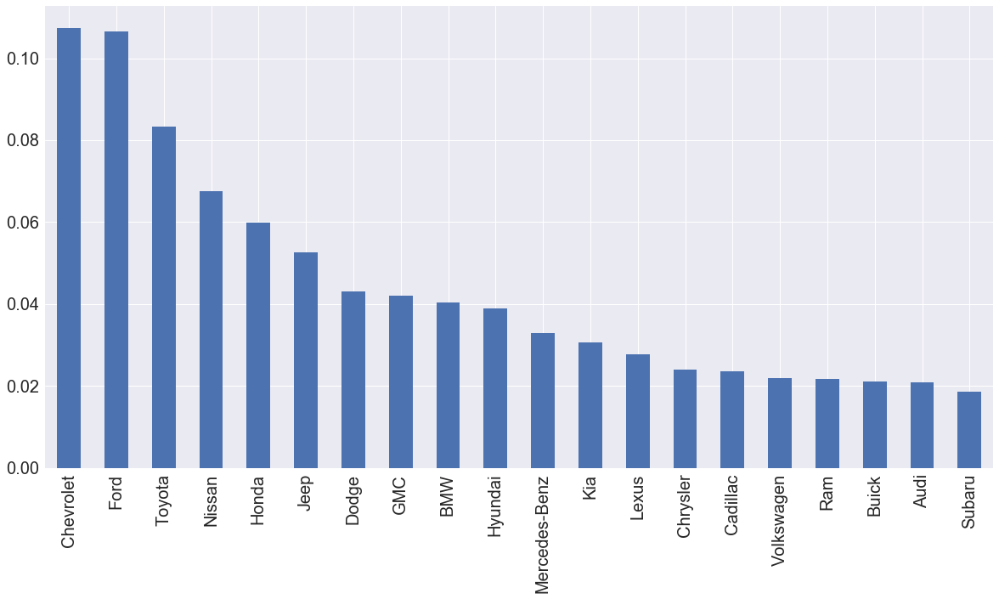

In [57]:
fig,ax = plt.subplots(figsize=(20,10))
ax.tick_params(labelsize=20)
pd.DataFrame(car_make_portion[:20]).plot(kind = 'bar', ax = ax, legend = False)

In [126]:
def base_metric(dt, feature,top=None):
    if not top:
        top = len(dt)
    selected_feature = dt[feature]
    feature_agg = selected_feature.value_counts()
    feature_sum = feature_agg.sum()
    portition = feature_agg*1.0/feature_sum
    top_portition = portition[:top]
    top_total = top_portition.sum()
    return top_portition, top_total

def base_metric_plot(dt,title =''):
    fig,ax = plt.subplots(figsize=(20,10))
    ax.tick_params(labelsize=20)
    ax.set_title(title,fontsize=20) 
    pd.DataFrame(dt).plot(kind = 'bar', ax = ax, legend = False)

In [89]:
car_state_group = car_fax.groupby(by='dealer_state')

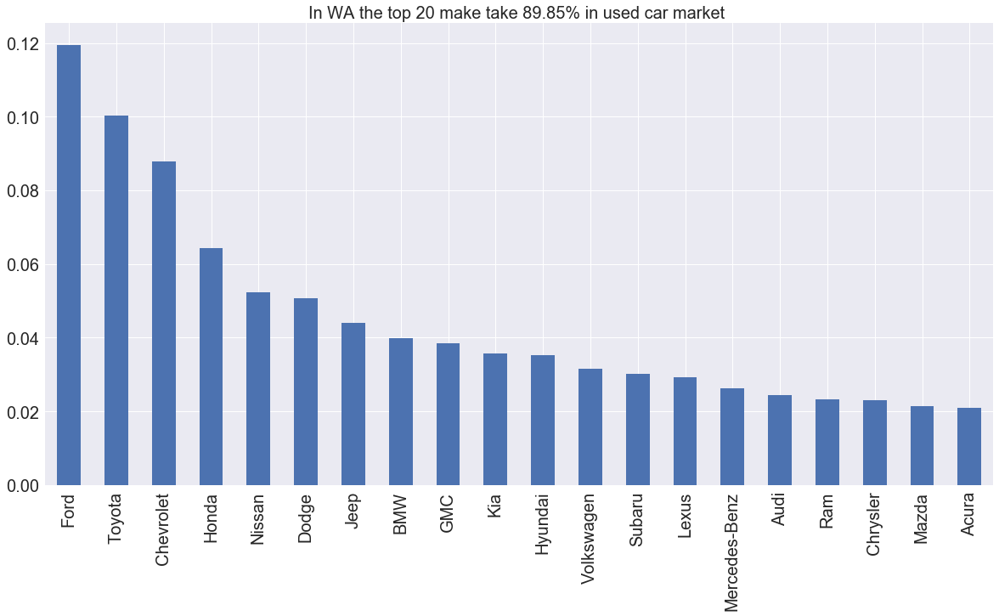

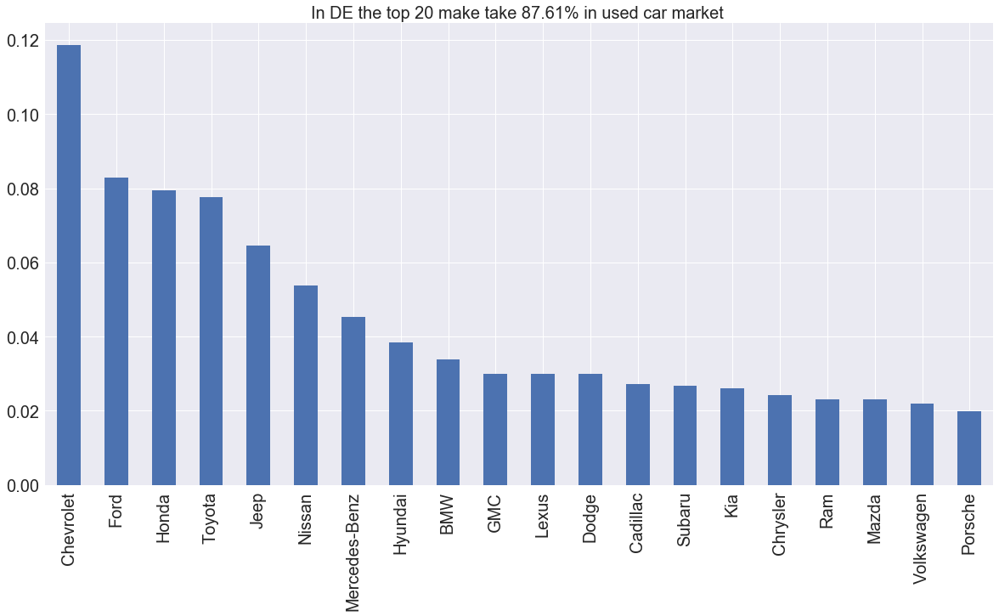

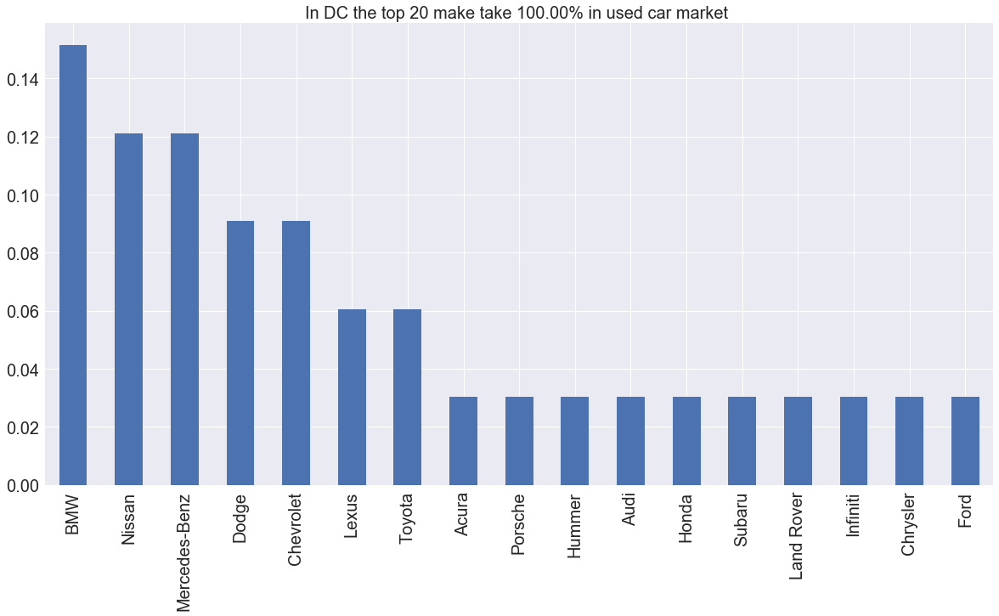

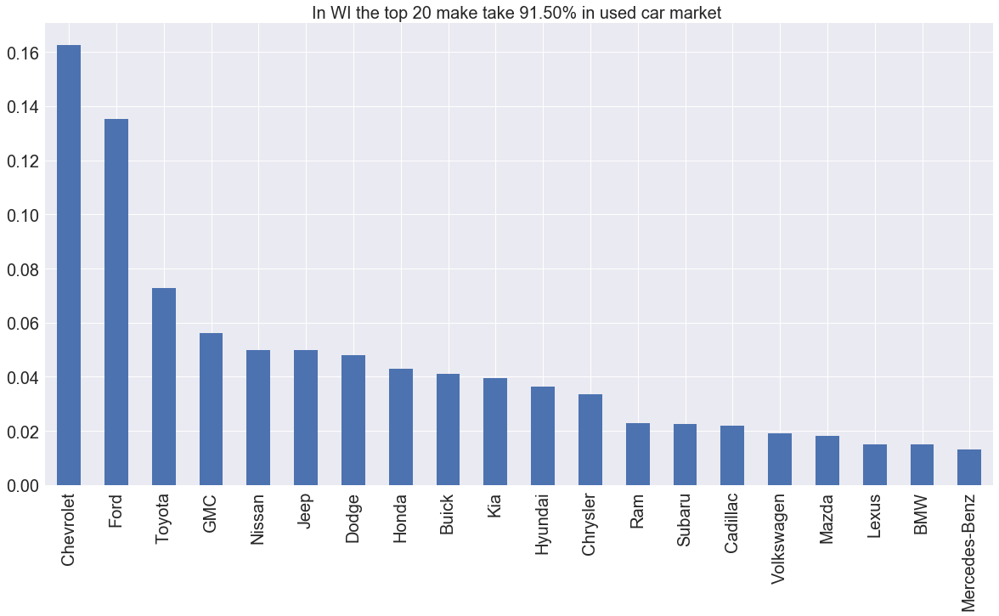

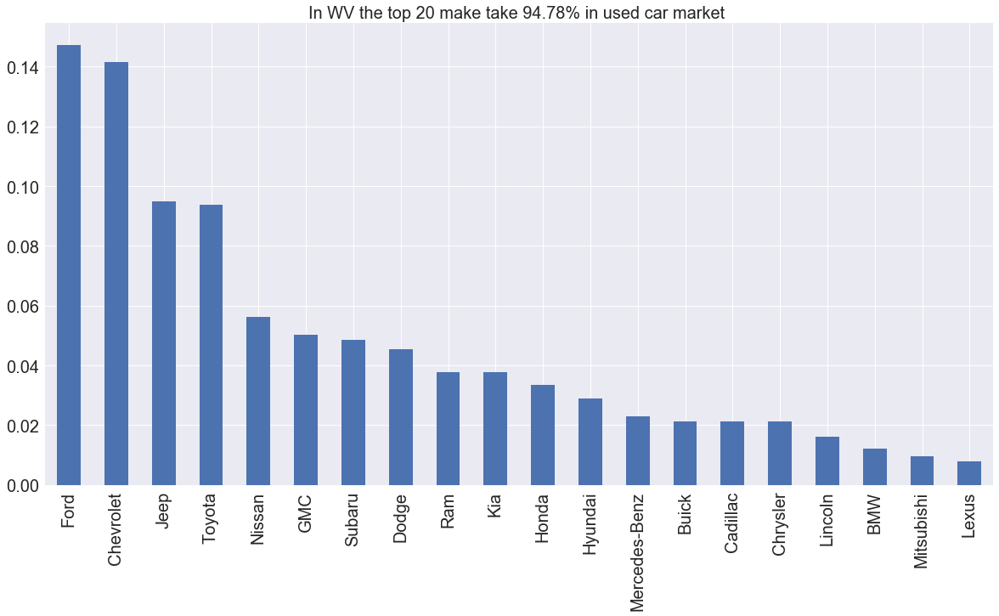

...

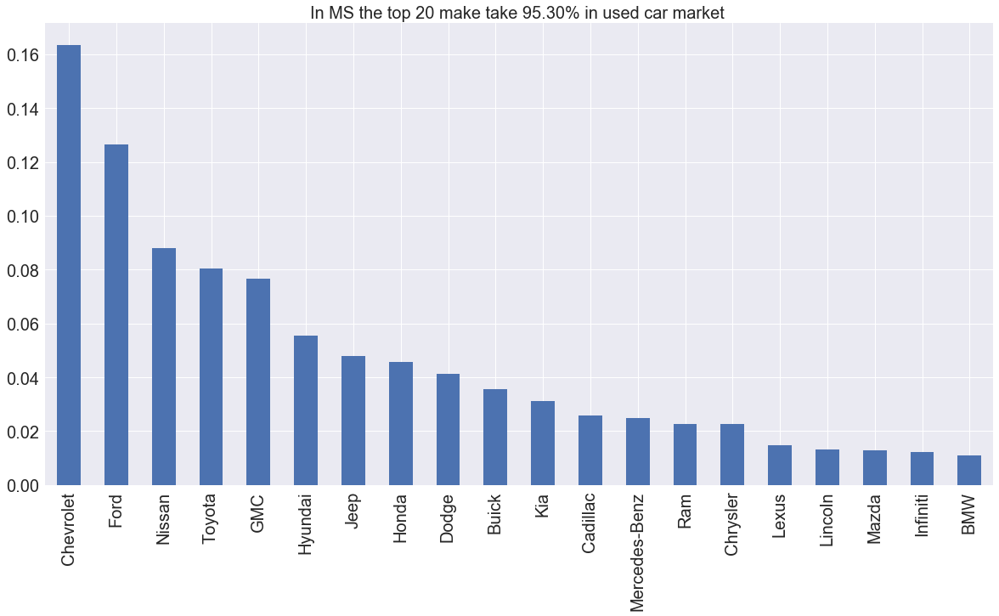

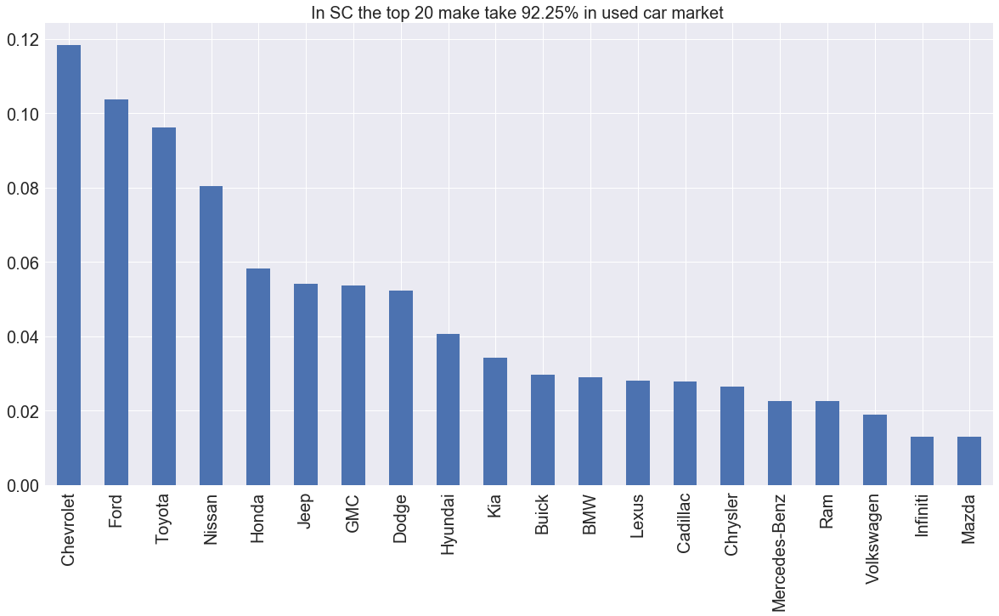

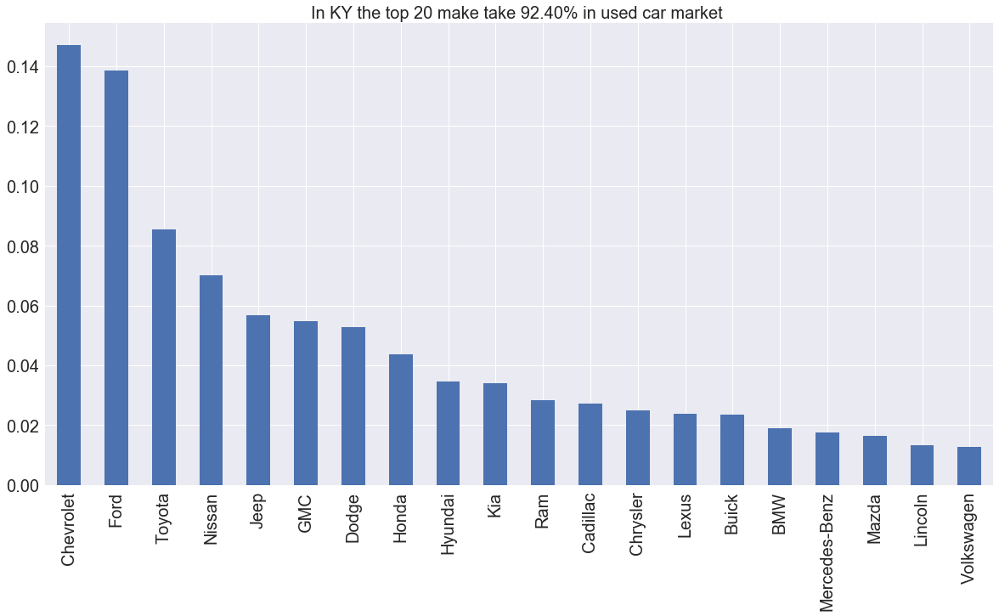

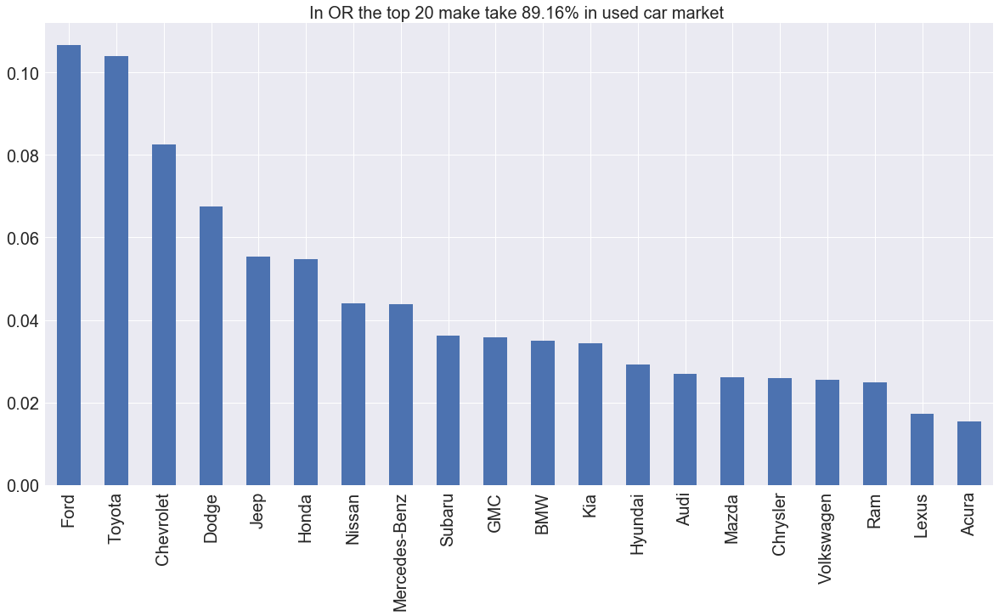

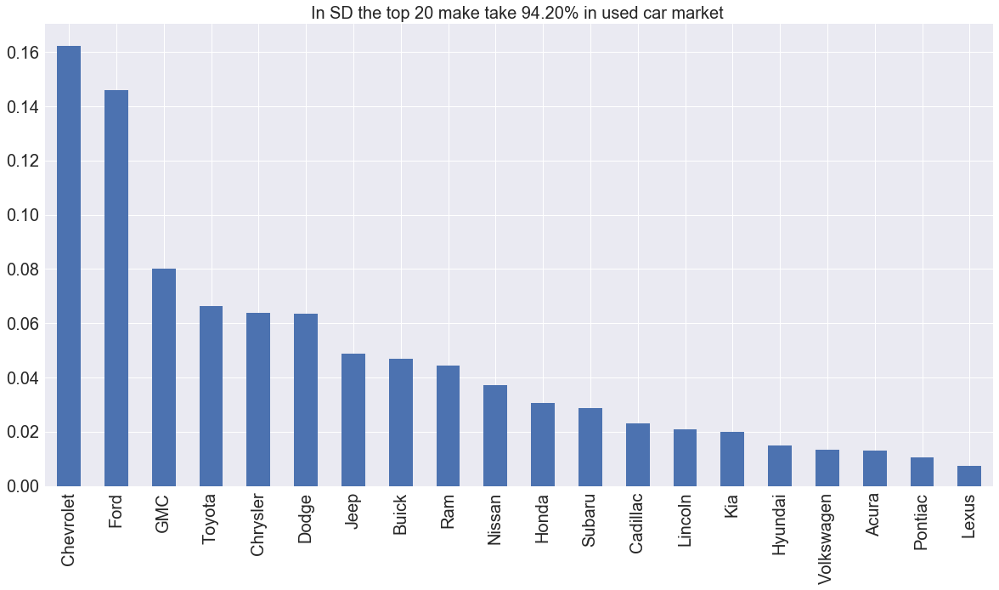

In [123]:
for state in car_state_group.groups.keys():
    dt =car_state_group.get_group(state)
    top = 20
    top_portition, top_total = base_metric(dt, 'car_make', top)
    title =  'In {} the top {} make take {}% in used car market '.format(state, top, "{0:.2f}".format(top_total*100))
    base_metric_plot(top_portition, title)

# explore the popular car models in US and each state

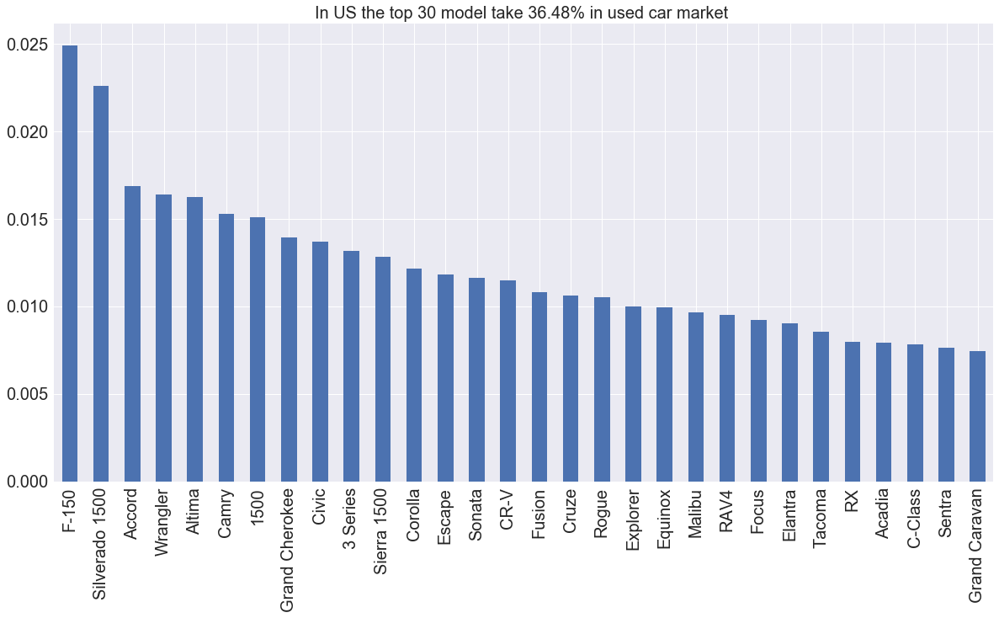

In [124]:
top = 30
top_portition, top_total = base_metric(car_fax, 'car_model', top)
title =  'In {} the top {} model take {}% in used car market '.format('US', top, "{0:.2f}".format(top_total*100))
base_metric_plot(top_portition, title)

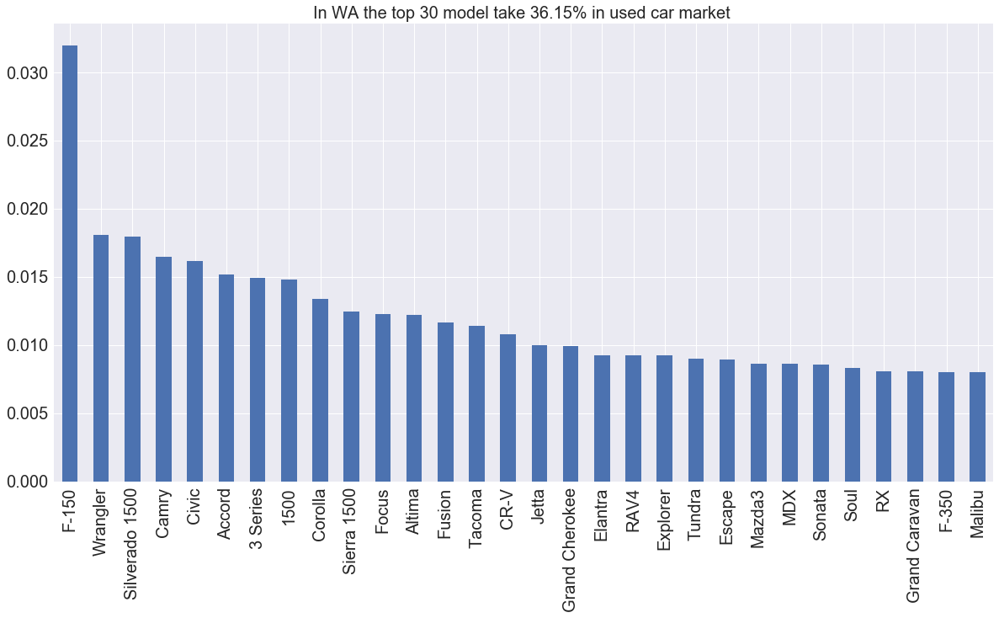

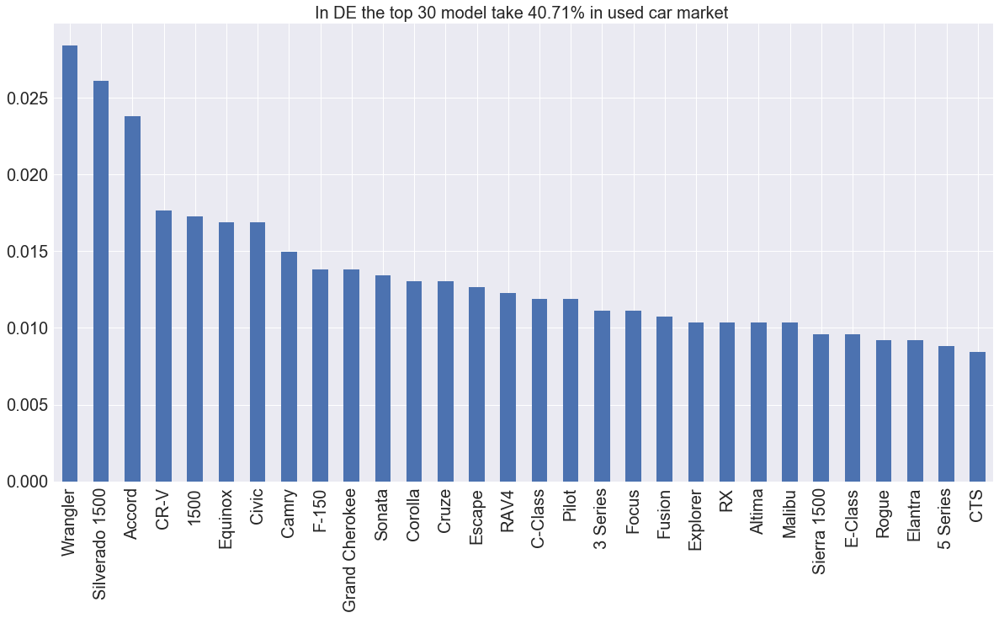

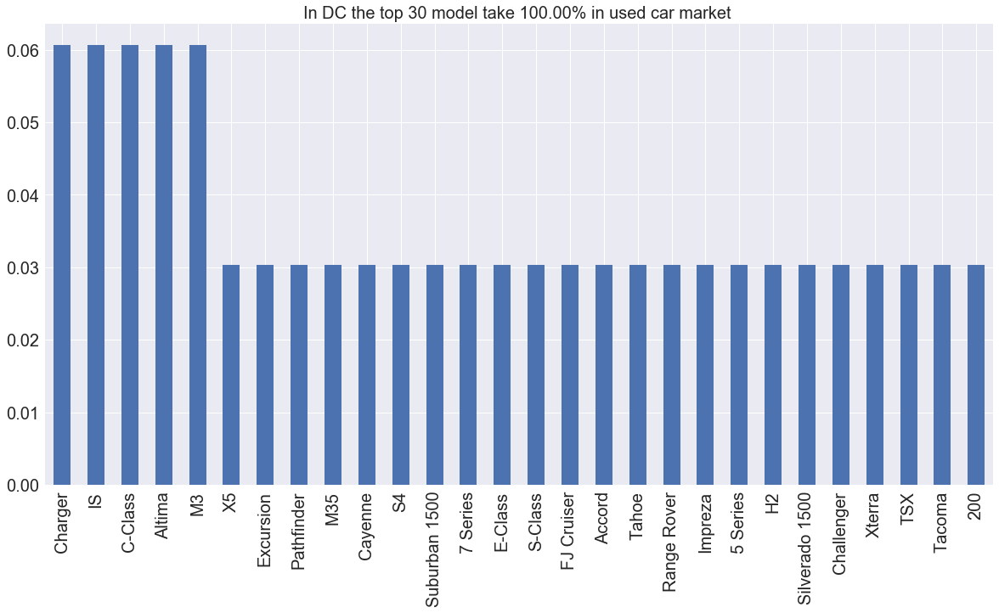

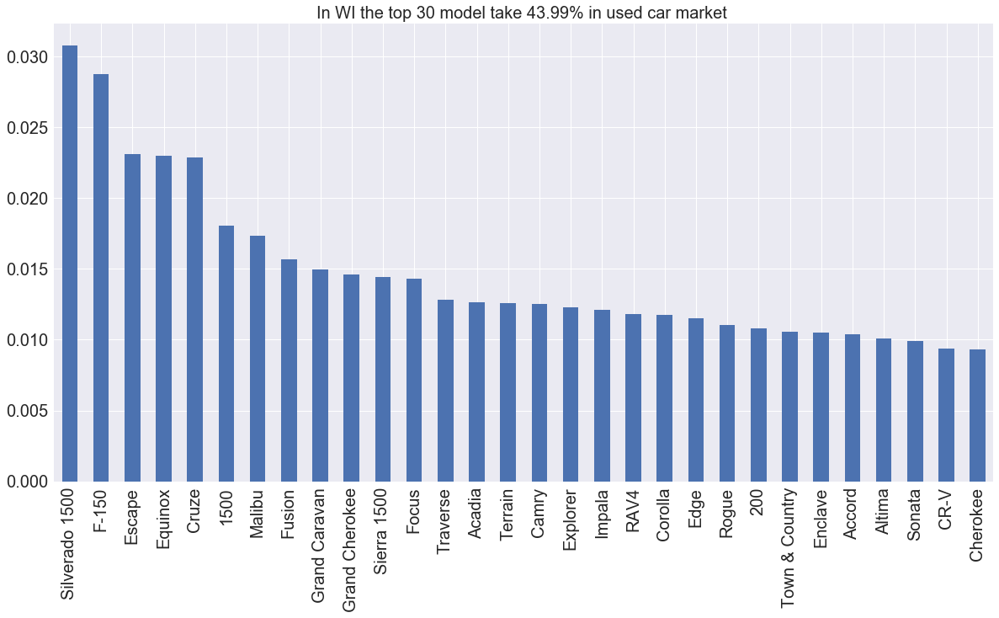

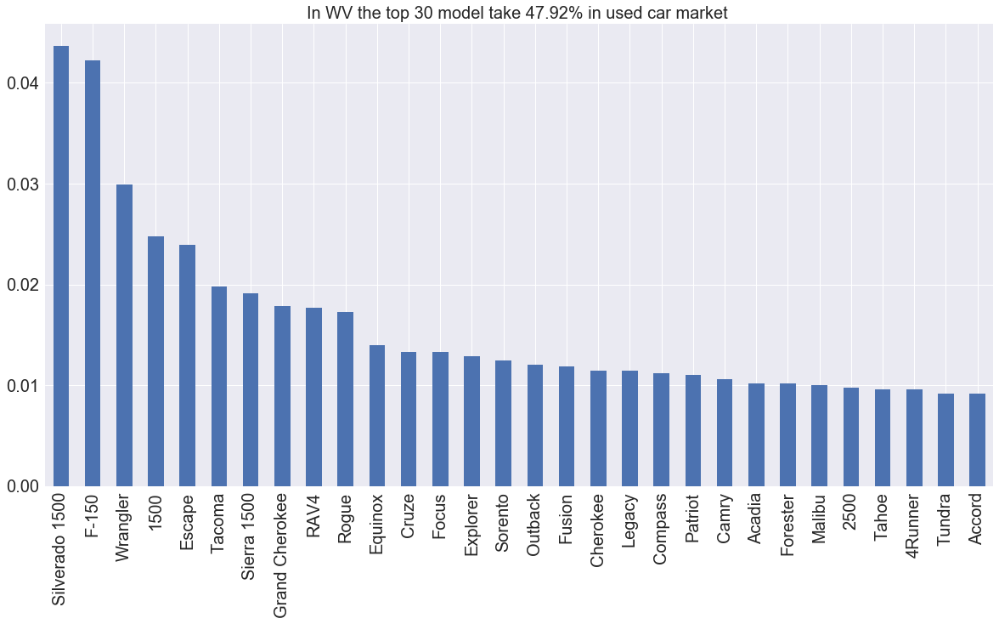

...

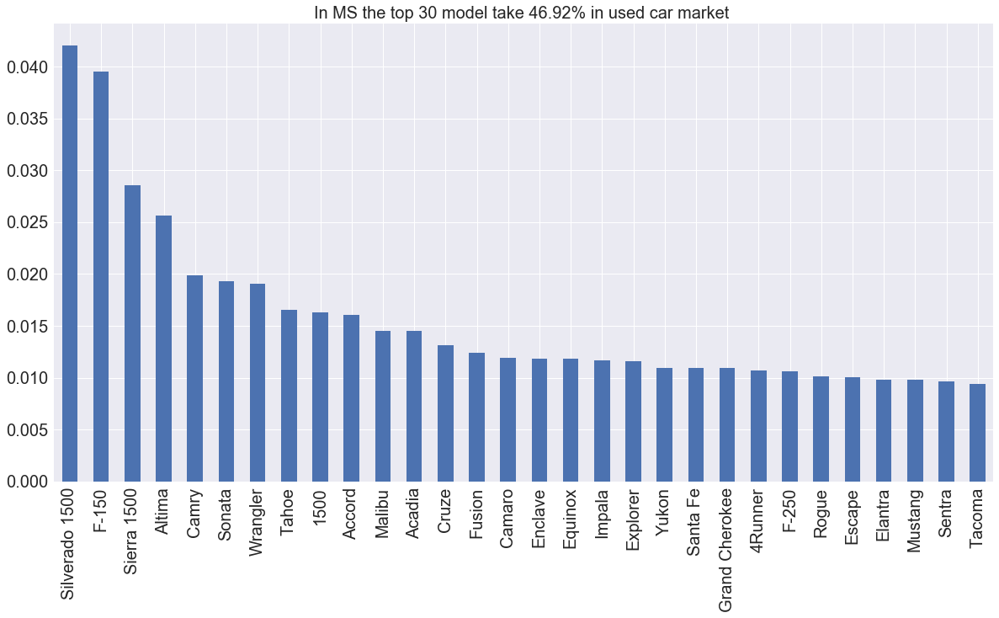

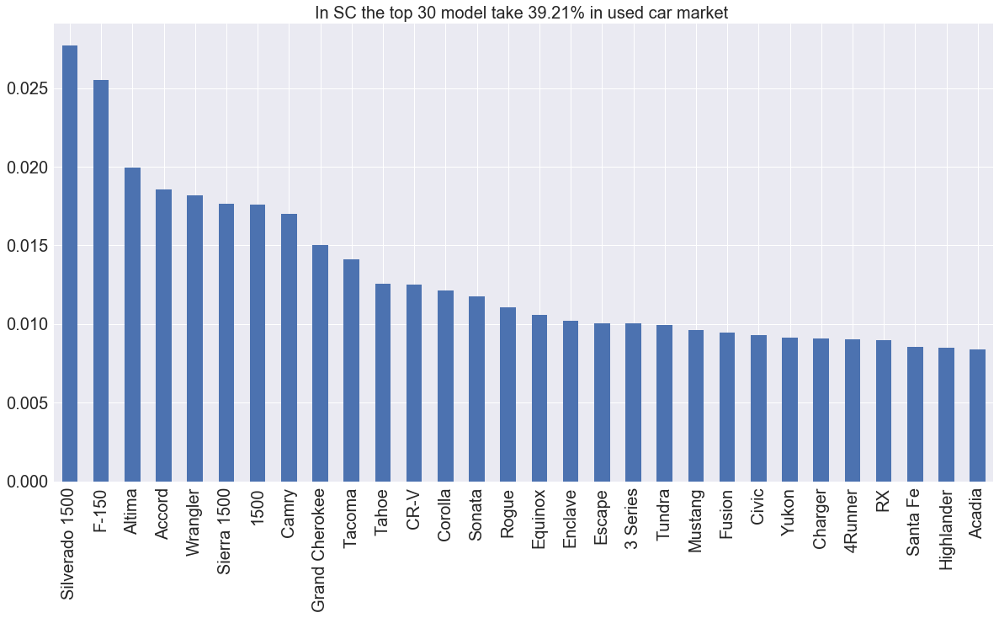

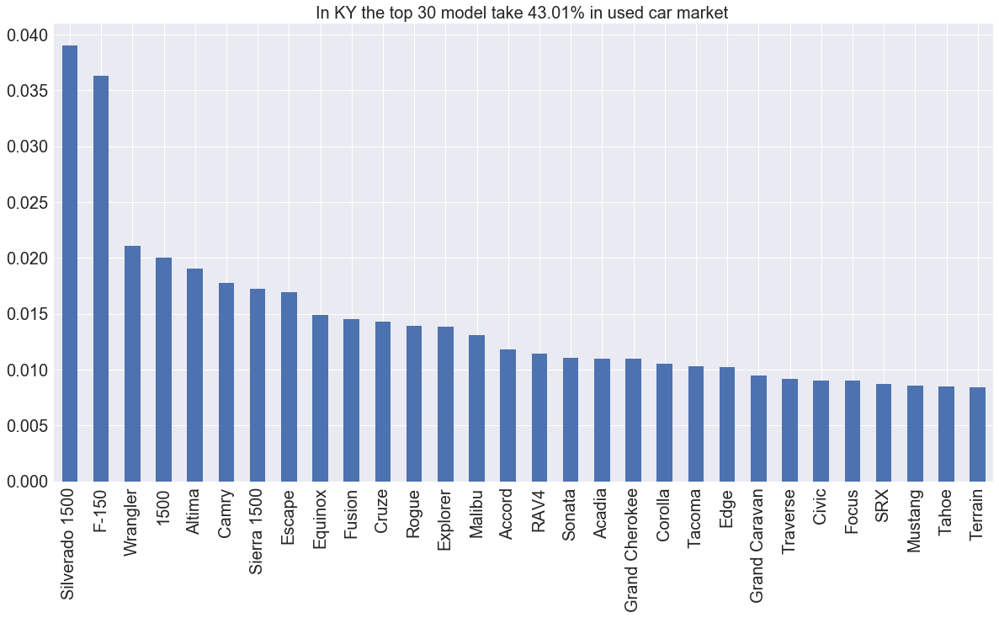

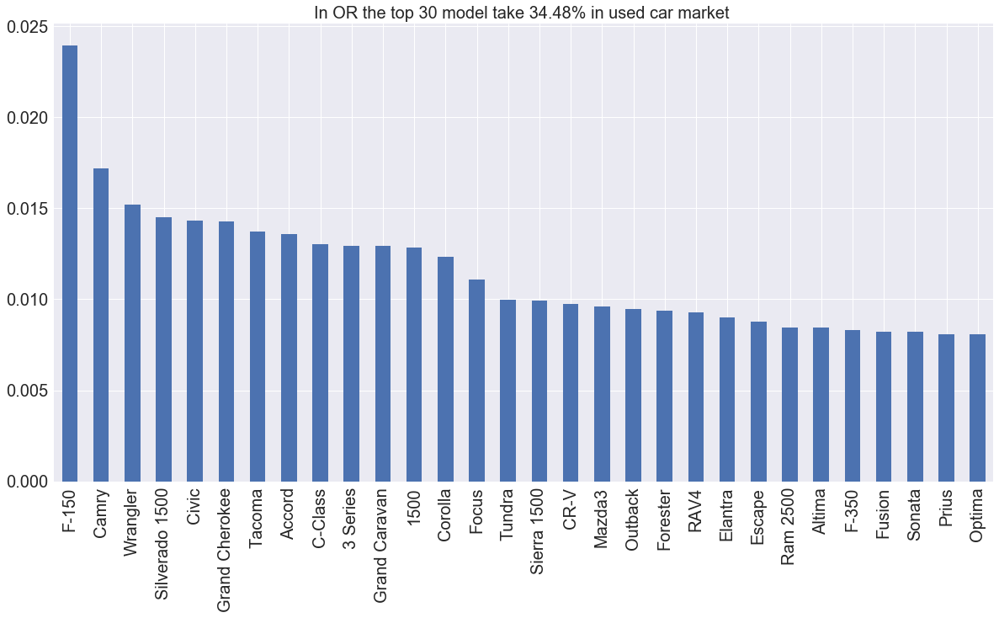

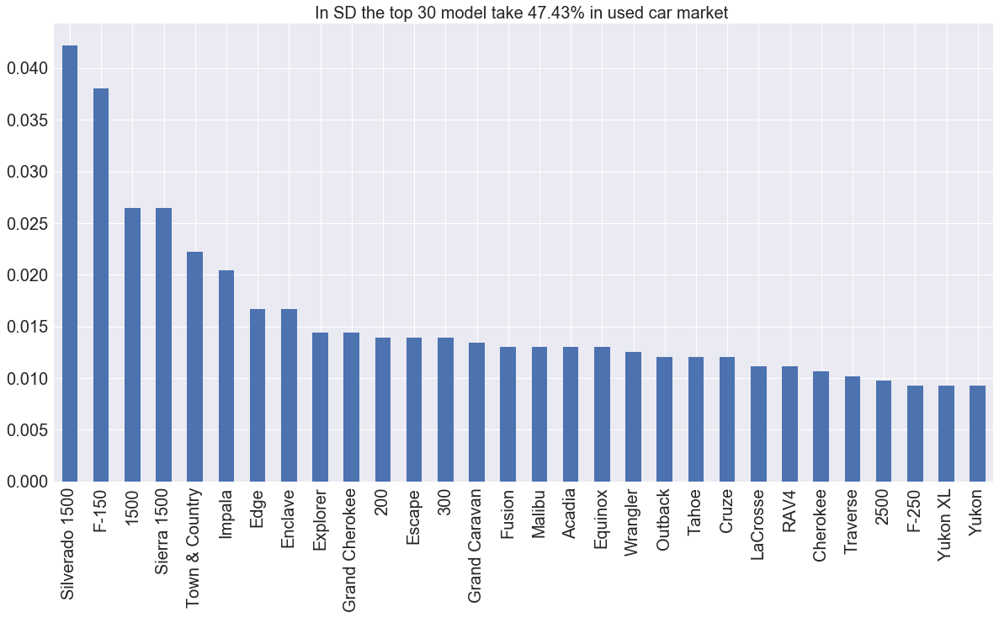

In [125]:
for state in car_state_group.groups.keys():
    dt =car_state_group.get_group(state)
    top = 30
    top_portition, top_total = base_metric(dt, 'car_model', top)
    title =  'In {} the top {} model take {}% in used car market '.format(state, top, "{0:.2f}".format(top_total*100))
    base_metric_plot(top_portition, title)

# explore the share of each state in Used Car market

In [116]:
state_total = car_fax['dealer_state'].value_counts()
us_total = state_share.sum()
state_share = state_total*1.0/us_total

In [118]:
state_share.head()

TX   0.10
CA   0.09
FL   0.08
PA   0.05
OH   0.04
Name: dealer_state, dtype: float64

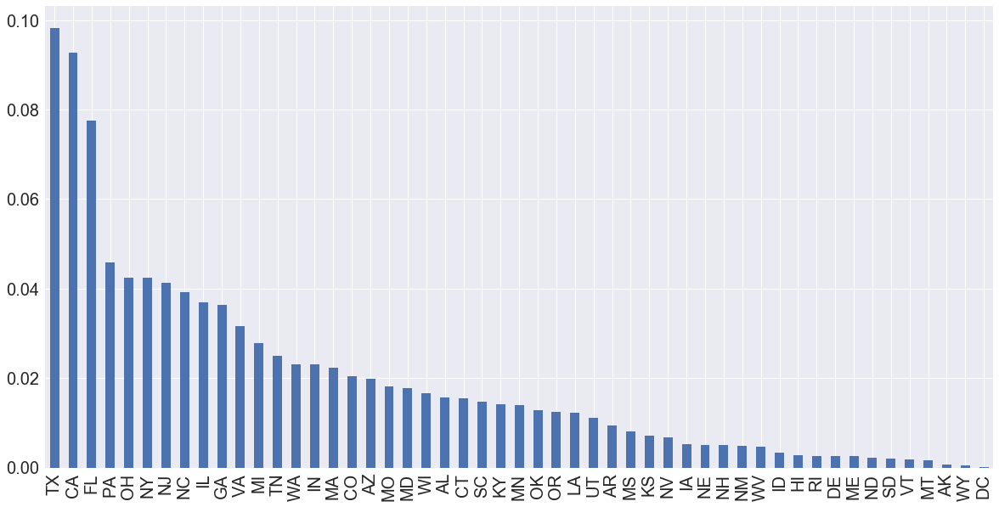

In [122]:
base_metric_plot(state_share)

# Explore the car drivetype, engine,  bodytype, and fuel  in US and each state

In [127]:
car_fax.columns

Index([u'dealer_id', u'dealer_name', u'dealer_city', u'dealer_state',
       u'car_vin', u'car_year', u'car_make', u'car_topOptions', u'car_model',
       u'car_trim', u'car_mileage', u'car_list_price', u'car_current_price',
       u'car_exteriorColor', u'car_interiorColor', u'car_engine',
       u'car_displacement', u'car_drivetype', u'car_transmission', u'car_fuel',
       u'car_mpgCity', u'car_mpgHighway', u'car_mpgCombined', u'car_bodytype',
       u'car_oneOwner', u'car_noAccidents', u'car_serviceRecords',
       u'car_personalUse', u'crawl_time'],
      dtype='object')

# Drivetype

In [133]:
us_drive_types = car_fax['car_drivetype'].value_counts()
us_drive_total = us_drive_types.sum()
us_drive_share = us_drive_types*1.0/us_drive_total

In [134]:
us_drive_share

FWD           0.44
4WD           0.20
AWD           0.20
RWD           0.16
Unspecified   0.00
2WD           0.00
Name: car_drivetype, dtype: float64

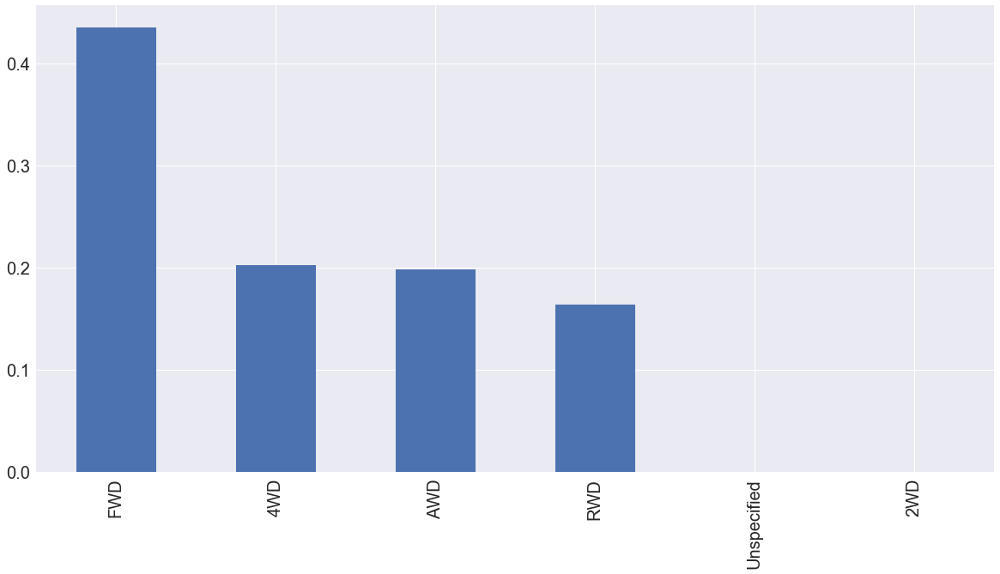

In [135]:
base_metric_plot(us_drive_share)

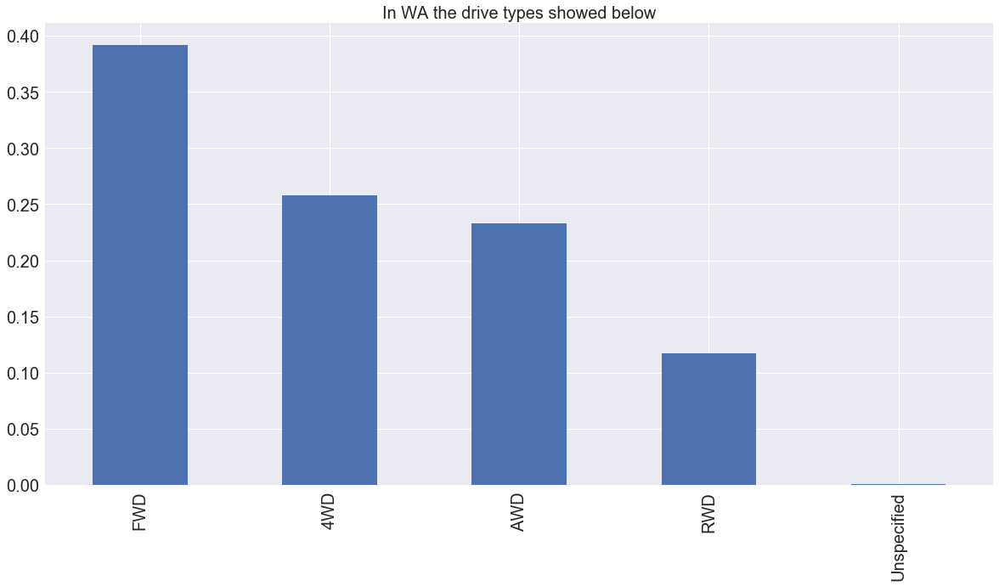

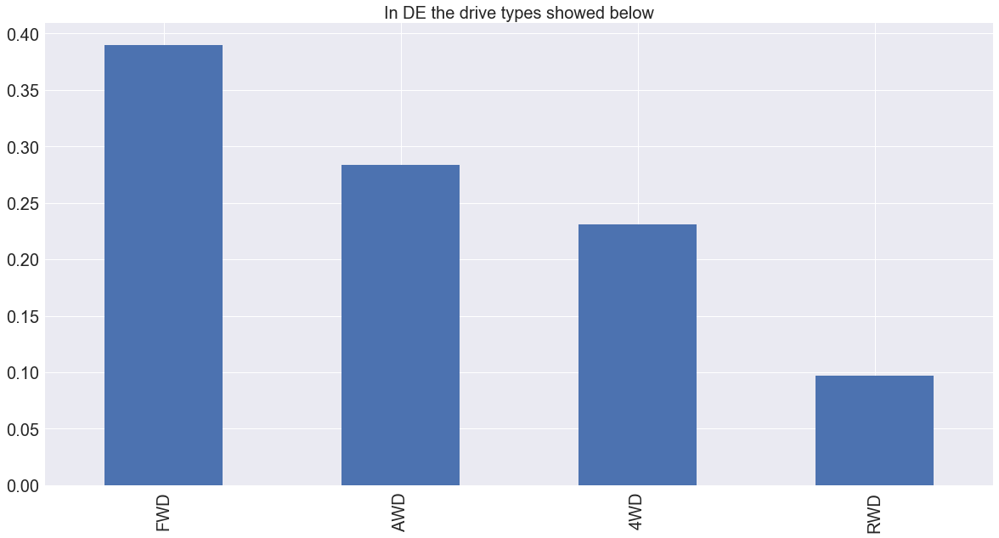

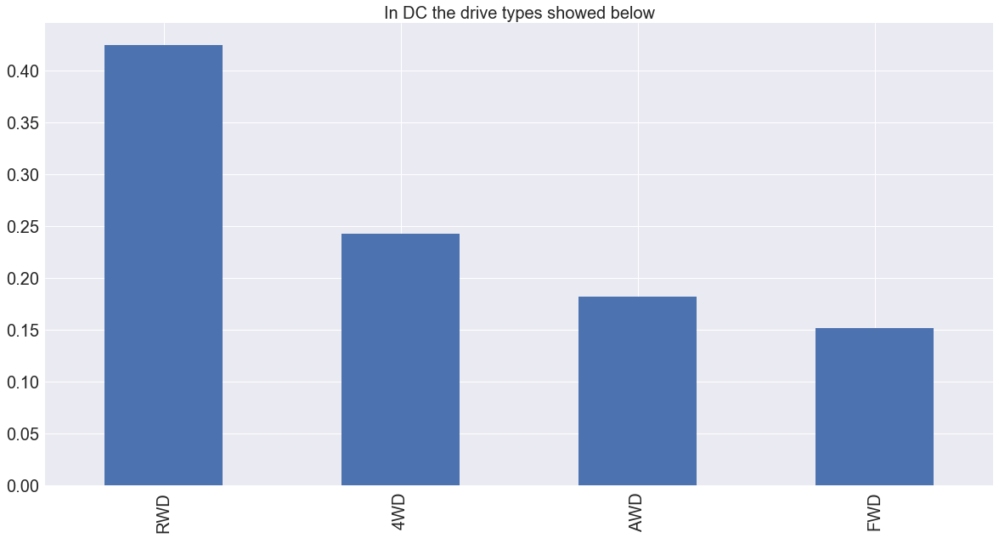

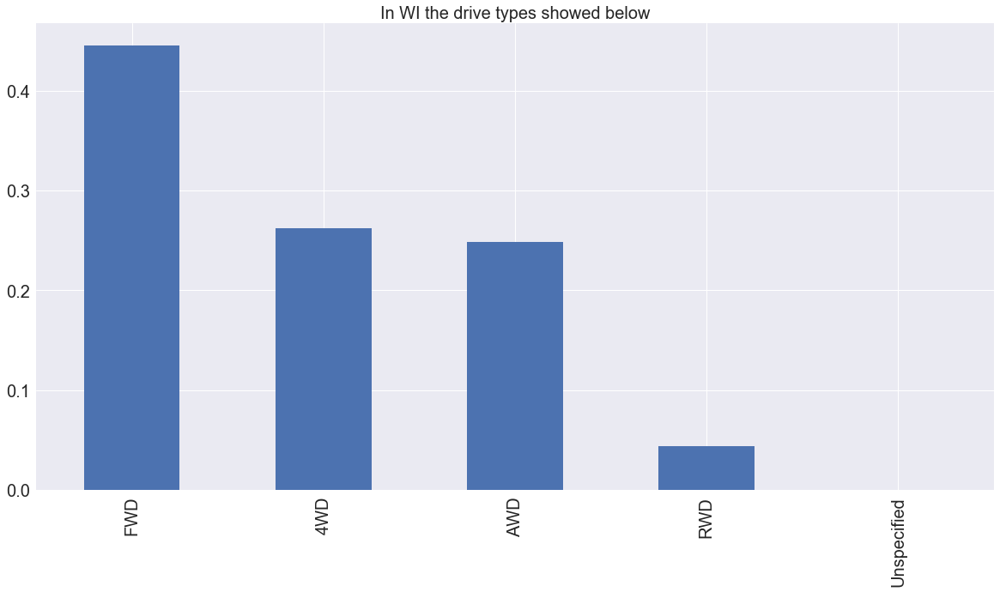

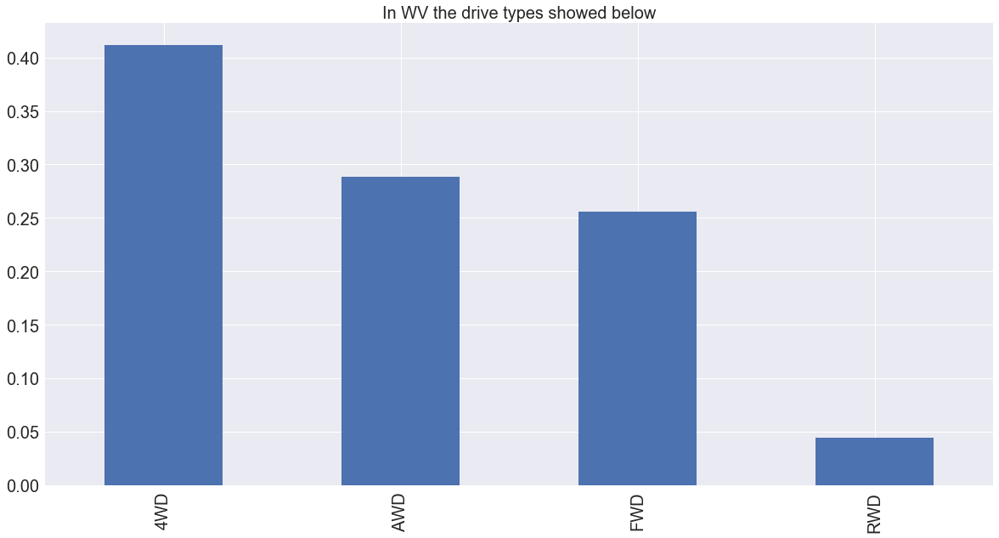

...

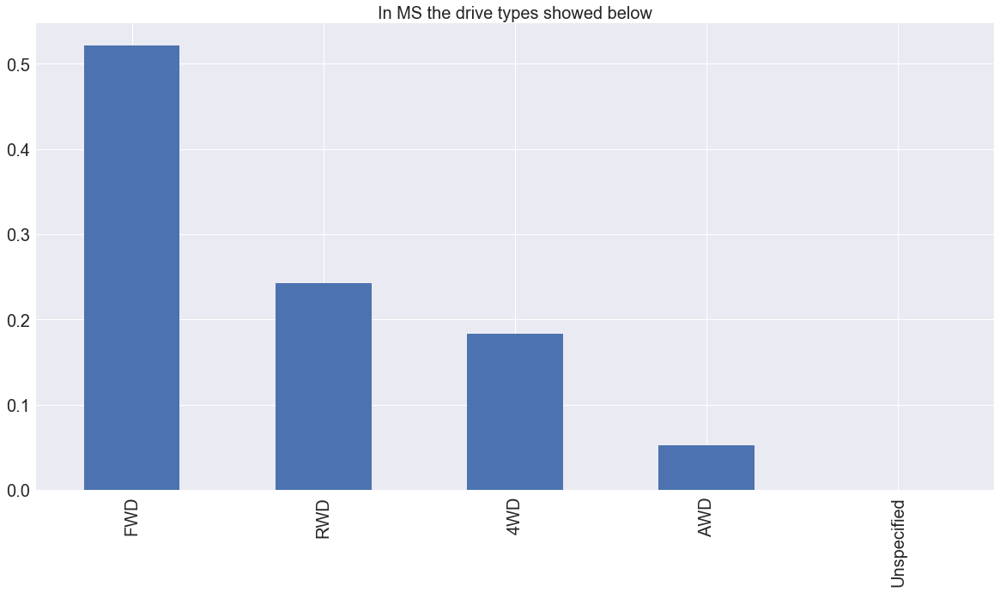

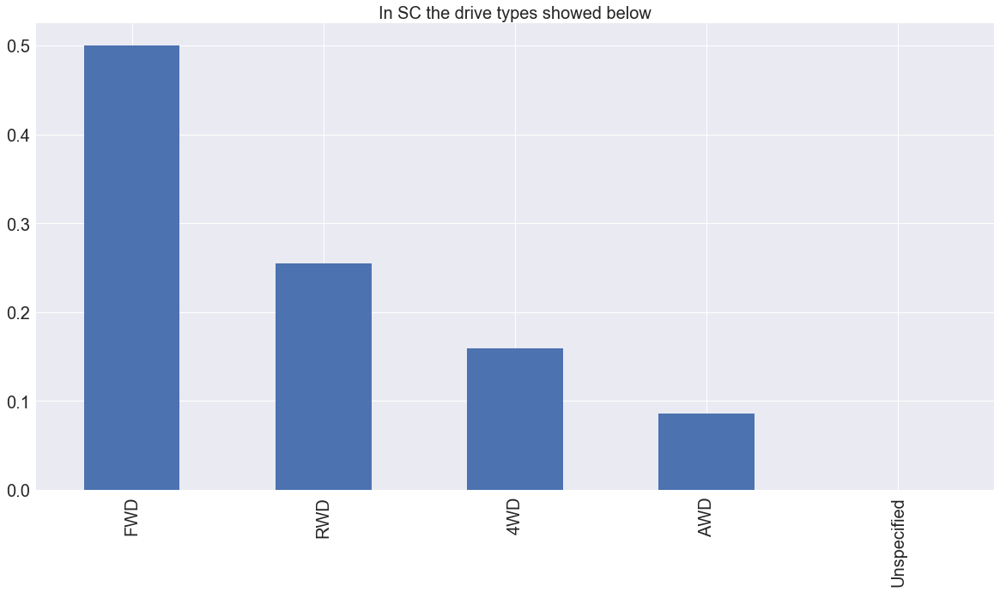

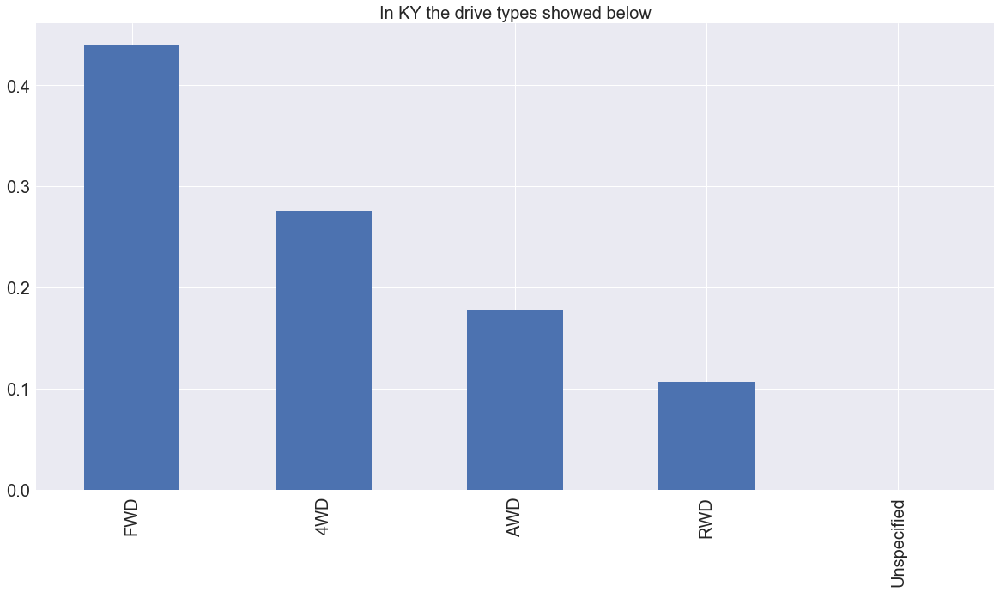

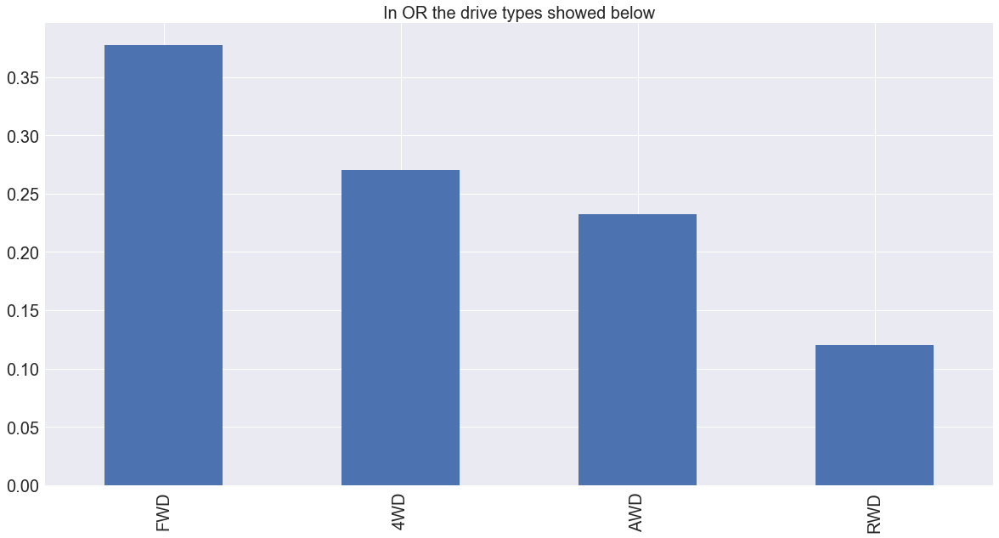

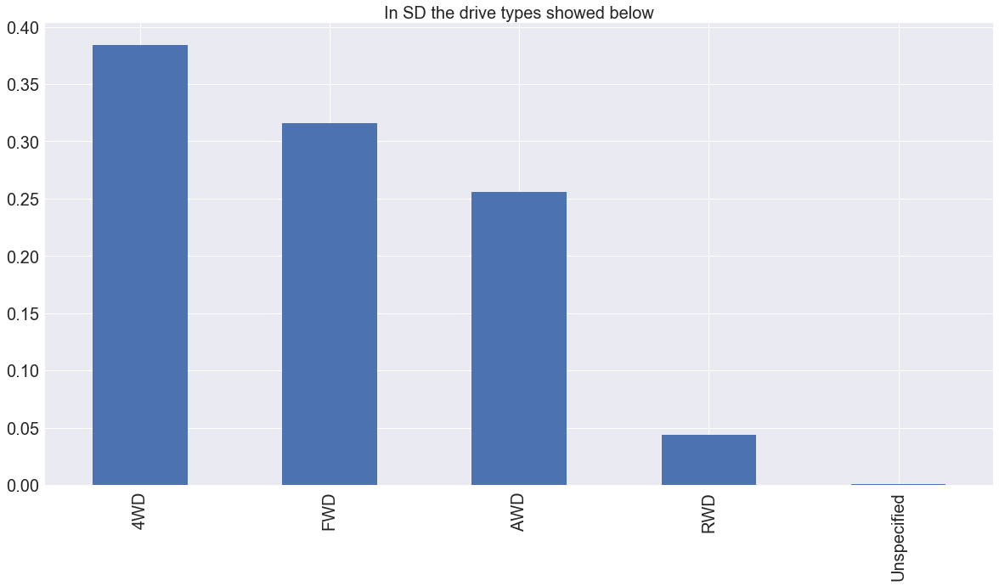

In [137]:
for state in car_state_group.groups.keys():
    dt =car_state_group.get_group(state)
    top_portition, top_total = base_metric(dt, 'car_drivetype')
    title =  'In {} the drive types showed below'.format(state)
    base_metric_plot(top_portition, title)

# Engine

In [140]:
us_engine_types = car_fax['car_engine'].value_counts()
us_engine_total = us_engine_types.sum()
us_engine_share = us_engine_types*1.0/us_engine_total

In [141]:
us_engine_share

4 Cyl         0.43
6 Cyl         0.37
8 Cyl         0.18
5 Cyl         0.01
3 Cyl         0.00
12 Cyl        0.00
Electric      0.00
10 Cyl        0.00
2 Cyl         0.00
Rotary        0.00
Unspecified   0.00
Name: car_engine, dtype: float64

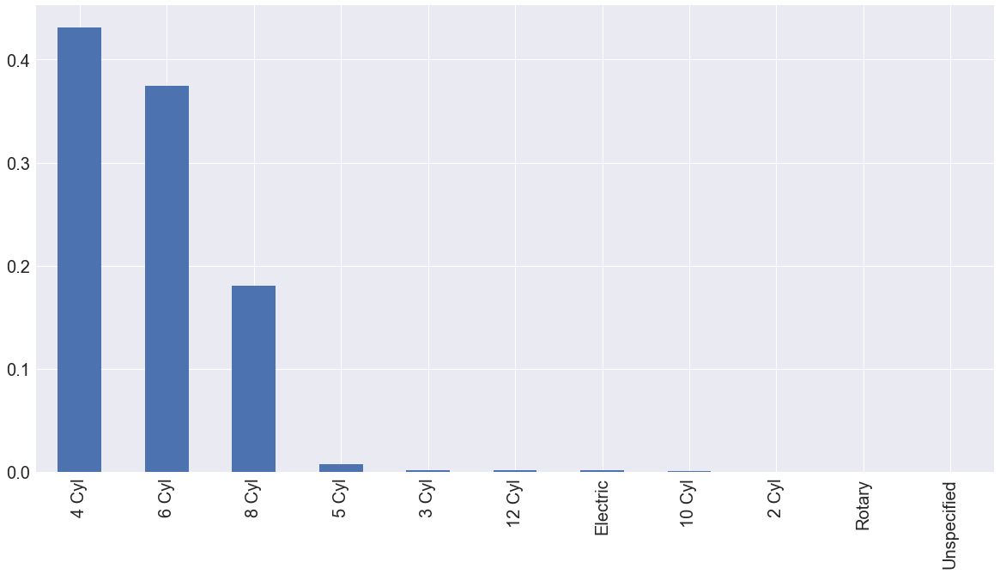

In [142]:
base_metric_plot(us_engine_share)

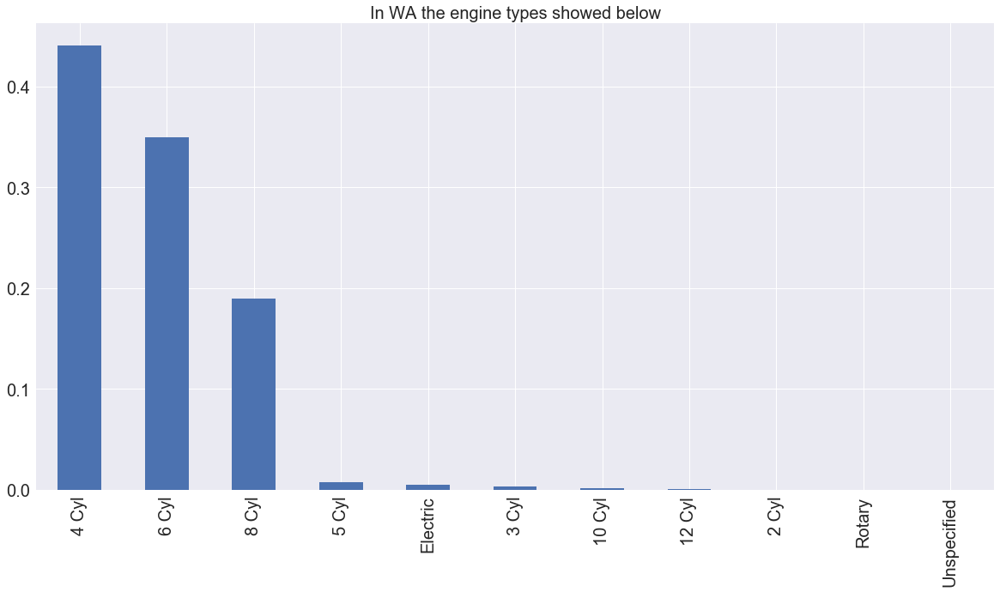

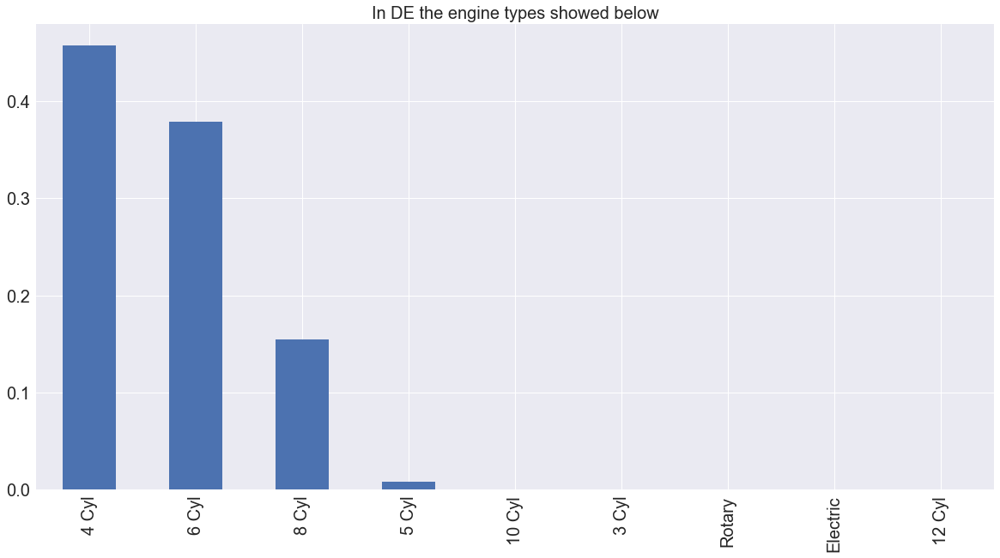

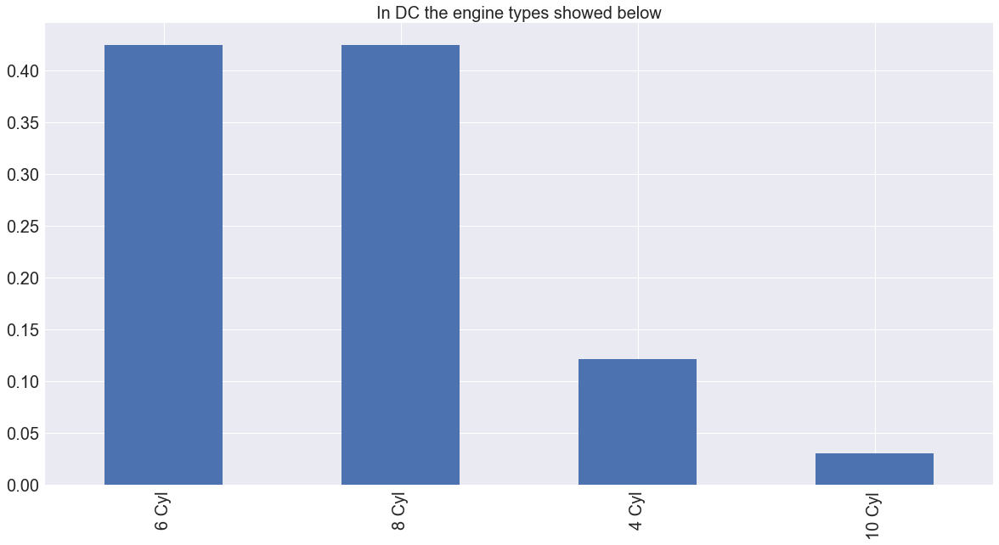

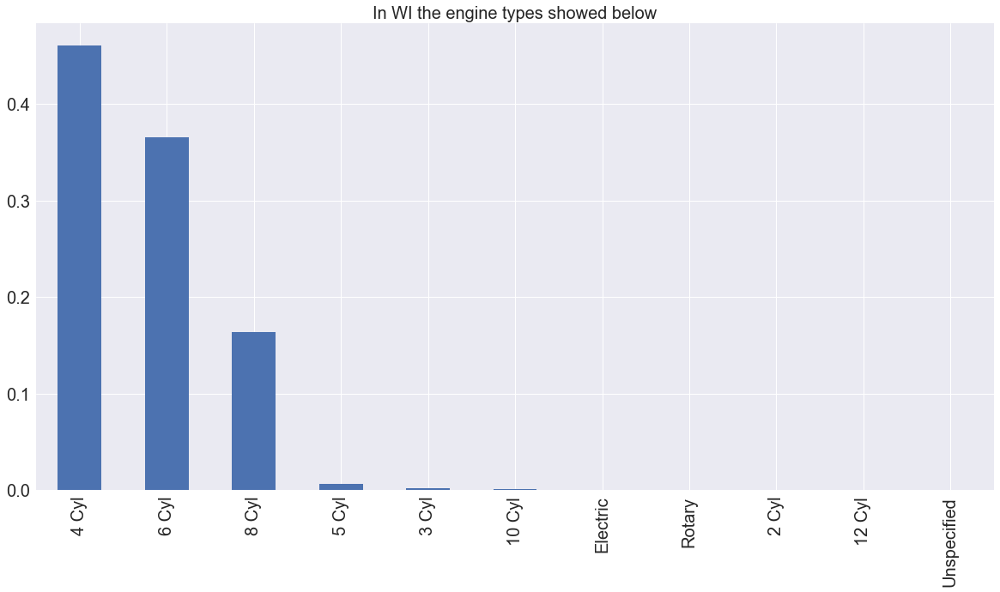

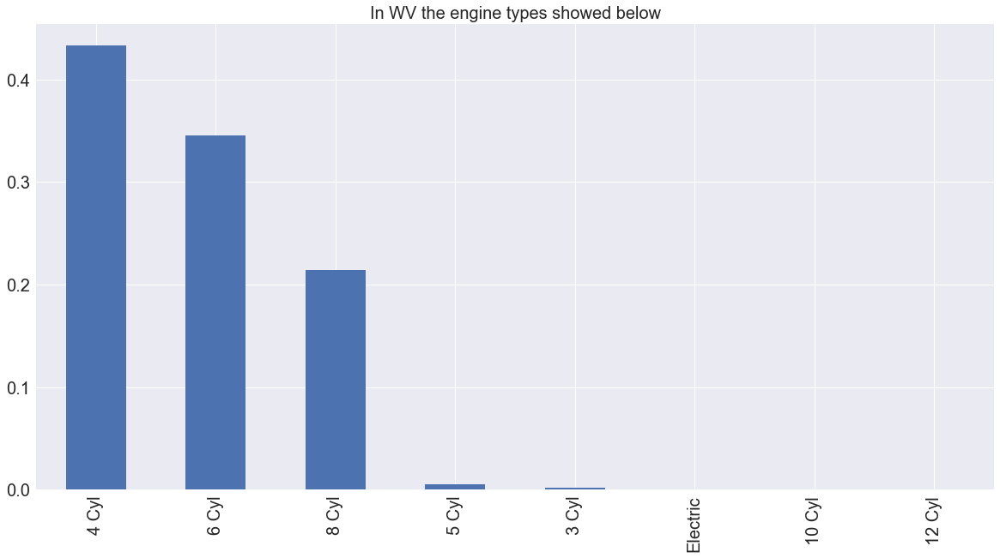

...

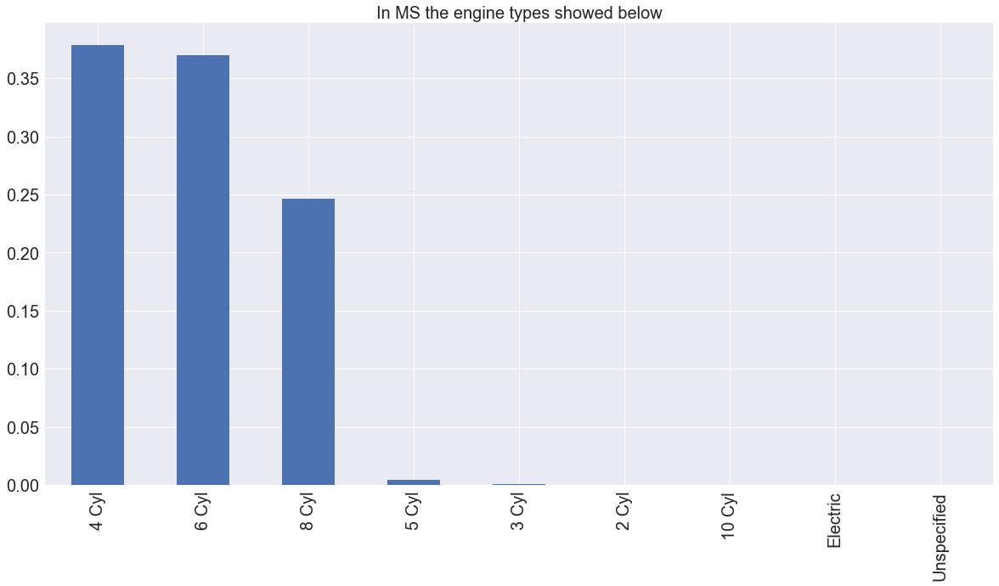

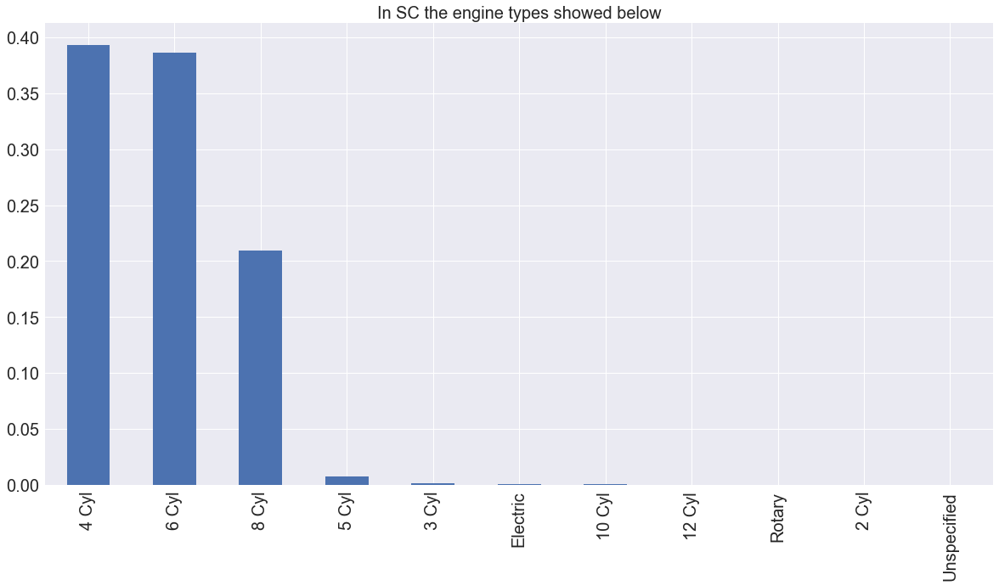

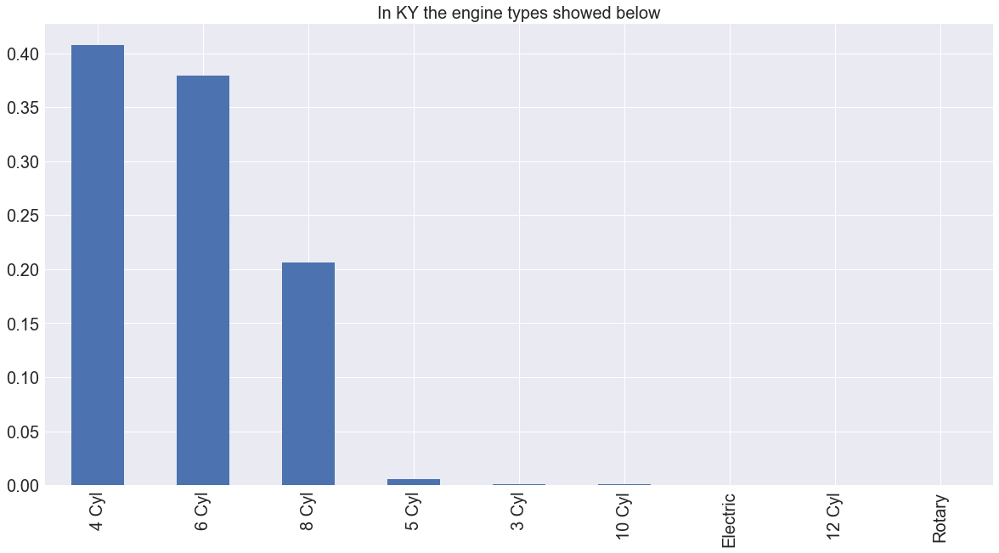

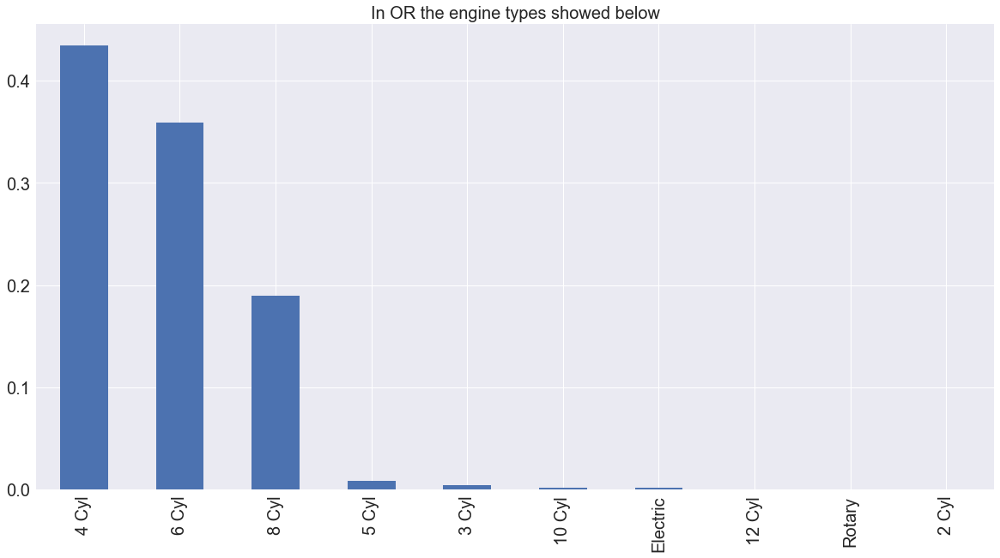

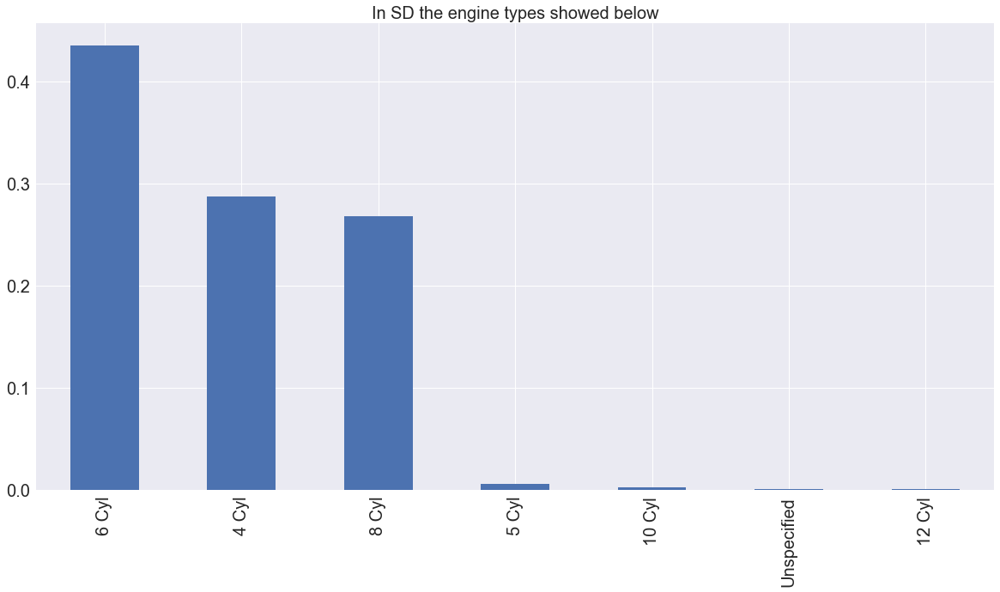

In [143]:
for state in car_state_group.groups.keys():
    dt =car_state_group.get_group(state)
    top_portition, top_total = base_metric(dt, 'car_engine')
    title =  'In {} the engine types showed below'.format(state)
    base_metric_plot(top_portition, title)

# Fuel

In [144]:
us_fuel_types = car_fax['car_fuel'].value_counts()
us_fuel_total = us_fuel_types.sum()
us_fuel_share = us_fuel_types*1.0/us_fuel_total

In [145]:
us_fuel_share

Gasoline        0.84
Flexible-Fuel   0.12
Diesel          0.03
Hybrid          0.02
Electric        0.00
Unspecified     0.00
Alternative     0.00
Name: car_fuel, dtype: float64

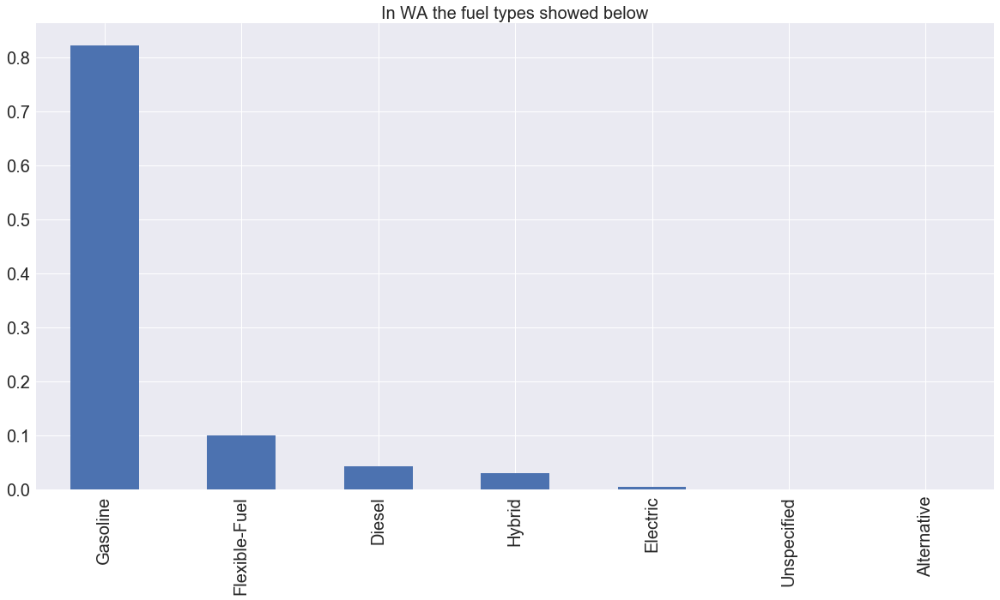

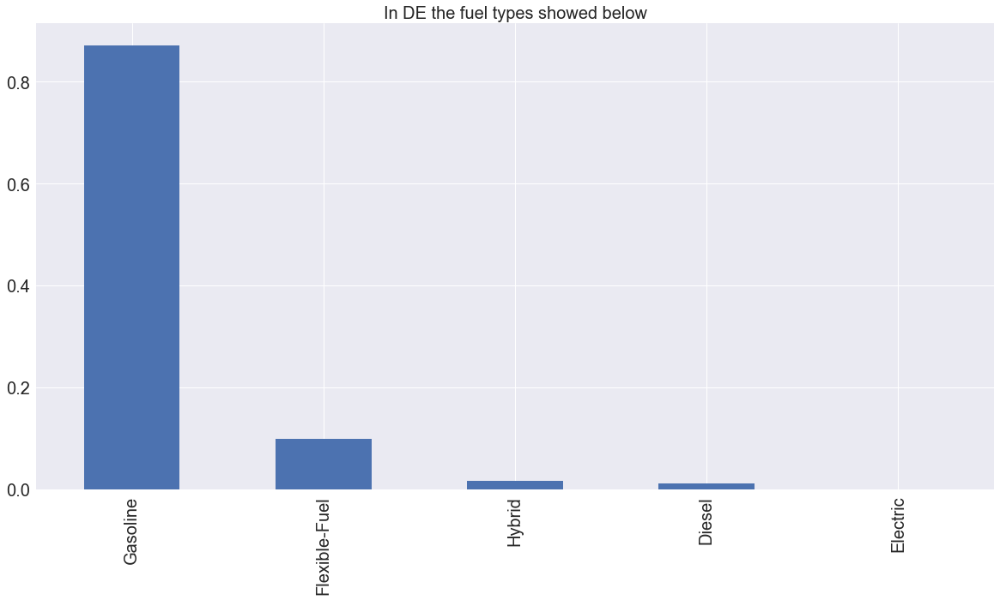

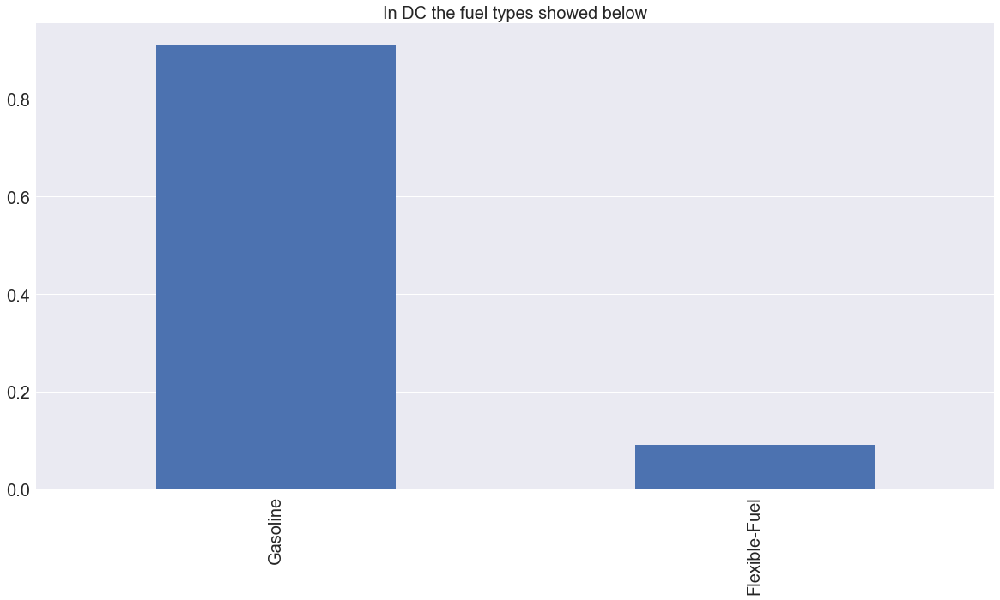

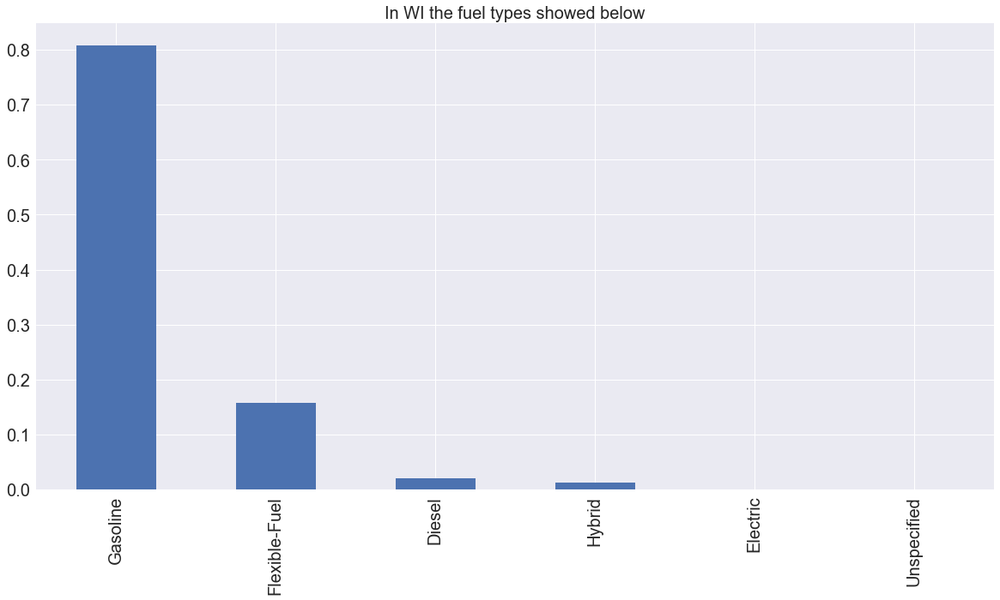

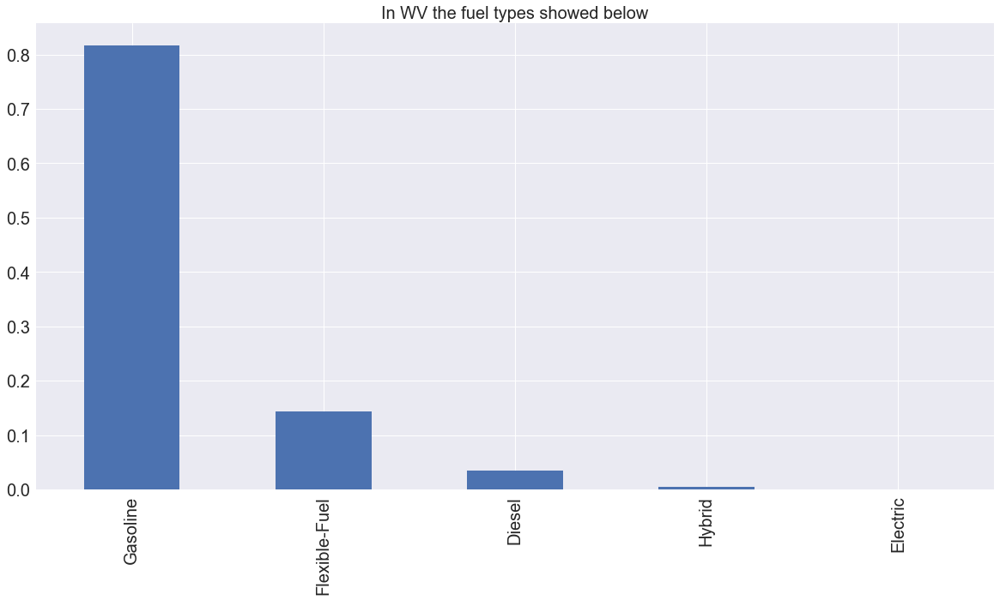

...

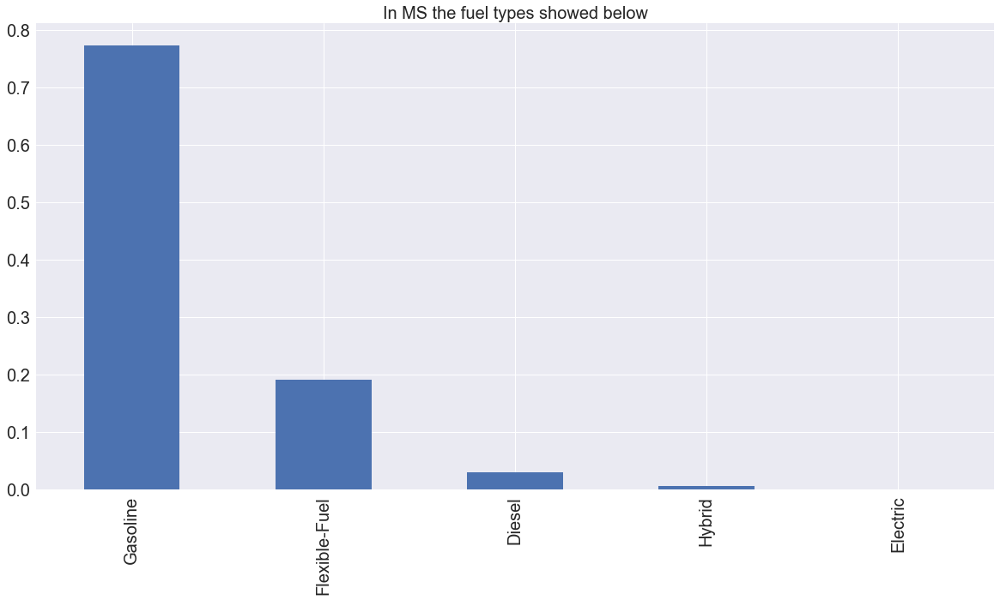

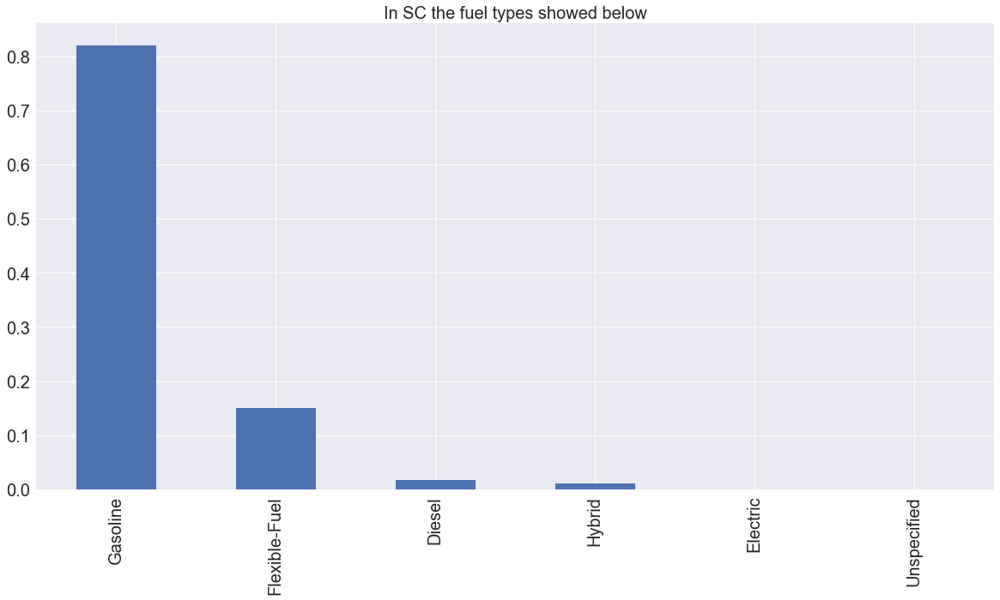

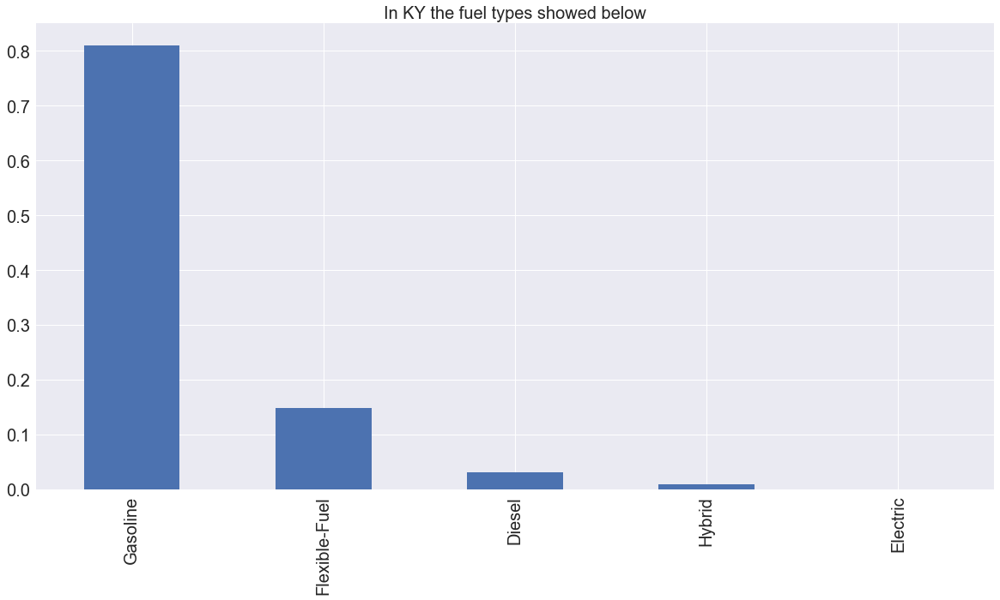

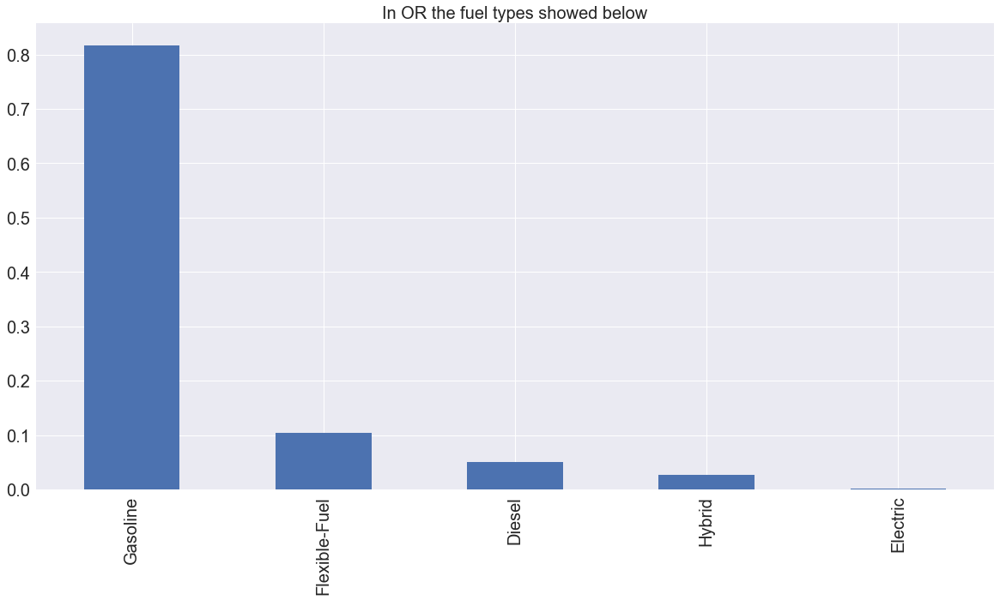

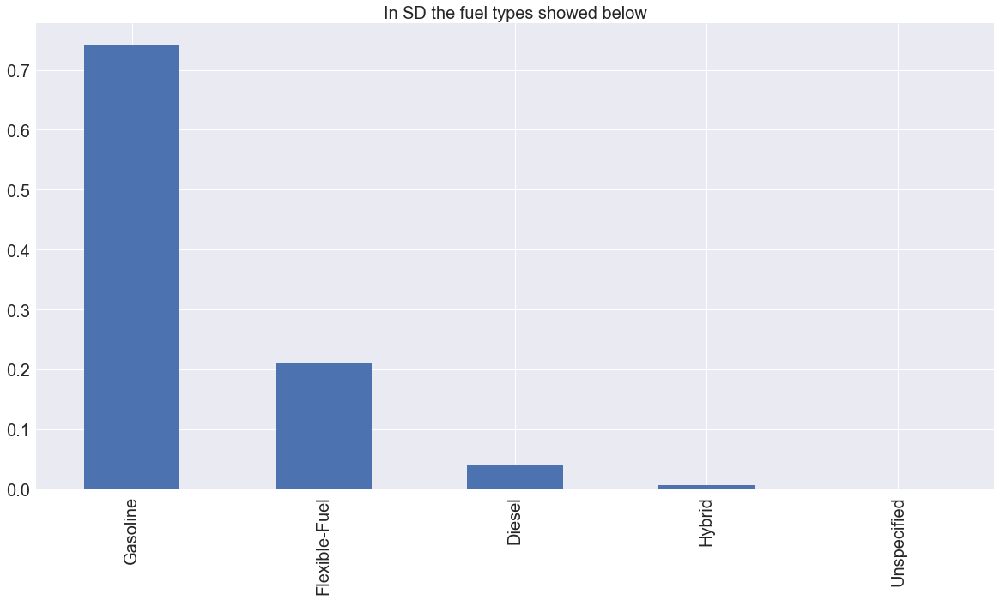

In [146]:
for state in car_state_group.groups.keys():
    dt =car_state_group.get_group(state)
    top_portition, top_total = base_metric(dt, 'car_fuel')
    title =  'In {} the fuel types showed below'.format(state)
    base_metric_plot(top_portition, title)

# Body Type

In [147]:
us_body_types = car_fax['car_bodytype'].value_counts()
us_body_total = us_body_types.sum()
us_body_share = us_body_types*1.0/us_body_total

In [148]:
us_body_share

SUV           0.36
Sedan         0.33
Pickup        0.13
Coupe         0.04
Hatchback     0.04
Minivan       0.03
Wagon         0.02
Convertible   0.02
Van           0.01
Chassis       0.00
Unspecified   0.00
Name: car_bodytype, dtype: float64

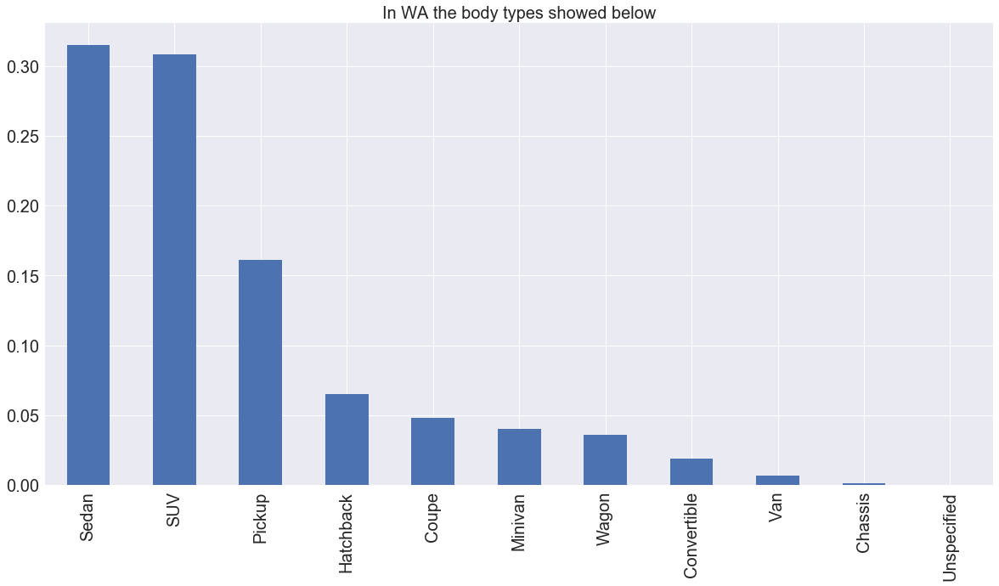

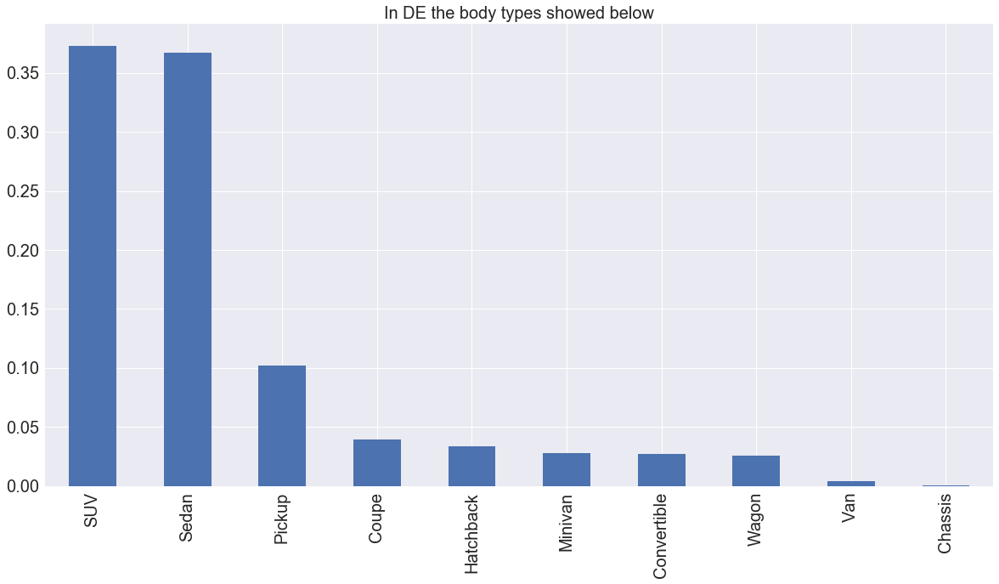

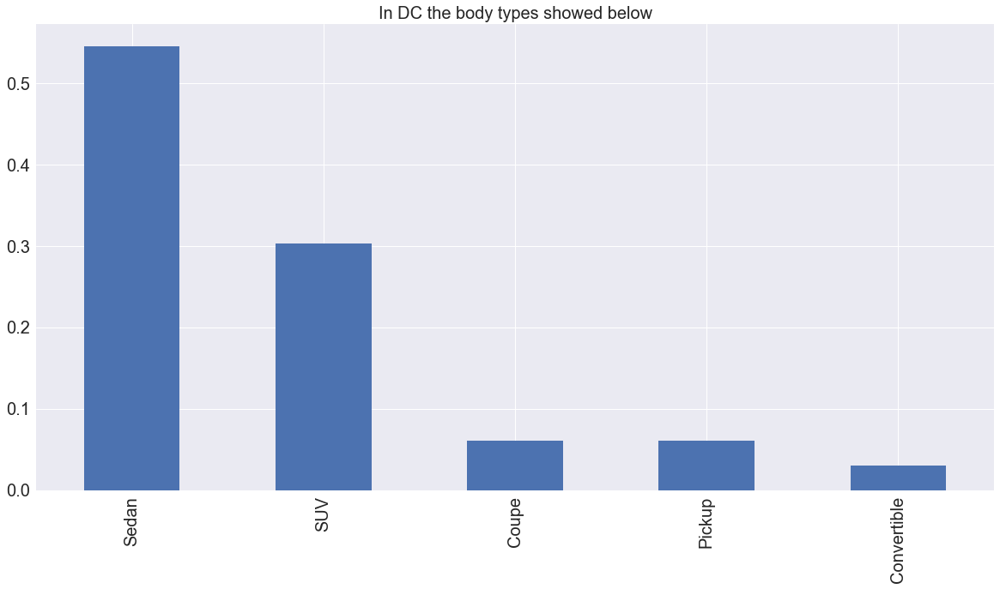

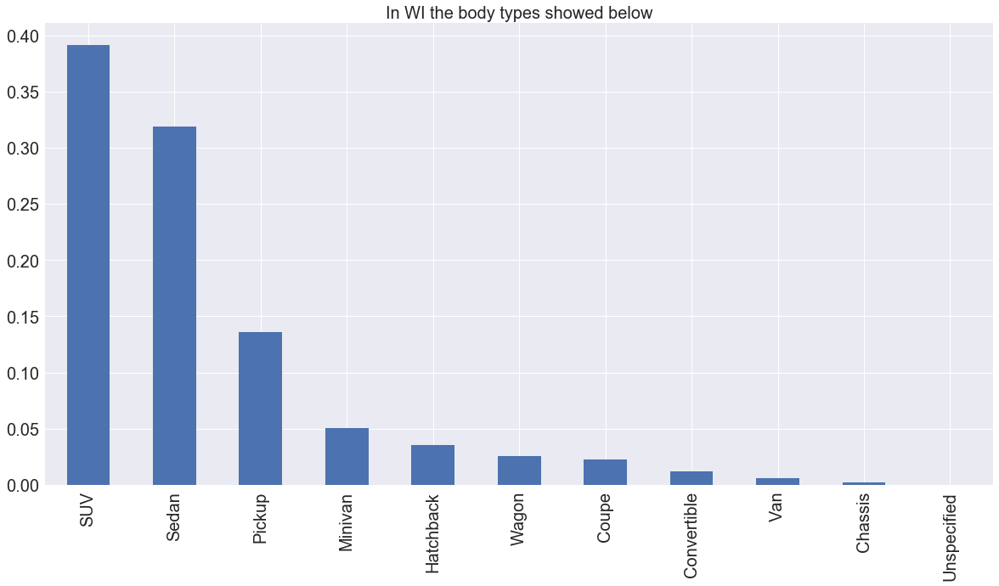

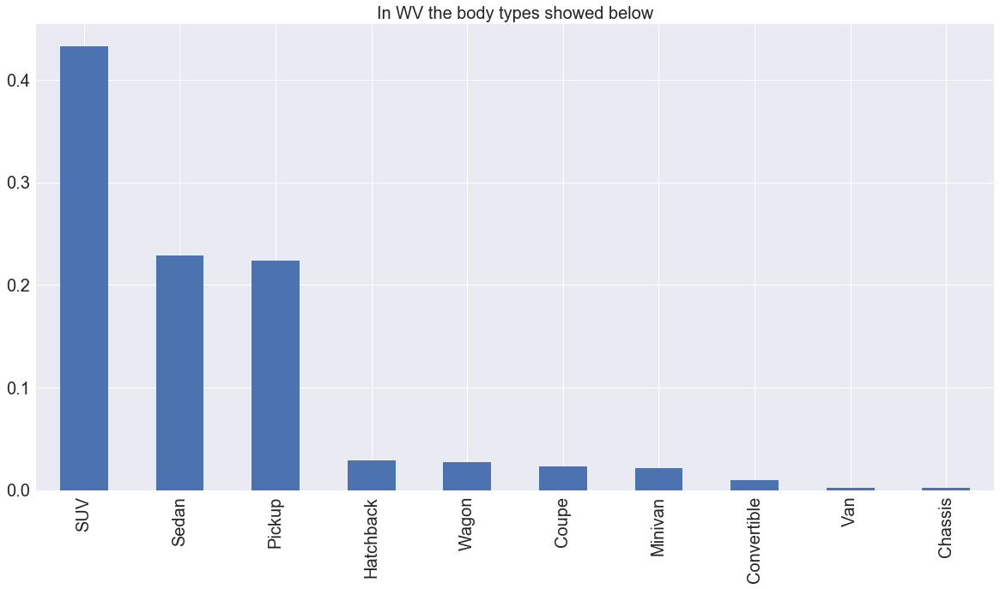

...

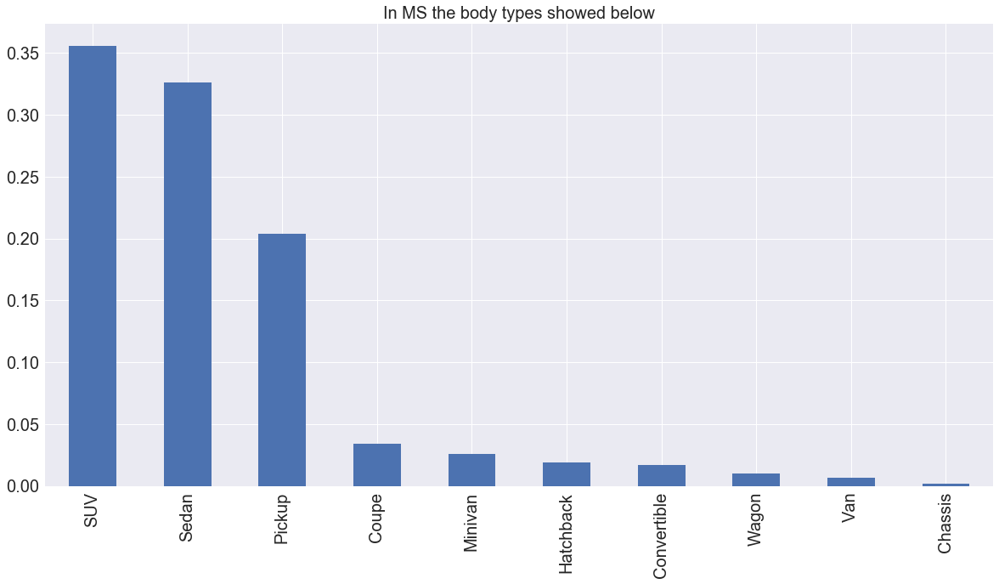

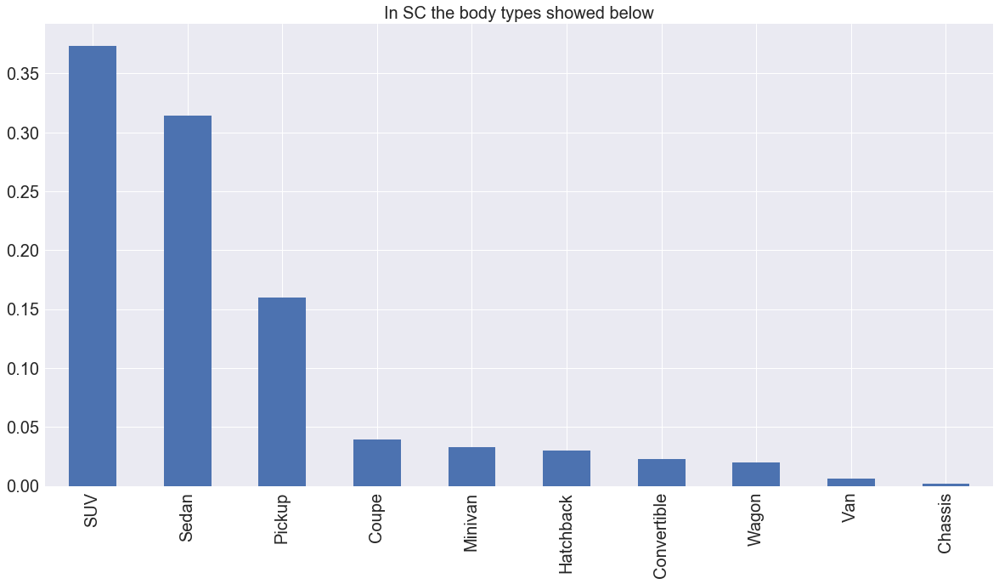

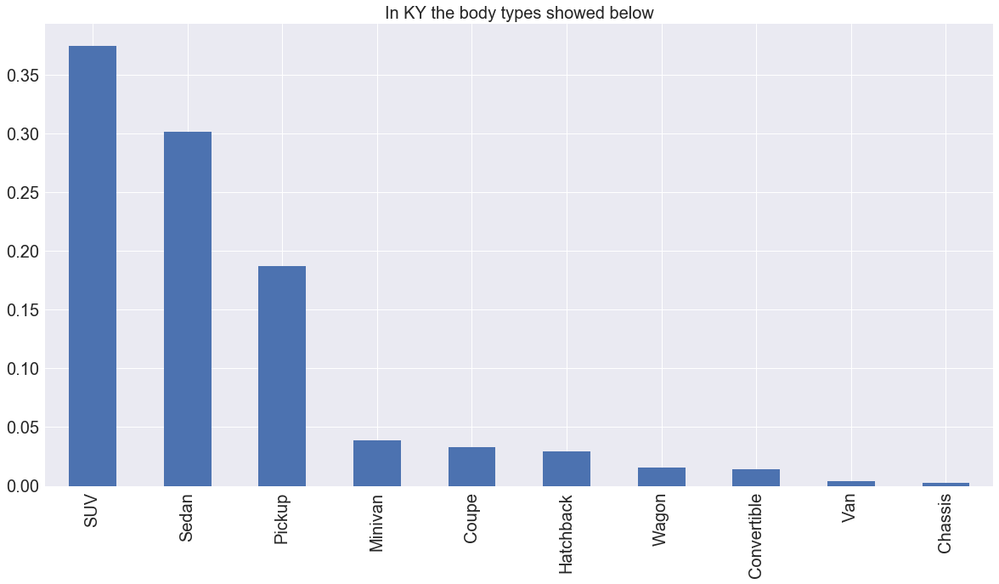

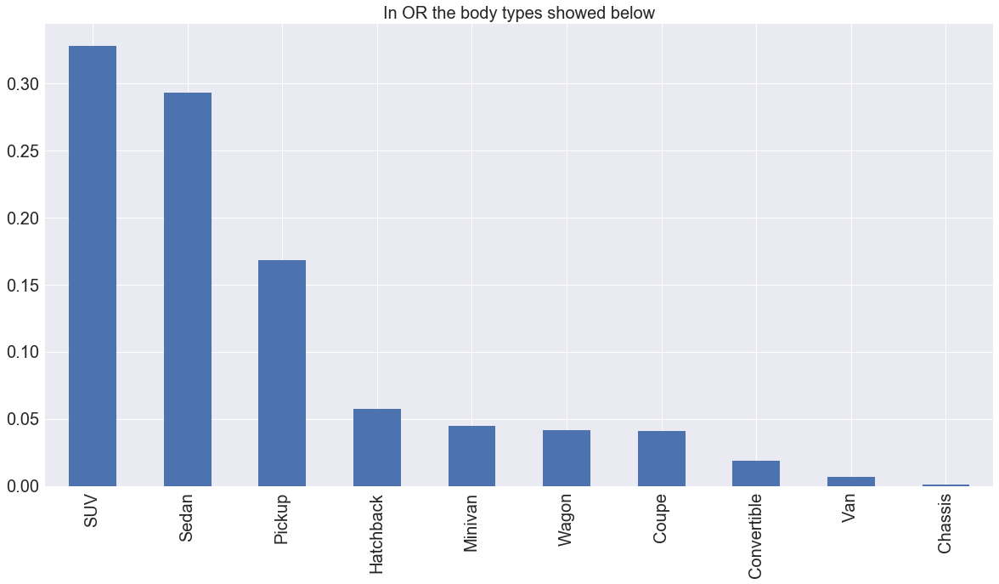

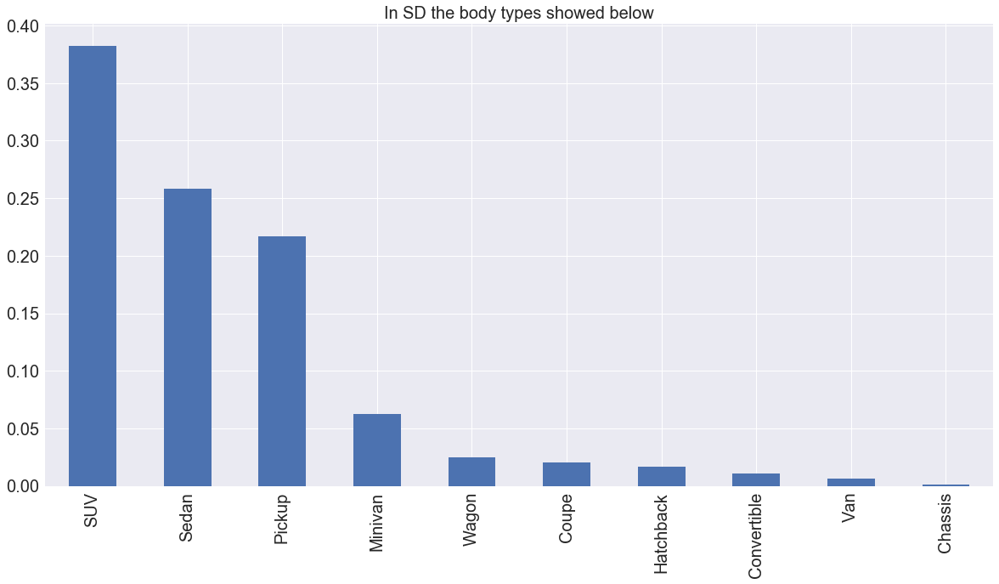

In [149]:
for state in car_state_group.groups.keys():
    dt =car_state_group.get_group(state)
    top_portition, top_total = base_metric(dt, 'car_bodytype')
    title =  'In {} the body types showed below'.format(state)
    base_metric_plot(top_portition, title)

# Car average price of each model in each state

In [166]:
top50_model = set(car_fax['car_model'].value_counts()[:50].index)

In [169]:
car_fax_top50model= car_fax[[True if model in top50_model else False for model in car_fax['car_model']]] 

In [172]:
car_fax_top50model.head(3)

,dealer_id,dealer_name,dealer_city,dealer_state,car_vin,car_year,car_make,car_topOptions,car_model,car_trim,...,car_fuel,car_mpgCity,car_mpgHighway,car_mpgCombined,car_bodytype,car_oneOwner,car_noAccidents,car_serviceRecords,car_personalUse,crawl_time
5622,C23HYE7001,North Point Motors,Dundalk,MD,19XFA156X9E020870,2009,Honda,"Alloy Wheels,Keyless Entry,Cruise Control,CD (...",Civic,LXS,...,Gasoline,26,34,29,Sedan,1,1,1,1,2017-11-26 17:33:50
5623,S44ZGK9001,D & C Motor Company European Motor Cars,Portland,OR,19XFA15859E012239,2009,Honda,,Civic,EX,...,Gasoline,26,34,29,Sedan,0,1,1,1,2017-11-26 18:10:09
5624,NGMMCRH001,Vernon Auto Sales & Services,Vernon Rockville,CT,19XFA15969E022917,2009,Honda,"Leather Seats,Power Sun/Moonroof,Alloy Wheels,...",Civic,EXL,...,Gasoline,26,34,29,Sedan,1,1,1,1,2017-11-26 21:06:15


In [173]:
car_state_price = car_fax_top50model.groupby(by=['dealer_state','car_model'])['car_current_price'].mean()

In [174]:
state_price = pd.DataFrame(car_state_price).unstack()

In [175]:
state_price.columns = state_price.columns.levels[1]

In [176]:
state_price

car_model,1500,200,3 Series,5 Series,Acadia,Accord,Altima,C-Class,CR-V,Camry,...,Silverado 1500,Sonata,Sorento,Tacoma,Tahoe,Terrain,Town & Country,Traverse,Tundra,Wrangler
dealer_state,,,,,,,,,,,,,,,,,,,,,
AK,"30,304.11","17,300.09","38,374.00","41,999.00","20,497.67","17,659.33","13,329.67",0.00,"20,926.67","13,106.38",...,"30,232.48","14,791.33","20,958.00","25,889.20","37,453.62","12,996.25","17,219.50","24,847.00","33,616.29","27,846.62"
AL,"18,933.63","10,889.99","24,756.18","24,462.05","22,871.04","14,016.66","13,316.08","24,794.00","16,845.47","13,520.09",...,"24,298.99","12,654.52","14,698.62","22,748.81","24,515.42","18,089.80","12,037.02","20,042.58","24,476.54","25,332.10"
AR,"27,708.85","10,820.91","18,406.79","22,379.86","23,779.40","15,197.70","11,550.98","28,503.50","18,131.52","13,572.59",...,"27,062.37","11,468.51","16,454.88","25,943.03","31,575.62","17,224.52","12,788.49","21,181.60","29,849.54","27,573.26"
AZ,"23,665.13","11,537.69","23,245.53","26,050.47","24,753.49","14,588.78","12,028.82","24,079.91","15,372.40","13,354.71",...,"23,035.89","12,452.84","16,318.55","21,498.35","27,196.72","18,305.33","14,835.52","19,565.28","26,830.08","24,826.69"
CA,"25,096.79","12,172.22","22,078.66","26,213.48","25,957.07","16,086.32","13,344.18","24,302.70","16,525.49","14,657.92",...,"25,952.65","13,120.91","17,629.28","23,473.15","31,328.14","18,748.51","15,111.18","21,452.91","26,220.06","28,529.04"
CO,"27,116.78","12,704.29","25,244.20","26,032.26","22,486.66","12,836.54","11,297.80","28,529.64","14,786.36","12,319.06",...,"23,193.59","12,577.91","14,819.45","23,867.51","26,790.25","18,776.21","14,596.00","22,918.39","27,708.59","26,074.69"
CT,"26,365.23","11,622.12","21,169.24","27,200.39","23,593.42","12,761.44","11,621.72","24,029.69","15,997.65","11,239.22",...,"24,811.50","11,499.26","17,152.96","21,449.75","29,406.81","19,434.65","14,756.57","19,302.94","23,461.12","24,483.66"
DC,nan,"11,000.00",nan,"15,995.00",nan,0.00,"8,374.50","1,249.50",nan,nan,...,"15,499.00",nan,nan,"15,995.00","14,999.00",nan,nan,nan,nan,nan
DE,"24,478.96","10,712.94","19,563.31","24,062.65","26,010.00","13,681.08","12,091.78","27,506.39","17,086.35","15,695.44",...,"26,190.07","12,912.29","17,890.09","23,353.93","33,493.82","17,046.71","15,337.55","21,610.35","28,204.78","24,833.23"


In [186]:
import matplotlib.dates as mdates

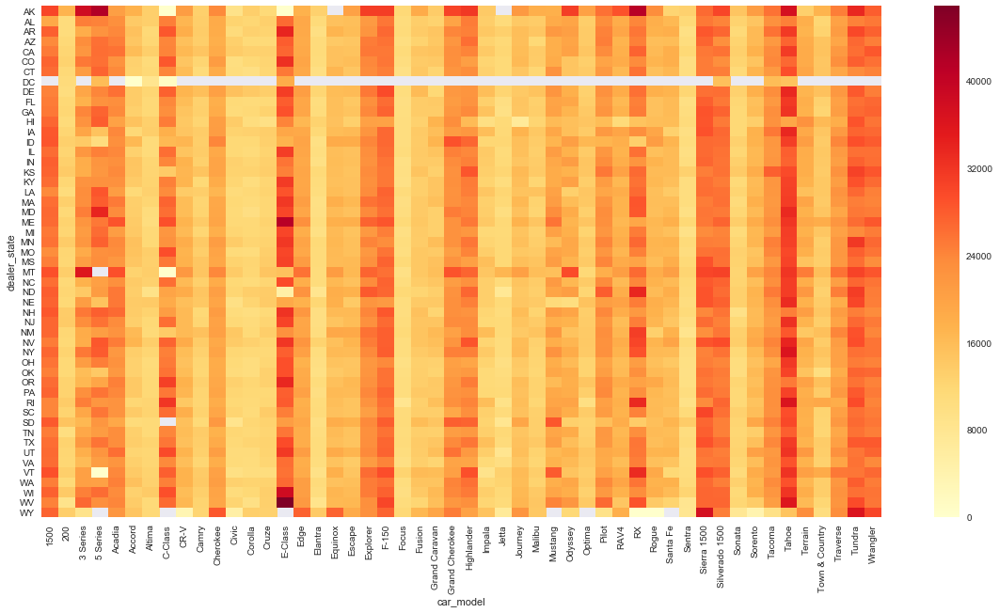

In [210]:
fig,ax = plt.subplots(figsize=(20,10))
sns.heatmap(state_price, ax=ax, cmap="YlOrRd")

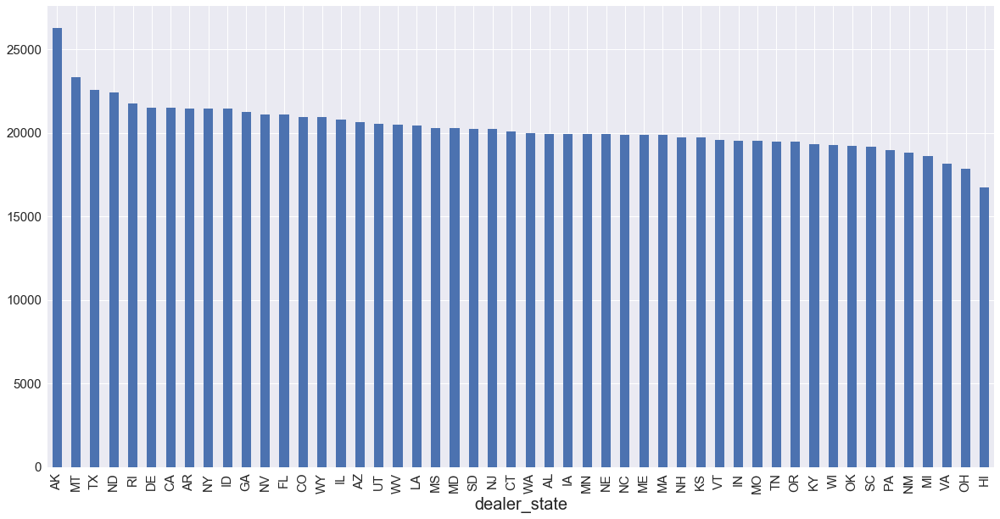

In [221]:
fig,ax = plt.subplots(figsize = (20,10))
ax.tick_params(labelsize=15)
ax.xaxis.label.set_size(20)
car_fax.groupby(by='dealer_state')['car_current_price'].mean().sort_values(ascending = False)[:-1].plot(kind = 'bar', ax = ax)

# Used Car Average Mileage in Each State

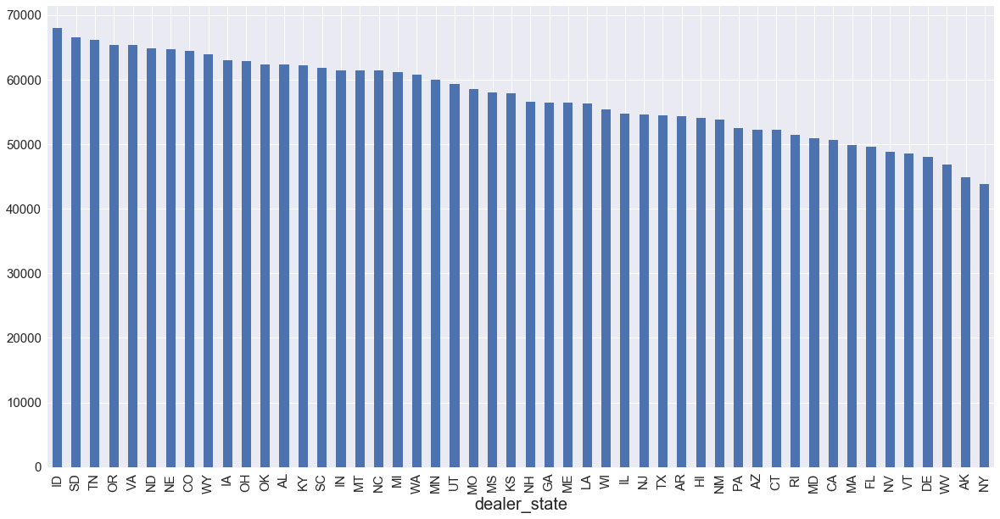

In [225]:
fig,ax = plt.subplots(figsize = (20,10))
ax.tick_params(labelsize=15)
ax.xaxis.label.set_size(20)
car_fax.groupby(by='dealer_state')['car_mileage'].mean().sort_values(ascending = False)[1:].plot(kind = 'bar', ax = ax)

# Top 50 Popular Used Car's mileage in each state

In [231]:
state_mileage = pd.DataFrame(car_fax_top50model.groupby(by=['dealer_state','car_model'])['car_mileage'].mean()).unstack()

In [232]:
state_mileage

car_mileage                                                      \
car_model           1500       200  3 Series   5 Series    Acadia     Accord   
dealer_state                                                                   
AK             41,815.80 26,533.45 20,988.25  22,249.50 91,390.33  41,823.67   
AL             49,223.18 45,452.79 38,754.52  53,281.62 55,154.72  68,447.84   
AR             39,543.01 51,093.73 62,103.00  57,417.93 49,734.09  60,200.18   
AZ             42,635.10 48,115.00 42,488.93  50,683.83 48,221.29  63,861.55   
CA             36,792.07 44,501.00 45,661.94  50,540.73 45,326.57  51,801.67   
CO             47,229.42 45,001.98 41,877.36  58,065.37 61,721.14  77,463.59   
CT             40,861.42 42,552.11 50,929.17  50,659.38 50,869.42  59,023.26   
DC                   nan 57,183.00       nan 130,022.00       nan 114,631.00   
DE             38,958.98 55,221.41 53,778.45  52,880.96 41,407.82  55,566.03   
FL             42,533.65 42,866.66 52,575.04  54,405.14 46,728.59  53,675.05   
GA             43,022.98 46,995.55 45,397.39  57,187.51 51,586.15  63,963.95   
HI             35,171.64 31,171.00 38,445.40  34,078.69 65,115.25  58,931.02   
IA             40,967.40 46,429.98 53,420.64  87,882.12 67,079.77  91,797.09   
ID             52,432.78 39,315.67 85,174.77 123,870.80 66,308.97  57,932.80   
IL             38,664.63 40,955.27 50,213.47  59,281.84 53,690.12  67,416.10   
IN             38,032.31 44,227.53 65,113.38  66,834.69 58,624.34  66,683.63   
KS             48,098.30 43,374.40 64,942.19  73,370.14 61,736.27  72,762.81   
KY             44,163.83 48,953.22 53,666.97  68,028.62 61,729.19  65,149.69   
LA             42,701.41 47,216.92 43,602.30  44,549.98 56,873.11  74,519.22   
MA             32,607.79 38,285.63 45,948.01  53,570.18 48,041.92  54,773.96   
MD             41,174.00 44,497.35 39,348.25  40,472.16 49,775.69  58,444.68   
ME             49,250.76 37,189.45 49,923.00  62,588.11 37,133.33  62,220.46   
MI             47,522.37 44,097.93 55,983.08  59,342.63 63,510.70  61,925.30   
MN             42,757.31 38,925.49 39,900.07  54,837.55 50,150.73  58,578.74   
MO             44,795.55 42,551.03 62,300.60  68,925.48 55,820.08  56,869.09   
MS             45,954.59 49,688.24 55,043.70  66,135.61 60,432.03  68,999.04   
MT             43,804.01 43,115.00 23,256.00        nan 49,541.52  76,567.04   
NC             40,927.62 49,950.25 68,494.63  72,994.28 60,538.42  68,486.62   
ND             46,273.80 49,633.57 89,004.67  77,266.00 57,698.85  68,200.35   
NE             40,561.17 39,902.61 48,682.58  87,461.43 67,722.21  63,836.13   
NH             39,875.44 44,149.13 53,531.12  56,138.20 55,654.00  60,141.86   
NJ             39,962.65 37,105.94 44,318.86  53,238.12 54,359.55  59,909.35   
NM             39,000.04 44,831.32 63,763.12  64,349.92 50,687.07  48,375.20   
NV             42,534.24 48,297.33 54,962.76  45,932.04 48,015.71  48,461.31   
NY             35,162.01 38,981.12 38,731.96  46,923.70 48,135.28  45,915.67   
OH             42,944.86 45,649.79 58,153.73  63,480.48 56,635.36  70,906.18   
OK             43,773.77 43,709.03 68,077.84  97,587.93 59,118.96  79,334.06   
OR             46,129.34 44,208.10 68,172.65  76,227.83 60,398.68  78,162.63   
PA             37,066.20 38,200.82 48,612.94  57,172.78 50,618.03  57,131.85   
RI             49,961.72 35,156.73 43,579.94  67,106.12 49,424.82  64,018.35   
SC             41,688.99 43,131.98 54,807.52  60,210.37 58,261.50  65,250.85   
SD             51,088.18 36,613.53 75,014.80  80,337.00 73,810.39  95,805.93   
TN             44,439.01 56,498.16 65,019.99  72,561.03 60,342.63  78,433.65   
TX             41,750.33 41,271.52 49,231.49  53,221.15 53,070.39  67,717.72   
UT             48,819.22 41,634.80 58,577.25  62,200.93 41,381.14  77,254.87   
VA             40,148.46 46,123.43 70,600.10  71,287.79 59,974.32  66,926.57   
VT             37,211.41 42,257.83 61,174.00  75,869.00 36,895.33  51,855.96   
WA           

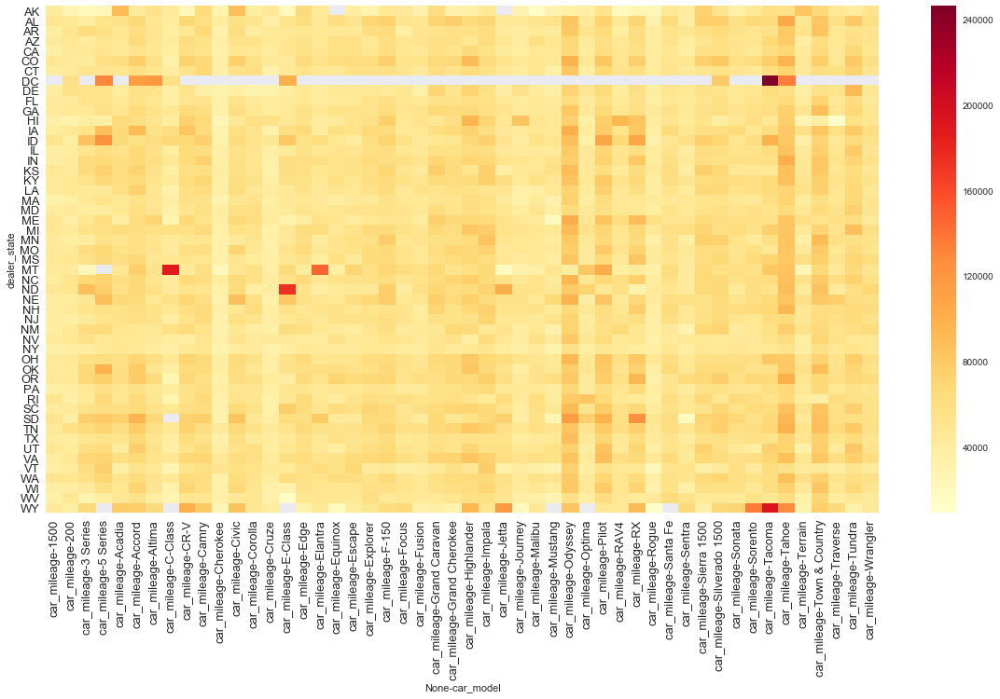

In [235]:
fig,ax = plt.subplots(figsize=(20,10))
ax.tick_params(labelsize=13)
sns.heatmap(state_mileage, ax=ax, cmap="YlOrRd")

# Top 50 Popular Used Car's  Mileage

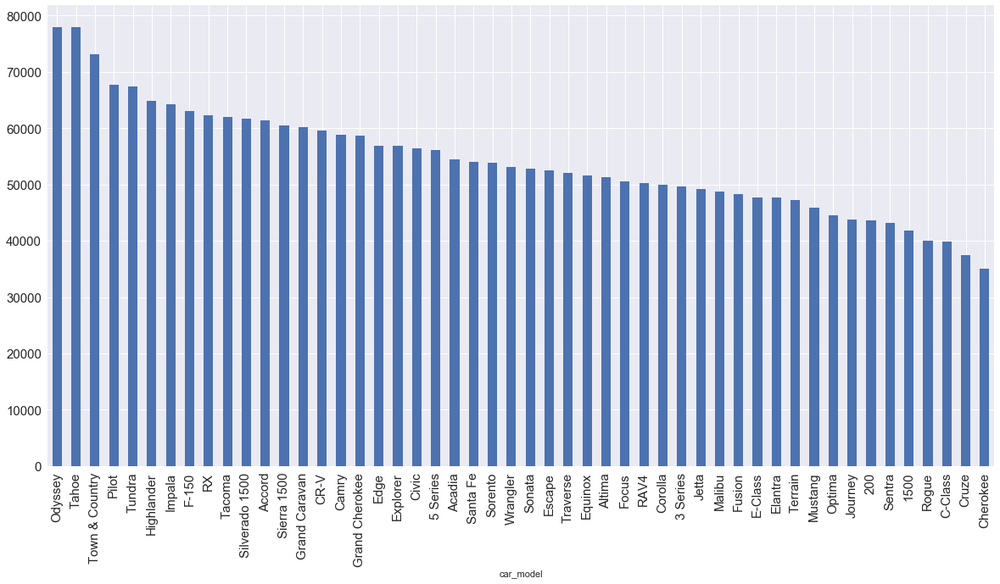

In [242]:
fig,ax = plt.subplots(figsize = (20,10))
ax.tick_params(labelsize=15)
car_fax_top50model.groupby(by='car_model')['car_mileage'].mean().sort_values(ascending = False).plot(kind = 'bar')

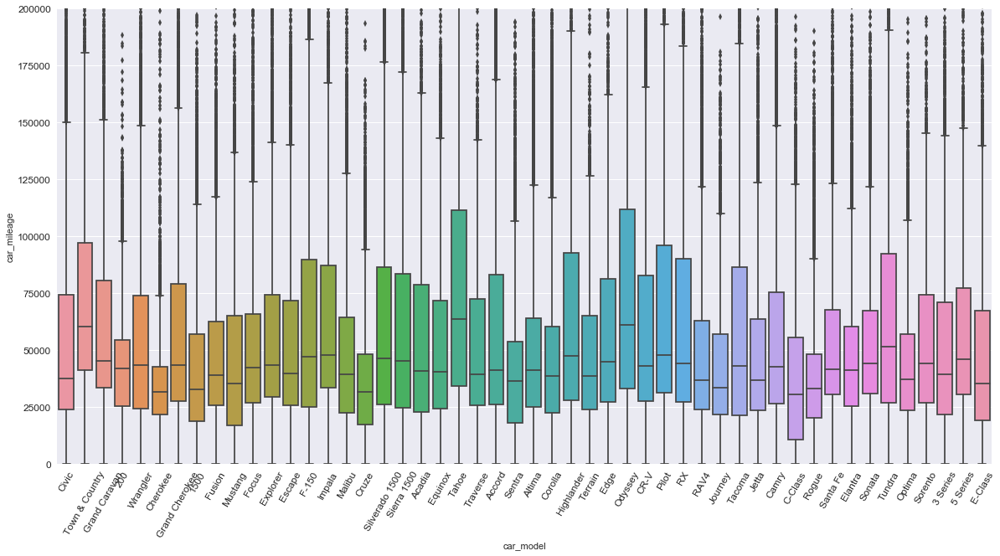

In [303]:
fig,ax = plt.subplots(figsize = (20,10))
ax.tick_params(labelsize = 12)
for tick in ax.get_xticklabels():
    tick.set_rotation(60)
ax.set_ylim(top=200000)
sns.boxplot(x='car_model', y='car_mileage', data=car_fax_top50model[car_fax_top50model['car_current_price']!=0], ax=ax)

# Top 50 Popular Used Car's Price

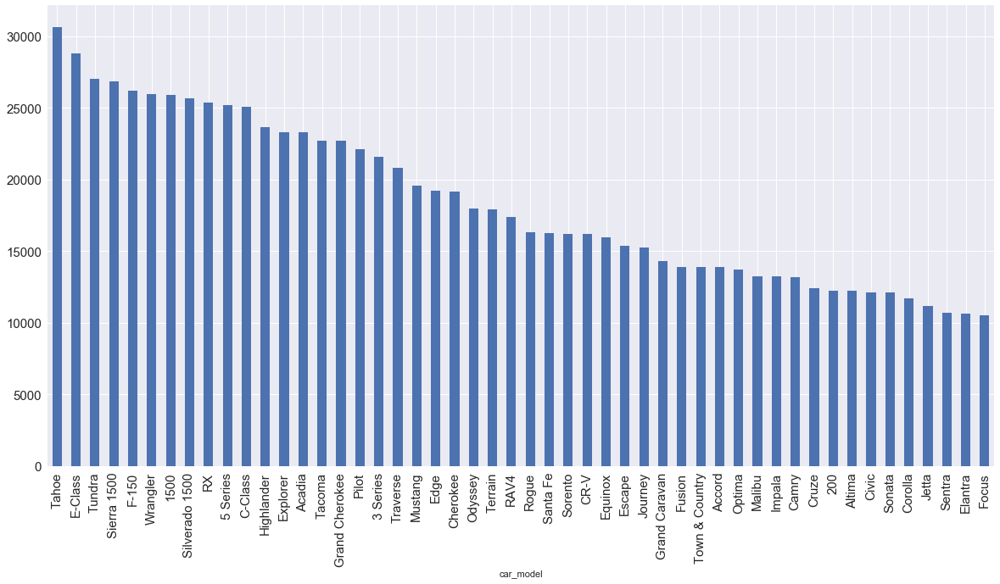

In [243]:
fig,ax = plt.subplots(figsize = (20,10))
ax.tick_params(labelsize=15)
car_fax_top50model.groupby(by='car_model')['car_current_price'].mean().sort_values(ascending = False).plot(kind = 'bar')

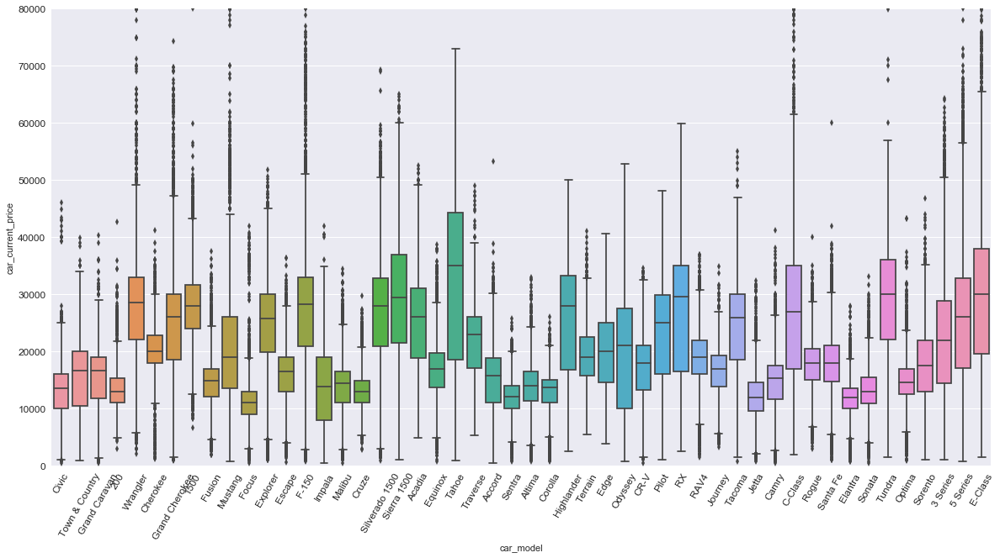

In [301]:
fig,ax = plt.subplots(figsize = (20,10))
ax.tick_params(labelsize = 12)
for tick in ax.get_xticklabels():
    tick.set_rotation(60)
ax.set_ylim(top=80000)
sns.boxplot(x='car_model', y='car_current_price', data=car_fax_top50model[car_fax_top50model['car_current_price']!=0], ax=ax)

# Correlation Between Used Car Mileage and Price

In [251]:
car_fax['car_current_price'].corr(car_fax['car_mileage'])

-0.38952646731619661

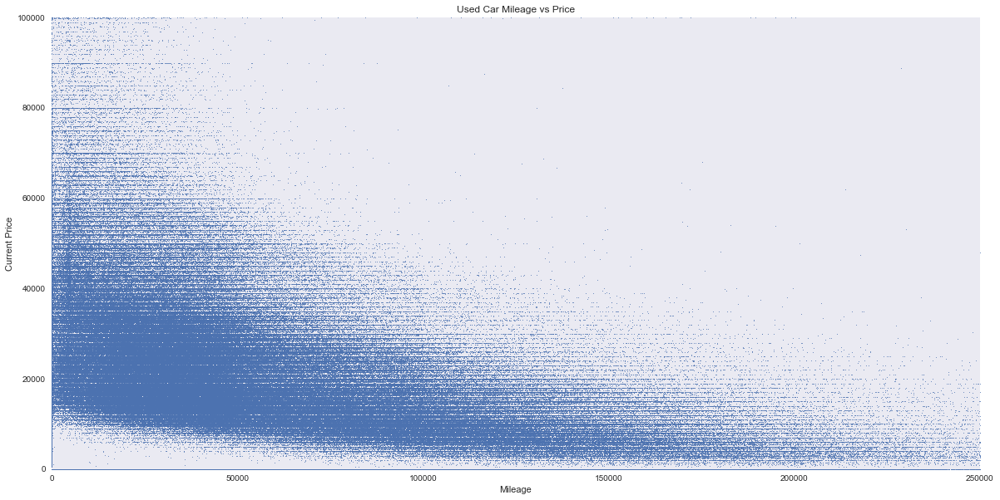

In [250]:
fig,ax = plt.subplots(figsize = (20,10))
ax.scatter(car_fax['car_mileage'],car_fax['car_current_price'], s=0.4)
ax.set_ylim(top=100000, bottom=0)
ax.set_xlim(left= 0, right = 250000)
ax.set_title('Used Car Mileage vs Price')
ax.set_xlabel('Mileage')
ax.set_ylabel('Current Price')
ax.grid(b = False)
plt.show()

# Correlation Between Used Car Mileage and Price based on Top 500 Popular car

In [253]:
car_fax_top50model['car_current_price'].corr(car_fax_top50model['car_mileage'])

-0.48107226385335072

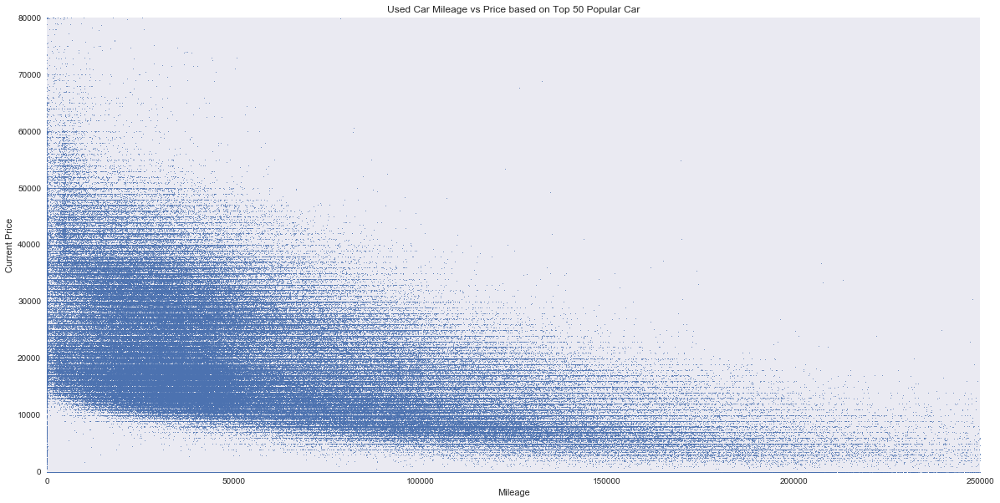

In [257]:
fig,ax = plt.subplots(figsize = (20,10))
ax.scatter(car_fax_top50model['car_mileage'],car_fax_top50model['car_current_price'], s=0.4)
ax.set_ylim(top=80000, bottom=0)
ax.set_xlim(left= 0, right = 250000)
ax.set_title('Used Car Mileage vs Price based on Top 50 Popular Car')
ax.set_xlabel('Mileage')
ax.set_ylabel('Current Price')
ax.grid(b = False)
plt.show()

# Car Drivetype vs Car BodyType

In [263]:
drivetype_bodytype = pd.DataFrame(car_fax.groupby(by=['car_drivetype', 'car_bodytype'])['car_vin'].count()).unstack()

In [267]:
drivetype_bodytype.columns =  drivetype_bodytype.columns.levels[1]

In [268]:
drivetype_bodytype

car_bodytype,Chassis,Convertible,Coupe,Hatchback,Minivan,Pickup,SUV,Sedan,Unspecified,Van,Wagon
car_drivetype,,,,,,,,,,,
2WD,1.00,nan,nan,nan,nan,nan,nan,nan,2.00,nan,nan
4WD,734.00,7.00,nan,nan,2.00,"100,160.00","108,889.00",nan,1.00,1.00,nan
AWD,11.00,"2,145.00","5,655.00","1,907.00",835.00,509.00,"131,270.00","52,435.00",6.00,53.00,"10,141.00"
FWD,39.00,"3,920.00","8,804.00","36,763.00","34,339.00",40.00,"107,932.00","244,419.00",7.00,"1,362.00","12,304.00"
RWD,"1,283.00","16,001.00","30,092.00",573.00,22.00,"38,466.00","27,196.00","49,475.00",11.00,"5,850.00",264.00
Unspecified,1.00,19.00,35.00,nan,nan,5.00,151.00,88.00,12.00,2.00,1.00


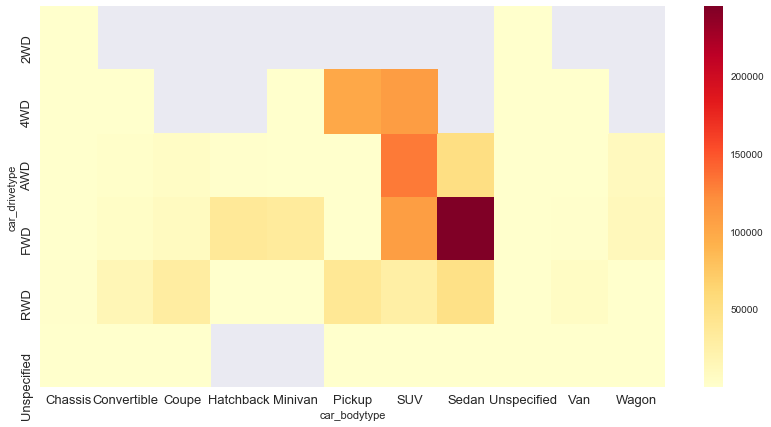

In [273]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
sns.heatmap(drivetype_bodytype, ax=ax, cmap="YlOrRd")

# Transmision Type vs MPG

In [274]:
car_fax.groupby(by='car_transmission')['car_mpgCombined'].mean()

car_transmission
Automatic     21.86
Manual        22.00
Unspecified   22.18
Name: car_mpgCombined, dtype: float64

# Engineen Type vs MPG

In [275]:
car_fax.groupby(by='car_engine')['car_mpgCombined'].mean()

car_engine
10 Cyl          8.32
12 Cyl         11.31
2 Cyl          38.69
3 Cyl          32.86
4 Cyl          27.10
5 Cyl          22.22
6 Cyl          19.41
8 Cyl          13.93
Electric      103.92
Rotary         17.83
Unspecified     0.00
Name: car_mpgCombined, dtype: float64

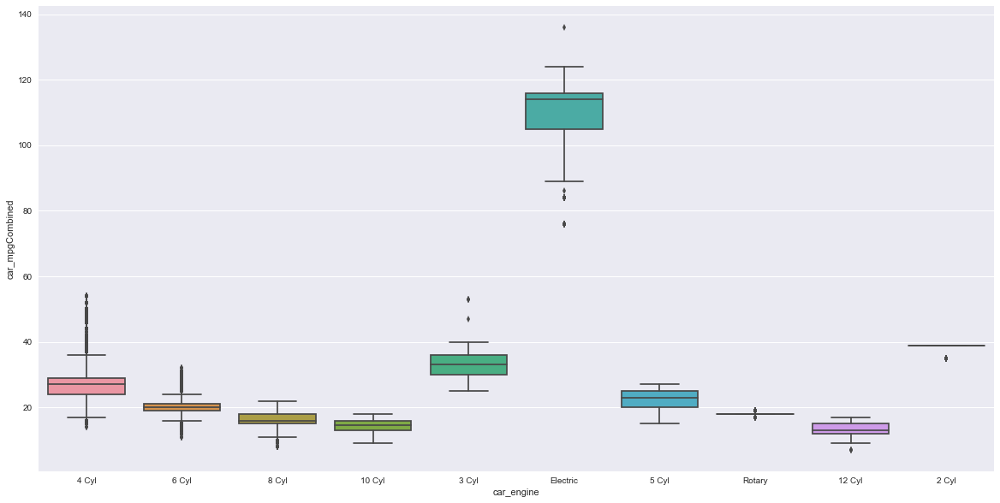

In [291]:
fig,ax = plt.subplots(figsize = (20,10))
sns.boxplot(x='car_engine', y='car_mpgCombined', data=car_fax[car_fax['car_mpgCombined']!=0], ax=ax)

# Bodytype vs MPG

In [290]:
car_fax[car_fax['car_mpgCombined']!=0].groupby(by='car_bodytype')['car_mpgCombined'].mean()

car_bodytype
Chassis       15.20
Convertible   20.99
Coupe         21.93
Hatchback     33.51
Minivan       20.74
Pickup        16.81
SUV           20.80
Sedan         26.06
Unspecified   23.33
Van           15.64
Wagon         25.50
Name: car_mpgCombined, dtype: float64

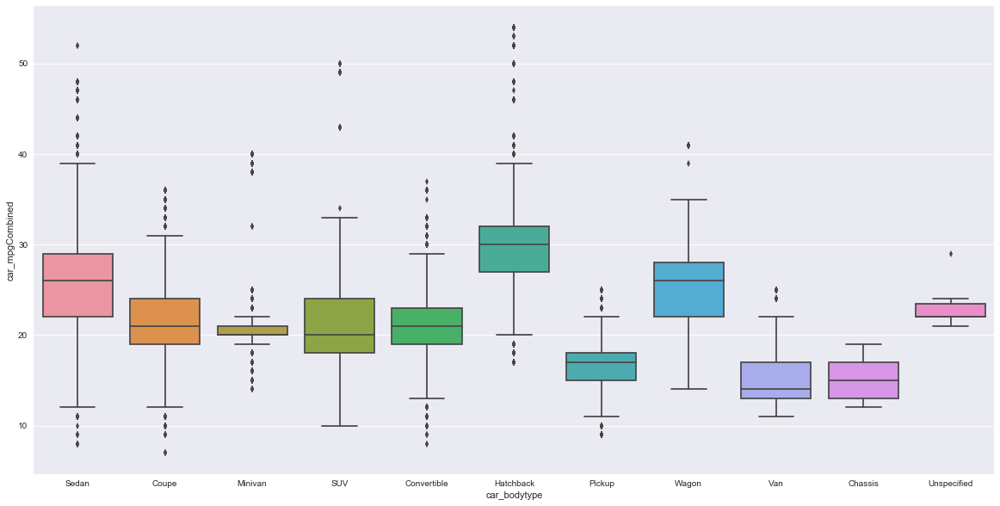

In [289]:
fig,ax = plt.subplots(figsize = (20,10))
sns.boxplot(x='car_bodytype', y='car_mpgCombined', data=car_fax[(car_fax['car_engine']!='Electric') & (car_fax['car_mpgCombined']!=0)], ax=ax)

# Fuel vs MPG

In [285]:
car_fax[car_fax['car_mpgCombined']!=0].groupby(by='car_fuel')['car_mpgCombined'].mean()

car_fuel
Alternative      29.88
Diesel           29.56
Electric        109.71
Flexible-Fuel    18.87
Gasoline         22.85
Hybrid           39.99
Name: car_mpgCombined, dtype: float64

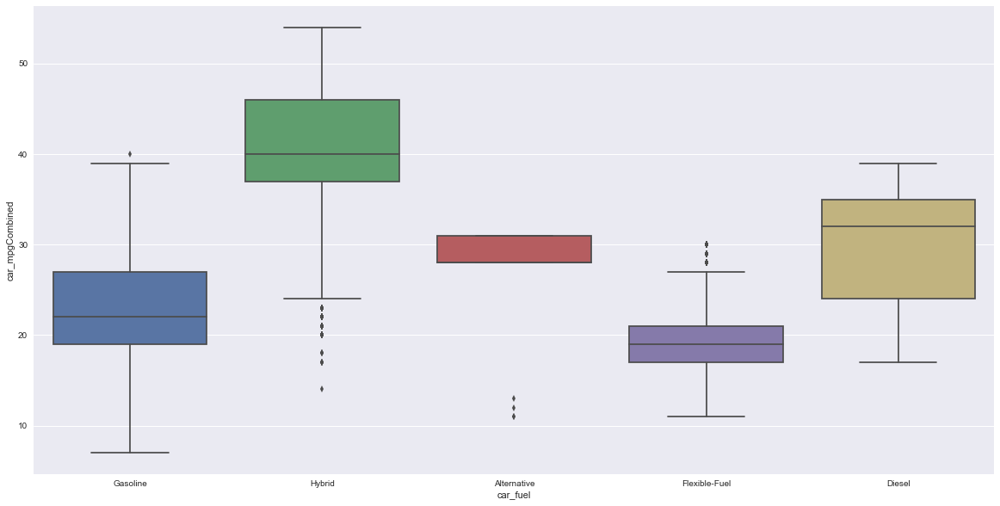

In [288]:
fig,ax = plt.subplots(figsize = (20,10))
sns.boxplot(x='car_fuel', y='car_mpgCombined', data=car_fax[(car_fax['car_engine']!='Electric') & (car_fax['car_mpgCombined']!=0)], ax=ax)

# Top 50 Popular Used Car Years vs Price

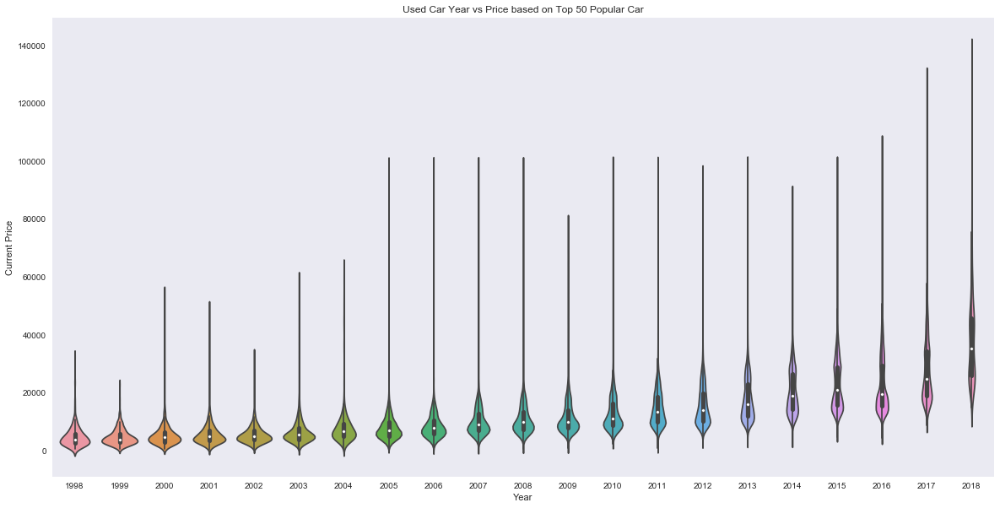

In [315]:
fig,ax = plt.subplots(figsize = (20,10))
sns.violinplot(x='car_year', y='car_current_price',
               data= car_fax_top50model[(car_fax_top50model['car_current_price']>0) & (car_fax_top50model['car_year']>1997)], ax=ax)
# ax.set_ylim(top=80000)
ax.set_title('Used Car Year vs Price based on Top 50 Popular Car')
ax.set_xlabel('Year')
ax.set_ylabel('Current Price')
ax.grid(b = False)
plt.show()

# Year vs BodyType 

In [317]:
year_body = car_fax.pivot_table(index=['car_year'],columns=['car_bodytype'], values=['car_vin'], aggfunc='count')

In [320]:
year_body.fillna(value=0, inplace=True)

In [321]:
year_body

car_vin                                                    \
car_bodytype Chassis Convertible    Coupe Hatchback  Minivan    Pickup   
car_year                                                                 
1981            0.00        8.00    24.00      2.00     0.00      4.00   
1982            0.00       12.00    13.00      0.00     0.00      2.00   
1983            0.00        9.00    13.00      2.00     0.00      9.00   
1984            0.00       19.00    28.00      1.00     0.00     17.00   
1985            1.00       17.00    39.00      3.00     1.00     14.00   
1986            0.00       23.00    43.00      0.00     0.00     14.00   
1987            1.00       36.00    54.00      8.00     0.00     12.00   
1988            1.00       36.00    49.00      4.00     0.00     13.00   
1989            4.00       58.00    49.00      1.00     0.00     23.00   
1990            3.00       44.00    38.00      6.00     0.00     34.00   
1991            2.00       51.00    58.00      2.00     4.00     29.00   
1992            4.00       43.00    57.00      3.00     1.00     45.00   
1993            6.00       31.00    68.00     12.00     6.00     54.00   
1994           11.00       59.00    80.00      7.00     5.00     88.00   
1995            8.00       89.00   107.00      8.00    14.00    120.00   
1996            9.00       72.00   115.00      2.00    26.00    111.00   
1997           20.00      114.00   139.00      6.00    23.00    235.00   
1998           20.00      138.00   135.00     10.00    48.00    293.00   
1999           45.00      259.00   208.00     29.00    85.00    441.00   
2000           48.00      277.00   288.00     66.00   136.00    561.00   
2001           49.00      414.00   404.00     84.00   182.00    931.00   
2002           67.00      641.00   521.00    149.00   257.00  1,201.00   
2003           72.00      641.00   599.00    157.00   324.00  1,861.00   
2004           61.00      809.00   850.00    205.00   501.00  2,780.00   
2005           95.00      966.00   909.00    390.00   888.00  3,360.00   
2006          120.00    1,034.00 1,224.00    493.00   989.00  4,308.00   
2007           92.00    1,165.00 1,465.00  1,097.00 1,090.00  4,880.00   
2008          125.00    1,242.00 1,998.00  1,228.00 1,436.00  5,177.00   
2009           74.00      785.00 1,454.00    997.00   816.00  3,254.00   
2010           37.00      729.00 2,236.00  1,536.00 1,490.00  4,688.00   
2011          142.00    1,105.00 2,102.00  1,350.00 1,495.00  7,314.00   
2012          226.00    1,221.00 2,997.00  3,243.00 2,114.00  8,469.00   
2013          114.00    1,627.00 3,676.00  4,417.00 2,370.00 11,069.00   
2014          156.00    2,804.00 6,752.00  6,726.00 4,189.00 20,925.00   
2015          183.00    2,301.00 7,391.00  7,993.00 4,949.00 23,544.00   
2016          180.00    1,537.00 4,835.00  6,306.00 6,573.00 19,501.00   
2017           88.00    1,542.00 3,325.00  2,531.00 5,123.00 13,592.00   
2018            5.00      134.00   243.00    169.00    63.00    207.00   

                                                                
car_bodytype       SUV     Sedan Unspecified      Van    Wagon  
car_year                                                        
1981              4.00      5.00        2.00     0.00     0.00  
1982              6.00      3.00        0.00     1.00     0.00  
1983              9.00      3.00        1.00     1.00     1.00  
1984             11.00     13.00        1.00     0.00     0.00  
1985              8.00     12.00        0.00     1.00     0.00  
1986              8.00     18.00        1.00     0.00     1.00  
1987             12.00     16.00        0.00     4.00     0.00  
1988             18.00     26.00        1.00     2.00     0.00  
1989             22.00     24.00        0.00     3.00     1.00  
1990             22.00     30.00        2.00     3.00     1.00  
1991             20.00     52.00        0.00     2.00     3.00  
1992             11.00     55.00        0.00     4.00     1.00  
199

In [324]:
year_body['total'] = year_body.sum(axis=1)

In [327]:
year_body.columns = year_body.columns.levels[1]

In [334]:
names = list(year_body.columns)

In [335]:
names[-1]='total'

In [337]:
year_body.columns = names

In [338]:
year_body

,Chassis,Convertible,Coupe,Hatchback,Minivan,Pickup,SUV,Sedan,Unspecified,Van,Wagon,total
car_year,,,,,,,,,,,,
1981,0.00,8.00,24.00,2.00,0.00,4.00,4.00,5.00,2.00,0.00,0.00,49.00
1982,0.00,12.00,13.00,0.00,0.00,2.00,6.00,3.00,0.00,1.00,0.00,37.00
1983,0.00,9.00,13.00,2.00,0.00,9.00,9.00,3.00,1.00,1.00,1.00,48.00
1984,0.00,19.00,28.00,1.00,0.00,17.00,11.00,13.00,1.00,0.00,0.00,90.00
1985,1.00,17.00,39.00,3.00,1.00,14.00,8.00,12.00,0.00,1.00,0.00,96.00
1986,0.00,23.00,43.00,0.00,0.00,14.00,8.00,18.00,1.00,0.00,1.00,108.00
1987,1.00,36.00,54.00,8.00,0.00,12.00,12.00,16.00,0.00,4.00,0.00,143.00
1988,1.00,36.00,49.00,4.00,0.00,13.00,18.00,26.00,1.00,2.00,0.00,150.00
1989,4.00,58.00,49.00,1.00,0.00,23.00,22.00,24.00,0.00,3.00,1.00,185.00


In [339]:
for col in year_body.columns:
    year_body[col] = year_body[col]/year_body['total']

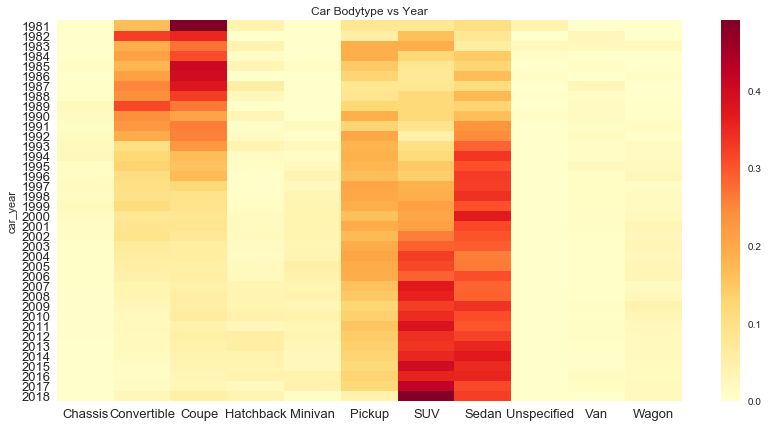

In [362]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Car Bodytype vs Year')
sns.heatmap(year_body.drop(axis=1, labels=['total']), ax=ax, cmap="YlOrRd")

# Engine Type vs Year

In [345]:
year_engine = car_fax.pivot_table(index=['car_year'],columns=['car_engine'], values=['car_vin'], aggfunc='count')

In [348]:
year_engine.fillna(value=0, inplace=True)

In [351]:
year_engine.columns = year_engine.columns.levels[1]

In [354]:
year_engine['total'] = year_engine.sum(axis=1)

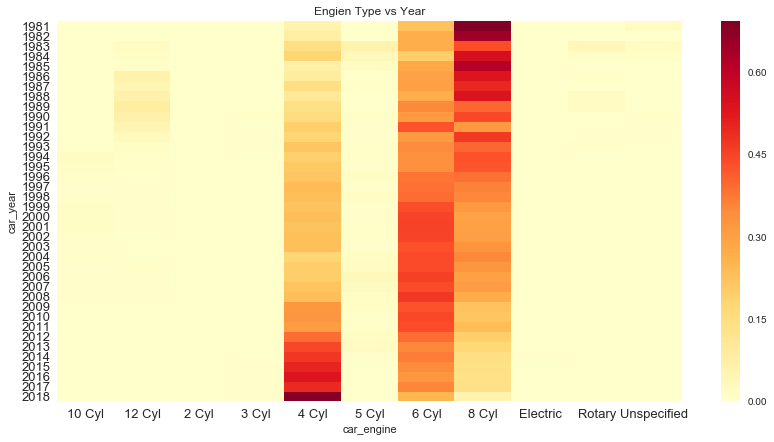

In [361]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
sns.heatmap(year_engine.iloc[:,:-1].div(year_engine['total'],axis=0), ax=ax, cmap="YlOrRd")
ax.set_title('Engien Type vs Year')

# Popular Exterioer Colors

In [363]:
car_fax['car_exteriorColor'].value_counts()

Black          217448
White          206605
Silver         152591
Gray           146025
Red             98408
Blue            86333
Unspecified     49777
Beige           17014
Brown           15231
Green           14901
Gold            10419
Orange           5391
Bronze           4775
Burgundy         3834
Yellow           3300
Purple           1586
Turquoise         568
Pink               34
Name: car_exteriorColor, dtype: int64

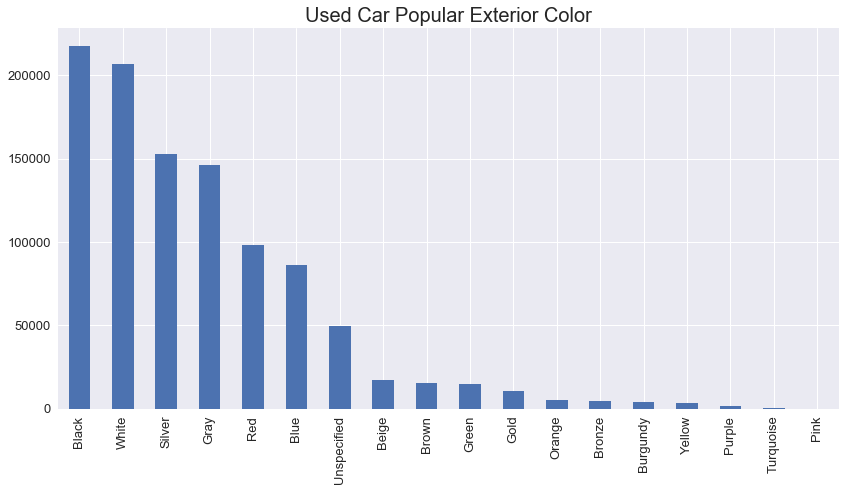

In [368]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Popular Exterior Color', fontsize=20)
car_fax['car_exteriorColor'].value_counts().plot(kind = 'bar', ax  = ax)

# Exterior Color vs State

In [374]:
exterior_state = car_fax.pivot_table(index=['dealer_state'], columns=['car_exteriorColor'], values=['car_vin'], aggfunc='count')

In [376]:
exterior_state.columns = exterior_state.columns.levels[1]

In [377]:
exterior_state.head()

car_exteriorColor,Beige,Black,Blue,Bronze,Brown,Burgundy,Gold,Gray,Green,Orange,Pink,Purple,Red,Silver,Turquoise,Unspecified,White,Yellow
dealer_state,,,,,,,,,,,,,,,,,,
AK,8.00,143.00,78.00,2.00,16.00,1.00,3.00,139.00,12.00,4.00,nan,1.00,89.00,143.00,1.00,9.00,134.00,1.00
AL,334.00,"3,288.00","1,034.00",45.00,252.00,28.00,189.00,"2,081.00",213.00,69.00,nan,16.00,"1,643.00","2,427.00",3.00,666.00,"3,807.00",50.00
AR,144.00,"1,830.00",521.00,39.00,161.00,23.00,106.00,"1,120.00",107.00,52.00,nan,12.00,"1,210.00","1,409.00",2.00,490.00,"2,383.00",29.00
AZ,307.00,"3,478.00","1,631.00",106.00,252.00,43.00,281.00,"2,906.00",255.00,117.00,1.00,29.00,"1,836.00","3,153.00",12.00,"1,460.00","4,573.00",95.00
CA,860.00,"19,730.00","6,656.00",297.00,905.00,278.00,821.00,"15,985.00","1,033.00",373.00,nan,114.00,"6,103.00","15,202.00",72.00,"4,590.00","22,509.00",290.00


In [378]:
total_color = exterior_state.sum(axis=1)

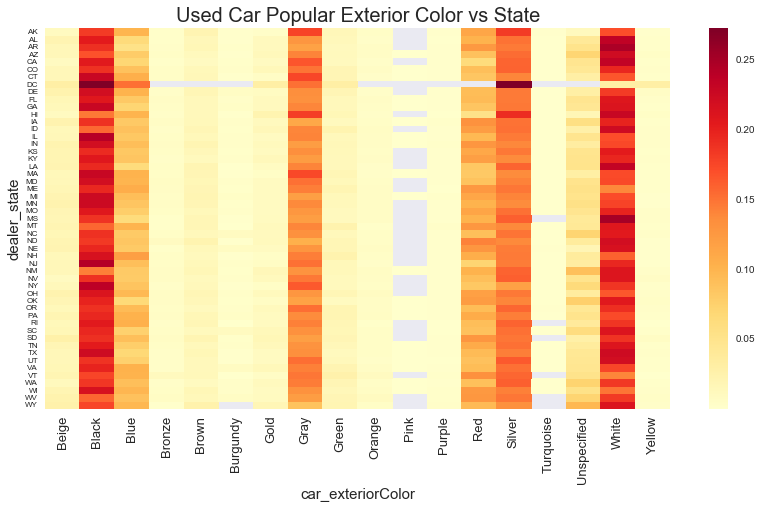

In [388]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Popular Exterior Color vs State', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
ax.tick_params(axis='y', which='major', labelsize=8)
sns.heatmap(exterior_state.div(total_color, axis=0),cmap="YlOrRd", ax=ax)

# Exterior Color vs Bodytype

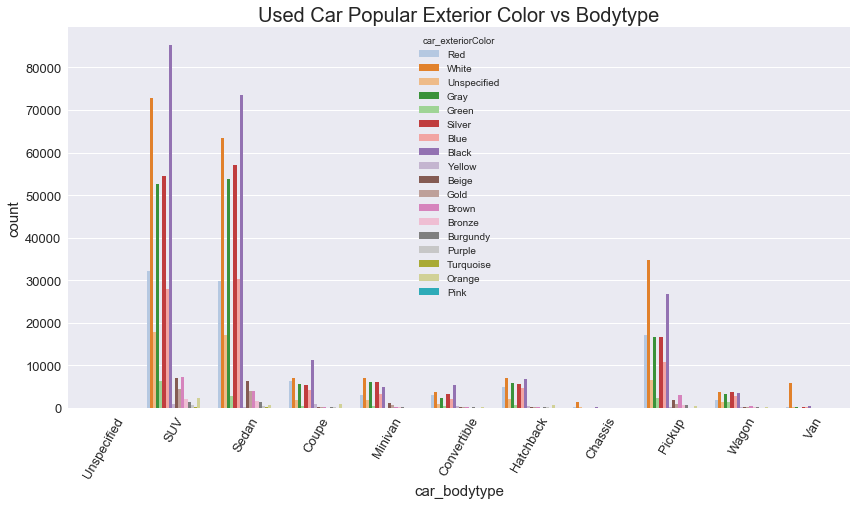

In [403]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Popular Exterior Color vs Bodytype', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
for tick in ax.get_xticklabels():
    tick.set_rotation(60)
sns.countplot(x = 'car_bodytype', hue='car_exteriorColor', data=car_fax, ax=ax, palette="tab20")

# Popular Interior Color

In [393]:
car_fax['car_interiorColor'].value_counts()

Black             380497
Unspecified       322902
Gray              185447
Tan               102917
Brown              24372
White              10713
Red                 4778
Blue                1549
Yellow               494
Green                290
Orange               280
Charcoal Black         1
Name: car_interiorColor, dtype: int64

# Interior Color vs State

In [395]:
interior_state = car_fax.pivot_table(index=['dealer_state'], columns=['car_interiorColor'], values=['car_vin'], aggfunc='count')

In [396]:
interior_state.columns = interior_state.columns.levels[1]

In [397]:
interior_state.head()

car_interiorColor,Black,Blue,Brown,Charcoal Black,Gray,Green,Orange,Red,Tan,Unspecified,White,Yellow
dealer_state,,,,,,,,,,,,
AK,300.00,2.00,17.00,1.00,122.00,nan,nan,7.00,23.00,309.00,2.00,1.00
AL,"4,252.00",18.00,510.00,nan,"2,735.00",6.00,2.00,68.00,"1,866.00","6,528.00",156.00,4.00
AR,"2,917.00",9.00,329.00,nan,"1,670.00",8.00,3.00,46.00,"1,016.00","3,489.00",147.00,4.00
AZ,"7,448.00",28.00,390.00,nan,"3,848.00",3.00,12.00,129.00,"2,076.00","6,311.00",262.00,28.00
CA,"37,583.00",194.00,"1,423.00",nan,"16,688.00",26.00,29.00,543.00,"7,795.00","30,547.00",942.00,48.00


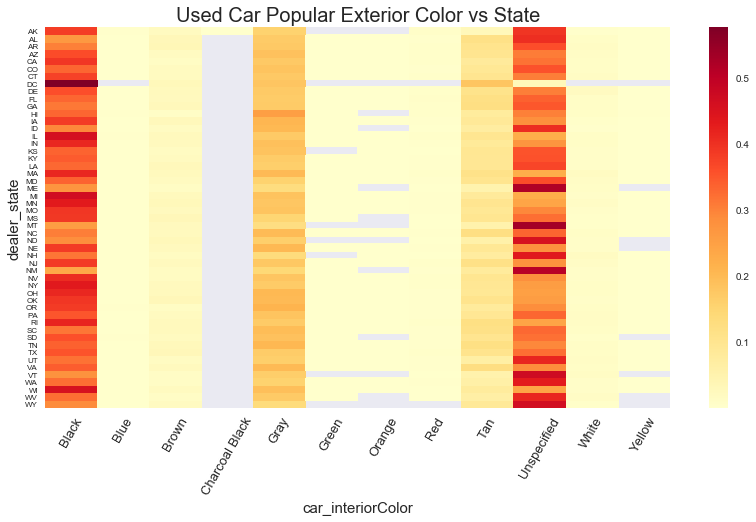

In [399]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Popular Exterior Color vs State', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
ax.tick_params(axis='y', which='major', labelsize=8)
for tick in ax.get_xticklabels():
    tick.set_rotation(60)
sns.heatmap(interior_state.div(interior_state.sum(axis=1), axis=0),cmap="YlOrRd", ax=ax)

# Interior Color vs Car Bodytype

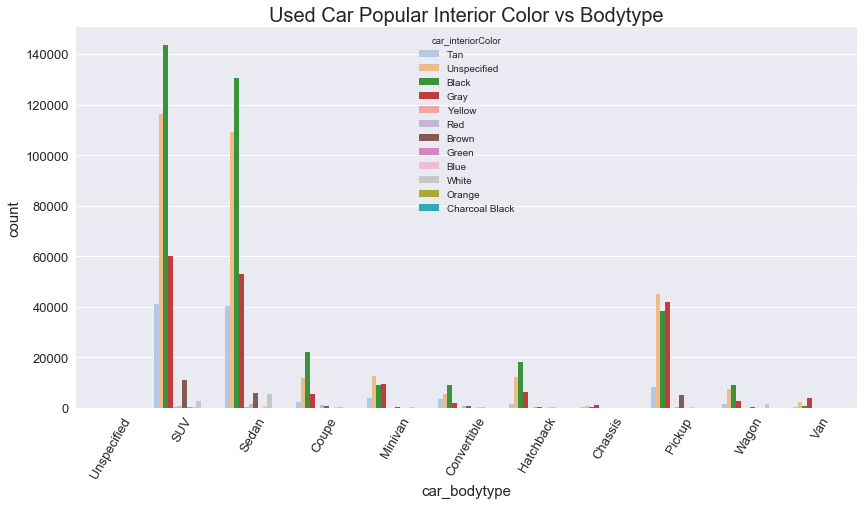

In [402]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Popular Interior Color vs Bodytype', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
for tick in ax.get_xticklabels():
    tick.set_rotation(60)
sns.countplot(x = 'car_bodytype', hue='car_interiorColor', data=car_fax, ax=ax, palette="tab20")

# Exterior Color, Interior Color Combination

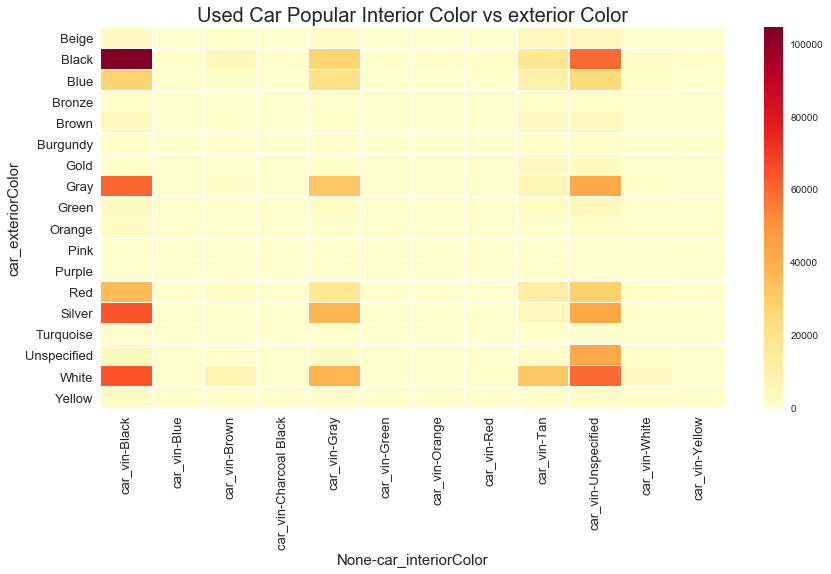

In [417]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Popular Interior Color vs exterior Color', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
# ax.set_xlabel('car_interiorColor', fontsize=20)
sns.heatmap(car_fax.pivot_table(index=['car_exteriorColor'],
                                columns=['car_interiorColor'],
                                values=['car_vin'],
                                aggfunc='count').fillna(0), 
           cmap="YlOrRd",
            ax = ax,
            linewidths=.2
           )

# Car One Owner vs Current Price

In [418]:
car_fax.groupby(by=['car_oneOwner'])['car_current_price'].mean()

car_oneOwner
0   16,617.46
1   22,715.22
Name: car_current_price, dtype: float64

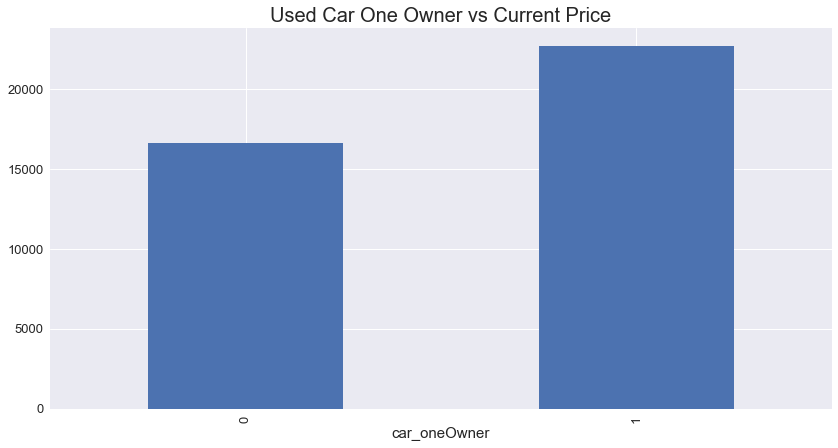

In [421]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car One Owner vs Current Price', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
car_fax.groupby(by=['car_oneOwner'])['car_current_price'].mean().plot(kind= 'bar', ax=ax)

# Car No Accident vs Current Price

In [420]:
car_fax.groupby(by=['car_noAccidents'])['car_current_price'].mean()

car_noAccidents
0   15,466.49
1   21,509.19
Name: car_current_price, dtype: float64

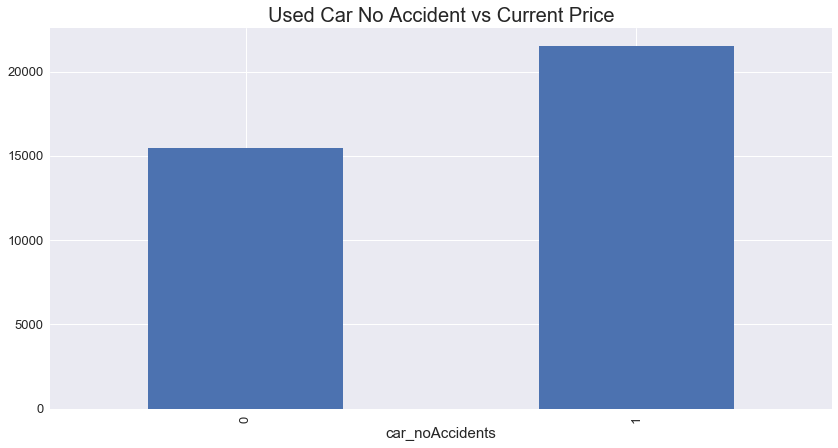

In [422]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car No Accident vs Current Price', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
car_fax.groupby(by=['car_noAccidents'])['car_current_price'].mean().plot(kind= 'bar', ax=ax)

# Car No Accident vs Current Price

In [424]:
car_fax.groupby(by=['car_serviceRecords'])['car_current_price'].mean()

car_serviceRecords
0   25,394.39
1   19,849.08
Name: car_current_price, dtype: float64

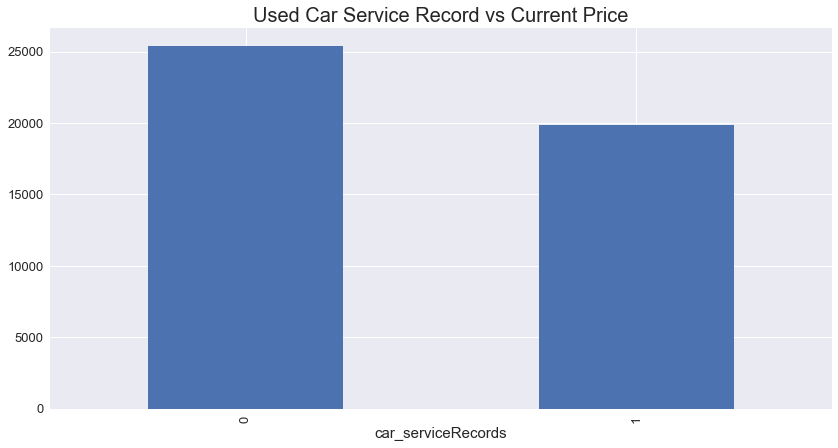

In [423]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Service Record vs Current Price', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
car_fax.groupby(by=['car_serviceRecords'])['car_current_price'].mean().plot(kind= 'bar', ax=ax)

# noAccident, oneOwner, serviceRecord vs current_price

In [427]:
car_fax.groupby(by=['car_oneOwner', 'car_noAccidents', 'car_serviceRecords']).agg({'car_vin':'count', 'car_current_price':'mean'})

car_vin  car_current_price
car_oneOwner car_noAccidents car_serviceRecords                            
0            0               0                      3400          16,147.48
                             1                     96745          12,200.30
             1               0                     19439          27,197.03
                             1                    275922          17,426.68
1            0               0                      8759          20,651.64
                             1                     83788          18,668.10
             1               0                     68050          25,951.91
                             1                    478137          23,001.57

# Car Bodytype, Drivetype vs Car Current Price

In [439]:
car_fax.pivot_table(index= ['car_bodytype'], columns=['car_drivetype'], values=['car_current_price'], aggfunc='mean').fillna(0)

car_current_price                                          \
car_drivetype               2WD       4WD       AWD       FWD       RWD   
car_bodytype                                                              
Chassis                    0.00 28,654.20 17,438.45 11,738.82 17,533.59   
Convertible                0.00 59,469.43 58,570.51 11,752.09 33,067.03   
Coupe                      0.00      0.00 47,280.96  9,758.32 30,375.78   
Hatchback                  0.00      0.00 33,556.49 11,628.55 22,142.99   
Minivan                    0.00  3,499.50 18,445.43 15,971.77  3,922.59   
Pickup                     0.00 28,126.15 23,630.60 31,145.12 19,726.22   
SUV                        0.00 23,897.06 23,731.49 18,049.84 24,761.31   
Sedan                      0.00      0.00 25,863.02 12,710.92 22,717.83   
Unspecified            7,495.00 34,814.00 47,261.00  8,854.00 23,345.18   
Van                        0.00 89,995.00 15,160.02 17,705.57 20,066.76   
Wagon                      0.00      0.00 19,284.31 10,958.91  9,220.84   

                           
car_drivetype Unspecified  
car_bodytype               
Chassis         34,588.00  
Convertible     88,679.42  
Coupe           82,948.63  
Hatchback            0.00  
Minivan              0.00  
Pickup          17,795.00  
SUV              6,049.23  
Sedan           40,755.88  
Unspecified     22,839.67  
Van             16,430.50  
Wagon           13,952.00

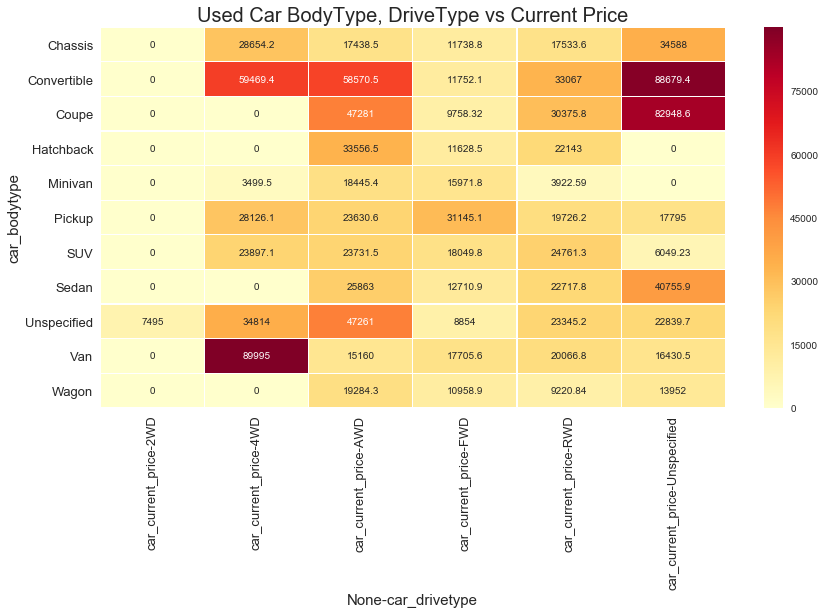

In [435]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car BodyType, DriveType vs Current Price', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
# ax.set_xlabel('car_interiorColor', fontsize=20)
sns.heatmap(car_fax.pivot_table(index= ['car_bodytype'],
                                columns=['car_drivetype'], 
                                values=['car_current_price'], 
                                aggfunc='mean').fillna(0), 
           cmap="YlOrRd",
            ax = ax,
            linewidths=.2,
            annot = True,
            fmt ='g'
           )

Car Car Exterior Color, Car Interior Color vs Car Current Price
===

In [436]:
car_fax.pivot_table(index= ['car_exteriorColor'],
                    columns=['car_interiorColor'],
                    values=['car_current_price'],
                    aggfunc='mean').fillna(0)

car_current_price                                     \
car_interiorColor             Black      Blue     Brown Charcoal Black   
car_exteriorColor                                                        
Beige                     18,754.33 24,398.15 21,360.51           0.00   
Black                     24,600.18 18,086.28 32,540.66           0.00   
Blue                      19,712.01 21,924.53 27,784.28           0.00   
Bronze                    22,142.29 32,998.00 25,654.49           0.00   
Brown                     22,520.57 15,456.00 28,729.83           0.00   
Burgundy                  16,034.36 23,290.00 25,869.50           0.00   
Gold                      16,084.73 11,870.60 15,928.78           0.00   
Gray                      21,961.16 24,535.78 30,150.96           0.00   
Green                     20,406.90 17,184.47 22,773.68           0.00   
Orange                    24,057.02 13,132.83 66,071.06           0.00   
Pink                      11,521.09      0.00 18,995.00           0.00   
Purple                    24,661.85      0.00 32,221.33      10,571.00   
Red                       21,285.14 31,855.89 27,815.57           0.00   
Silver                    20,829.75 23,954.82 26,780.91           0.00   
Turquoise                 16,015.94 10,395.75 22,660.00           0.00   
Unspecified               22,054.29 14,852.94 30,374.71           0.00   
White                     24,238.82 24,277.50 32,310.89           0.00   
Yellow                    30,957.62 16,725.00 33,129.37           0.00   

                                                                     \
car_interiorColor      Gray     Green    Orange       Red       Tan   
car_exteriorColor                                                     
Beige             15,057.61 14,992.00 11,995.00 21,520.32 15,125.31   
Black             18,693.19 26,741.59 33,152.71 39,157.94 22,753.82   
Blue              16,032.61 18,132.93 43,493.21 45,299.96 21,393.74   
Bronze            21,228.35      0.00      0.00 44,738.76 17,888.11   
Brown             21,680.44 18,513.50 11,949.50 18,619.00 22,476.06   
Burgundy          11,988.44      0.00      0.00 19,476.32 13,321.70   
Gold              12,258.66  9,766.33 15,499.00 15,293.12 11,616.94   
Gray              18,020.76 26,066.85 43,360.89 41,600.99 21,071.25   
Green             13,856.93 13,785.84 15,000.00 15,205.22 14,600.66   
Orange            18,263.62      0.00 41,534.48 26,951.15 19,641.03   
Pink               7,006.14      0.00      0.00 10,222.00      0.00   
Purple            14,450.65 16,495.00      0.00 22,305.33 17,245.42   
Red               17,006.27 24,781.45 28,029.30 28,967.97 21,358.18   
Silver            16,504.85 22,122.46 30,423.56 41,755.22 19,993.56   
Turquoise          8,290.00      0.00  4,995.00      0.00  9,278.63   
Unspecified       17,428.32 27,815.33      0.00 36,374.44 20,938.04   
White             19,355.95 34,041.69 39,056.28 43,615.38 22,470.01   
Yellow            17,926.63  7,900.00 57,794.00 46,662.67 24,422.78   

                                                   
car_interiorColor Unspecified     White    Yellow  
car_exteriorColor                                  
Beige               14,019.04 14,457.74 15,925.33  
Black               20,611.01 25,024.64 40,606.67  
Blue                16,419.33 25,236.62 34,012.89  
Bronze              19,741.64 18,086.37 31,771.80  
Brown               20,110.16 21,182.13 16,449.14  
Burgundy            13,841.84 19,764.32 17,750.00  
Gold                11,839.76 10,680.80 13,522.22  
Gray                18,480.98 27,677.38 35,600.81  
Green               13,631.52 16,569.70 25,143.59  
Orange              20,433.93 25,821.14 39,693.50  
Pink                 8,961.00      0.00      0.00  
Purple              17,508.08 19,797.80 19,523.00  
Red                 17,534.64 19,625.04 17,458.04  
Silver              17,065.80 22,543.85 28,011.25  
Turquoise           12,902.33 15,370.75 36,950.00  
Unspecified         14,235.53 21,38

In [442]:
car_fax.pivot_table(index= ['car_exteriorColor'],
                    columns=['car_interiorColor'],
                    values=['car_vin'],
                    aggfunc='count').fillna(0)

car_vin                                                 \
car_interiorColor      Black   Blue    Brown Charcoal Black      Gray Green   
car_exteriorColor                                                             
Beige               3,491.00  13.00   885.00           0.00  1,675.00  5.00   
Black             104,363.00 186.00 4,959.00           0.00 28,093.00 46.00   
Blue               27,473.00 468.00 2,033.00           0.00 20,536.00 14.00   
Bronze              1,159.00   1.00   453.00           0.00    450.00  0.00   
Brown               4,561.00   2.00 1,120.00           0.00  1,524.00  2.00   
Burgundy            1,001.00   3.00    74.00           0.00    787.00  0.00   
Gold                1,410.00   5.00   525.00           0.00    855.00  3.00   
Gray               60,164.00 163.00 1,925.00           0.00 32,443.00 27.00   
Green               3,441.00  15.00   407.00           0.00  2,988.00 73.00   
Orange              2,728.00   6.00    49.00           0.00    738.00  0.00   
Pink                   11.00   0.00     1.00           0.00      7.00  0.00   
Purple                620.00   0.00    39.00           1.00    275.00  1.00   
Red                35,957.00  54.00 2,256.00           0.00 16,837.00 11.00   
Silver             63,644.00 240.00 1,301.00           0.00 37,764.00 37.00   
Turquoise             126.00   8.00     3.00           0.00    166.00  0.00   
Unspecified         4,237.00  17.00   228.00           0.00  1,780.00  3.00   
White              64,227.00 361.00 8,095.00           0.00 38,077.00 67.00   
Yellow              1,884.00   7.00    19.00           0.00    452.00  1.00   

                                                                         
car_interiorColor Orange      Red       Tan Unspecified    White Yellow  
car_exteriorColor                                                        
Beige               1.00    19.00  5,435.00    4,922.00   556.00  12.00  
Black              65.00 1,230.00 17,325.00   59,402.00 1,690.00  89.00  
Blue               14.00   128.00  9,928.00   24,505.00 1,197.00  37.00  
Bronze              0.00    17.00  1,463.00    1,135.00    92.00   5.00  
Brown               2.00    12.00  3,597.00    4,170.00   206.00  35.00  
Burgundy            0.00    37.00    981.00      887.00    62.00   2.00  
Gold                1.00     8.00  3,484.00    3,787.00   281.00  60.00  
Gray               46.00   655.00  6,885.00   42,687.00   999.00  31.00  
Green               1.00     9.00  2,708.00    4,782.00   460.00  17.00  
Orange             54.00    20.00    235.00    1,545.00    14.00   2.00  
Pink                0.00     1.00      1.00       13.00     0.00   0.00  
Purple              0.00     6.00    164.00      467.00    10.00   3.00  
Red                10.00   498.00 12,514.00   29,063.00 1,181.00  27.00  
Silver             16.00   630.00  5,425.00   42,874.00   632.00  28.00  
Turquoise           1.00     0.00    127.00      132.00     4.00   1.00  
Unspecified         0.00    32.00    988.00   42,372.00   112.00   8.00  
White              68.00 1,473.00 31,598.00   59,317.00 3,209.00 113.00  
Yellow              1.00     3.00     59.00      842.00     8.00  24.00

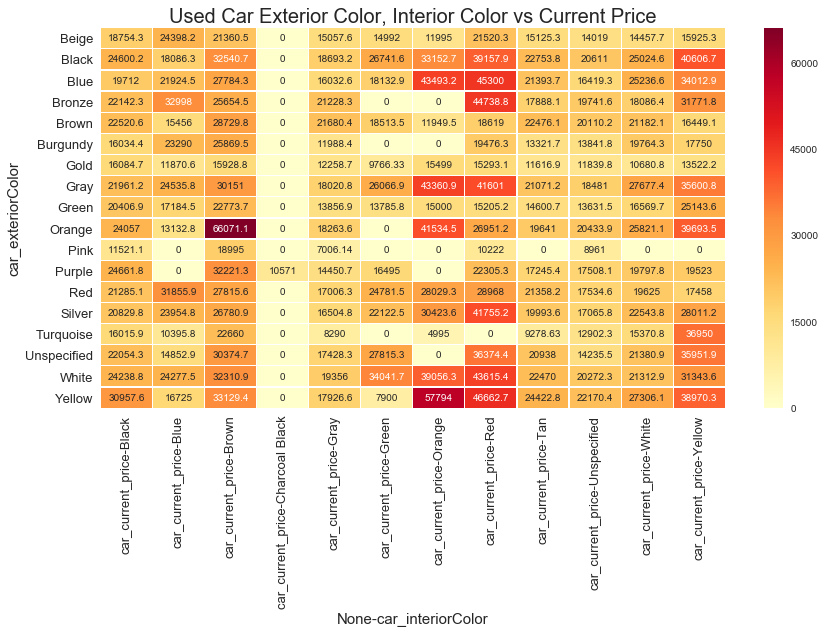

In [437]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Used Car Exterior Color, Interior Color vs Current Price', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
# ax.set_xlabel('car_interiorColor', fontsize=20)
sns.heatmap(car_fax.pivot_table(index= ['car_exteriorColor'],
                                columns=['car_interiorColor'],
                                values=['car_current_price'],
                                aggfunc='mean').fillna(0), 
           cmap="YlOrRd",
            ax = ax,
            linewidths=.2,
            annot = True,
            fmt ='g'
           )

In [443]:
car_fax_top50model.pivot_table(index= ['car_exteriorColor'],
                    columns=['car_interiorColor'],
                    values=['car_vin'],
                    aggfunc='count').fillna(0)

car_vin                                                \
car_interiorColor     Black   Blue    Brown      Gray Green Orange    Red   
car_exteriorColor                                                           
Beige              2,373.00   2.00   473.00    915.00  4.00   1.00   6.00   
Black             49,478.00  93.00 1,787.00 14,871.00 20.00  17.00 277.00   
Blue              13,842.00 164.00   625.00 11,904.00 10.00   7.00  25.00   
Bronze               508.00   0.00   167.00    169.00  0.00   0.00   5.00   
Brown              2,972.00   2.00   552.00    929.00  2.00   0.00   9.00   
Burgundy             499.00   0.00    25.00    384.00  0.00   0.00   5.00   
Gold                 840.00   1.00   200.00    399.00  2.00   0.00   4.00   
Gray              29,865.00  74.00   635.00 18,687.00 20.00   6.00 173.00   
Green              1,652.00   4.00   193.00  1,550.00 32.00   0.00   4.00   
Orange             1,270.00   0.00    28.00    371.00  0.00   9.00   4.00   
Pink                   0.00   0.00     0.00      1.00  0.00   0.00   0.00   
Purple               240.00   0.00    12.00     77.00  0.00   0.00   0.00   
Red               19,367.00  22.00 1,070.00  9,135.00  8.00   1.00 156.00   
Silver            31,681.00  92.00   483.00 20,965.00 29.00   2.00 110.00   
Turquoise             38.00   2.00     1.00     70.00  0.00   1.00   0.00   
Unspecified        2,549.00   7.00    88.00  1,014.00  3.00   0.00   5.00   
White             32,833.00 116.00 3,200.00 18,142.00 31.00   8.00 313.00   
Yellow               426.00   0.00     6.00    129.00  0.00   0.00   0.00   

                                                         
car_interiorColor       Tan Unspecified    White Yellow  
car_exteriorColor                                        
Beige              2,427.00    2,578.00   460.00   6.00  
Black              6,824.00   29,747.00   743.00  29.00  
Blue               4,208.00   12,891.00   282.00   7.00  
Bronze               679.00      547.00    22.00   1.00  
Brown              1,811.00    2,301.00   140.00  32.00  
Burgundy             469.00      460.00    51.00   2.00  
Gold               1,504.00    1,840.00   167.00  34.00  
Gray               2,898.00   23,089.00   363.00   9.00  
Green              1,150.00    2,245.00   170.00   7.00  
Orange               113.00      684.00     3.00   0.00  
Pink                   0.00        3.00     0.00   0.00  
Purple                70.00      174.00     5.00   0.00  
Red                6,114.00   15,493.00   691.00  16.00  
Silver             2,273.00   22,528.00   295.00   9.00  
Turquoise             64.00       60.00     0.00   0.00  
Unspecified          439.00   20,784.00    51.00   2.00  
White             13,141.00   29,330.00 1,745.00  49.00  
Yellow                12.00      231.00     3.00   0.00

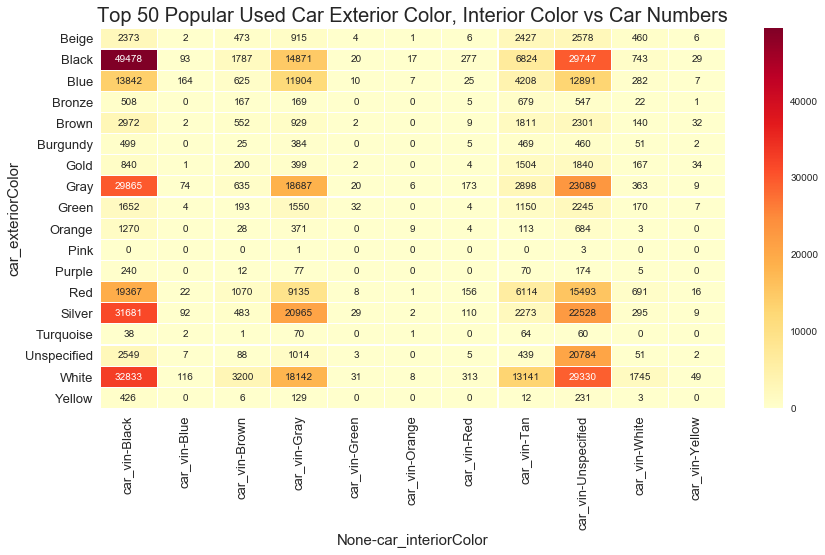

In [448]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Top 50 Popular Used Car Exterior Color, Interior Color vs Car Numbers', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
# ax.set_xlabel('car_interiorColor', fontsize=20)
sns.heatmap(car_fax_top50model.pivot_table(index= ['car_exteriorColor'],
                    columns=['car_interiorColor'],
                    values=['car_vin'],
                    aggfunc='count').fillna(0), 
           cmap="YlOrRd",
            ax = ax,
            linewidths=.2,
            annot = True,
            fmt ='g'
           )

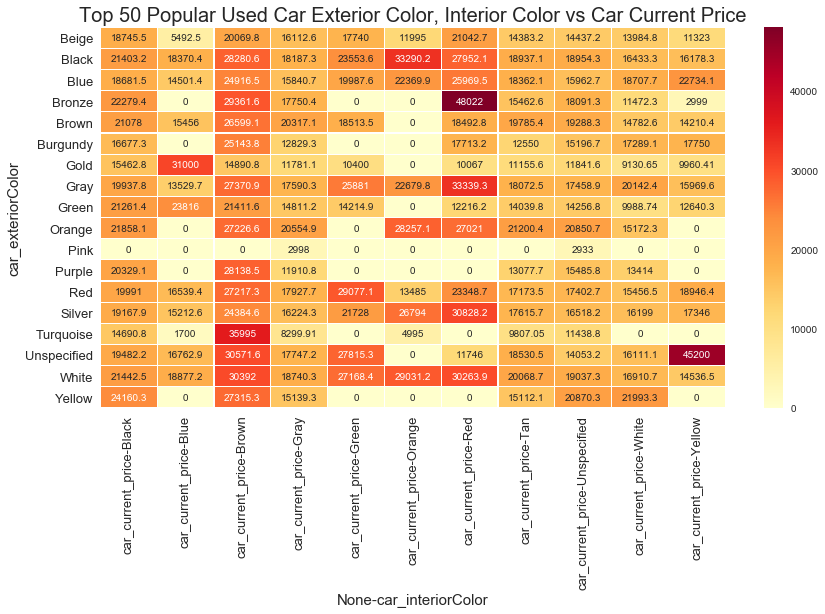

In [447]:
fig,ax = plt.subplots(figsize=(14,7))
ax.tick_params(labelsize=13)
ax.set_title('Top 50 Popular Used Car Exterior Color, Interior Color vs Car Current Price', fontsize=20)
ax.yaxis.label.set_size(15)
ax.xaxis.label.set_size(15)
# ax.set_xlabel('car_interiorColor', fontsize=20)
sns.heatmap(car_fax_top50model.pivot_table(index= ['car_exteriorColor'],
                    columns=['car_interiorColor'],
                    values=['car_current_price'],
                    aggfunc='mean').fillna(0), 
           cmap="YlOrRd",
            ax = ax,
            linewidths=.2,
            annot = True,
            fmt ='g'
           )

In [434]:
car_fax.columns

Index([u'dealer_id', u'dealer_name', u'dealer_city', u'dealer_state',
       u'car_vin', u'car_year', u'car_make', u'car_topOptions', u'car_model',
       u'car_trim', u'car_mileage', u'car_list_price', u'car_current_price',
       u'car_exteriorColor', u'car_interiorColor', u'car_engine',
       u'car_displacement', u'car_drivetype', u'car_transmission', u'car_fuel',
       u'car_mpgCity', u'car_mpgHighway', u'car_mpgCombined', u'car_bodytype',
       u'car_oneOwner', u'car_noAccidents', u'car_serviceRecords',
       u'car_personalUse', u'crawl_time'],
      dtype='object')